In [4]:
import numpy as np 
import pandas as pd

import sklearn as sk  
import seaborn as sns

import matplotlib.pyplot as plt

import opendatasets as od
import matplotlib.dates as mdates
import scipy.stats as stats

from scipy.stats import genpareto, norm, gaussian_kde

from scipy.stats import anderson, levene, bartlett, gumbel_r, genextreme
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import random

import ruptures as rpt 

In [8]:
df = pd.read_csv('ethereum-price-usd-2016-2023/ETH-USD.csv')
dataframe = df[['Date', 'Close']]
dataframe.set_index("Date", inplace = True)

historico = dataframe["Close"].values.reshape(-1,1)

In [9]:
def find_threshold(data, n=100, alpha=0.2):
    ########3Identificamos a los condidatos de los mejores umbrales u_1,...,u_n
    u1 = np.median(data)
    u98 = np.percentile(data, 98)
    
    #####Revisamos si hay mas de 100 valores arriba del percentil 98
    above_u98 = data[data > u98]
    if len(above_u98) < 100:
        un = np.sort(above_u98)[-1]  ### Se usa el ultimo en otro caso xddddddddd
    else:
        un = u98
    
    thresholds = np.linspace(u1, un, n)
    
    #Testeamos todos los umbrales usando la prueba de pearson 
    for i in range(len(thresholds)):
        u = thresholds[i]
        if i == 0:
            diffs = np.diff(genpareto.fit(data[data > u]))
        else:
            diffs = np.diff(genpareto.fit(data[data > u]), prepend=diffs[-1])
        
        _, p_value = norm.fit(diffs)
        
        if p_value > alpha:
            return u  #Booom baby... aqui esta el threshold ideal xddd
    
    return un  #Regresa el ultimo con una advertencia xdddd

def calculate_bic(data, shape, loc, scale):
    n = len(data)
    log_likelihood = np.sum(genpareto.logpdf(data, shape, loc=loc, scale=scale))
    k = 3  #####Número de parámetros de la GPD (shape, loc, scale) es necesario este stuff 
    bic = k * np.log(n) - 2 * log_likelihood
    return bic

def evaluate_penalty_bic(historico, pen, min_size=28):
    algo = rpt.Pelt(model="l2", min_size=min_size)
    algo.fit(historico)
    result = algo.predict(pen=pen)
    
    bic_total = 0
    for i in range(len(result) - 1):
        start, end = result[i], result[i + 1]
        segment = historico[start:end]
        umbral_chido = find_threshold(segment)
        excesos = segment[segment > umbral_chido] - umbral_chido
        if len(excesos) > 0:
            shape, loc, scale = genpareto.fit(excesos)
            bic = calculate_bic(excesos, shape, loc, scale)
            bic_total += bic
    
    return bic_total

Mejor penalización: 18367.979591836734, Mejor BIC: 4468.519628557711


<Figure size 2000x2000 with 0 Axes>

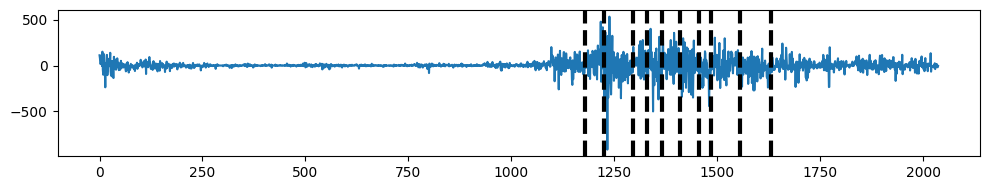

In [10]:
temp = historico.flatten()
diff_historico = np.diff(temp)
pen_values = np.linspace(1, 50000, 50) 
best_pen = None
best_bic = np.inf

for pen in pen_values:
    bic = evaluate_penalty_bic(diff_historico, pen)
    if bic < best_bic:
        best_bic = bic
        best_pen = pen

print(f"Mejor penalización: {best_pen}, Mejor BIC: {best_bic}")

algo = rpt.Pelt(model="l2", min_size=28)
algo.fit(diff_historico)
result = algo.predict(pen=best_pen)
#sparams=(shape, loc, scale), plot=plt
#plt.title(f'Q-Q Plot (Segmento {i+1})')
plt.figure(figsize=(20,20))
rpt.display(diff_historico, [], result)
plt.show()

In [11]:
segments = []
start_idx = 0
for change_point in result:
    end_idx = change_point
    segment = diff_historico[start_idx:end_idx]
    segments.append(segment)
    start_idx = end_idx
    
alpha = 0.05

Segmento 1 (Positivo): Umbral = 8.78, Shape = 0.53, Loc = 0.03, Scale = 13.56


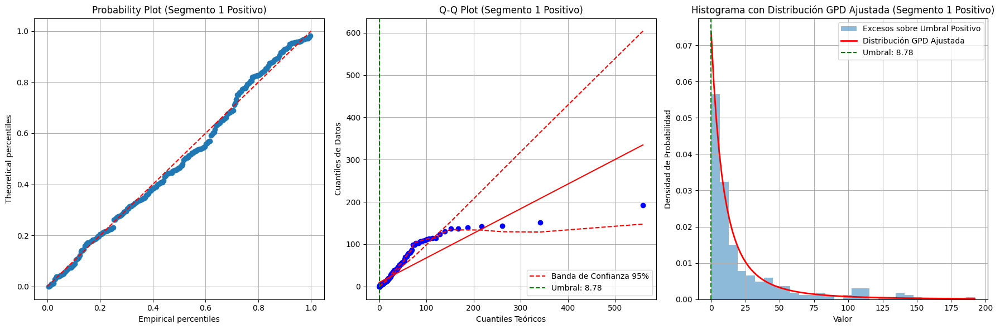

Segmento 1 (Negativo): Umbral = -5.21, Shape = 0.41, Loc = 0.03, Scale = 14.75


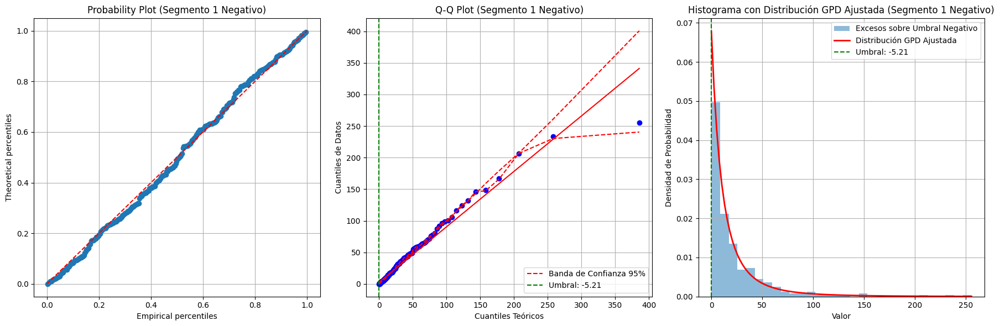

Segmento 2 (Positivo): Umbral = 72.33, Shape = 0.11, Loc = 11.19, Scale = 93.53


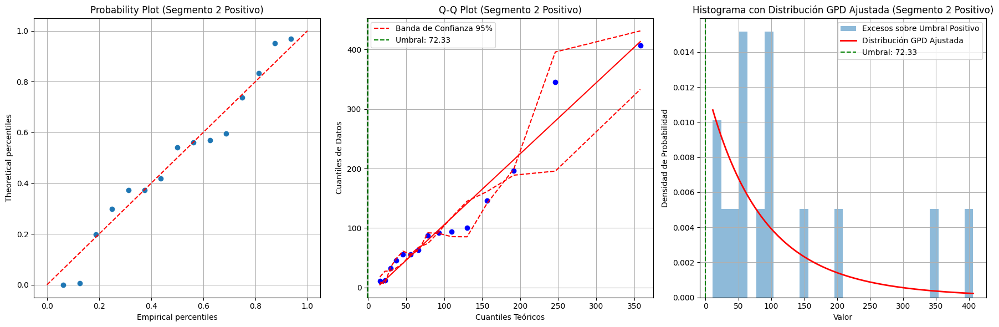

Segmento 2 (Negativo): Umbral = -79.00, Shape = -1.32, Loc = -0.32, Scale = 130.35


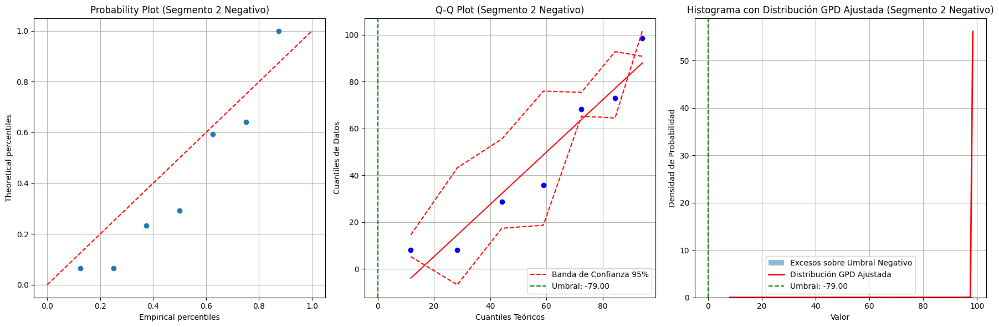

Segmento 3 (Positivo): Umbral = 90.83, Shape = 0.54, Loc = 4.78, Scale = 55.29


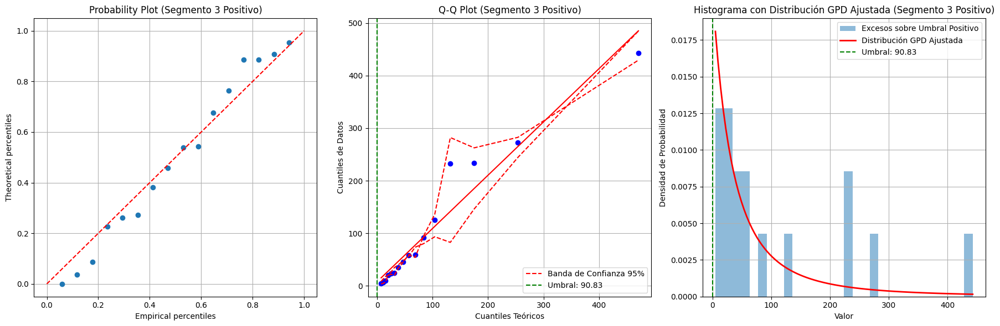

Segmento 3 (Negativo): Umbral = -124.83, Shape = 0.55, Loc = 10.09, Scale = 73.96


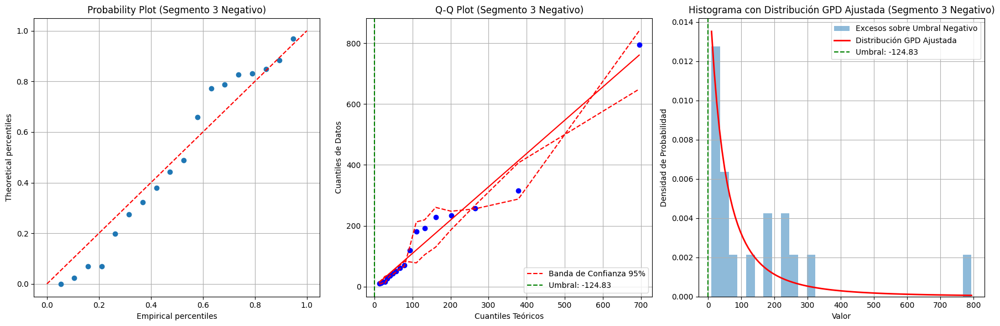

Segmento 4 (Positivo): Umbral = 69.25, Shape = -1.14, Loc = -1.64, Scale = 240.40


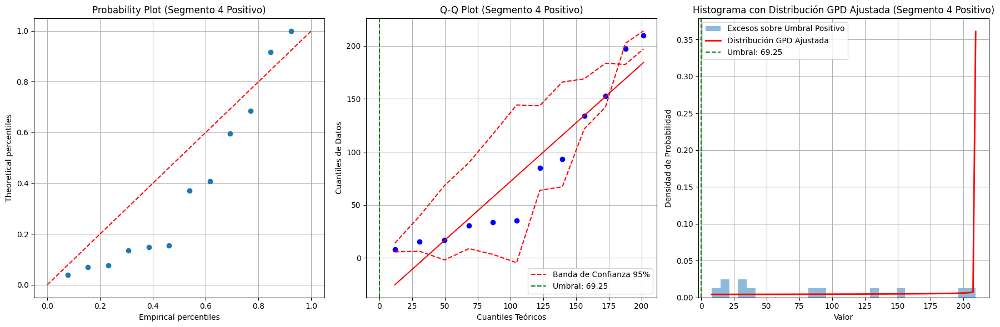

Segmento 4 (Negativo): Umbral = -84.33, Shape = -2.44, Loc = 0.16, Scale = 169.53


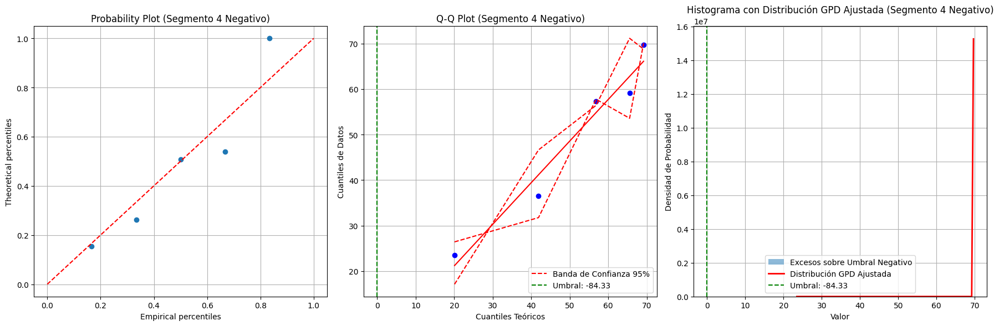

Segmento 5 (Positivo): Umbral = 139.86, Shape = 0.40, Loc = 3.80, Scale = 53.34


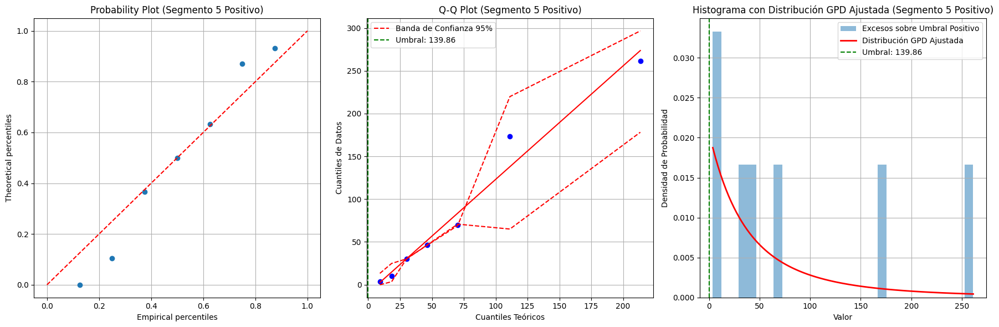

Segmento 5 (Negativo): Umbral = -113.58, Shape = 0.73, Loc = 11.01, Scale = 43.50


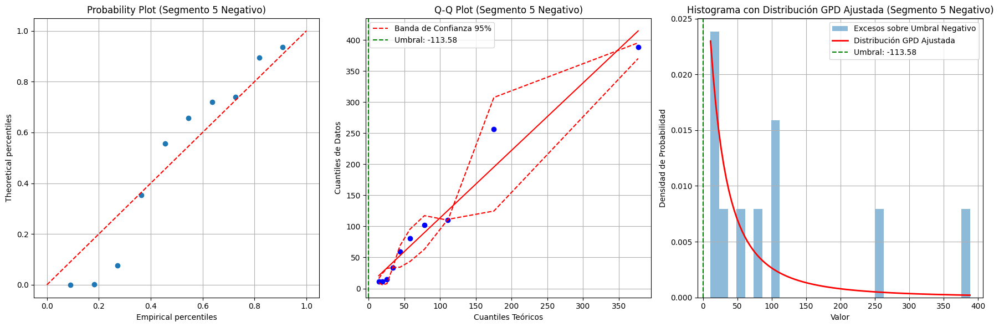

Segmento 6 (Positivo): Umbral = 113.63, Shape = -0.14, Loc = 5.87, Scale = 89.16


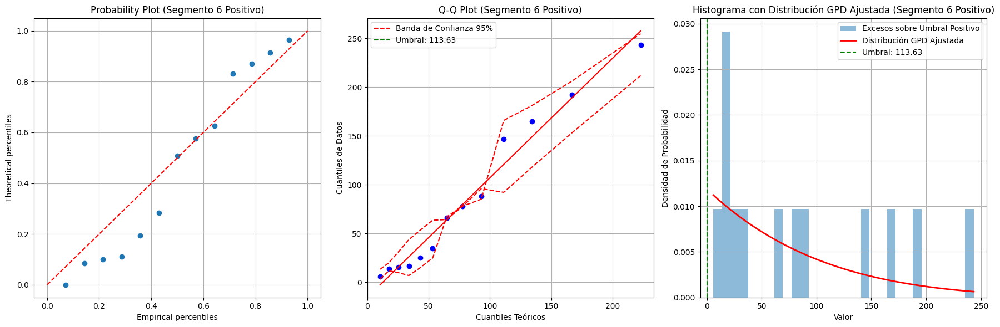

Segmento 6 (Negativo): Umbral = -83.95, Shape = 0.41, Loc = 0.19, Scale = 19.91


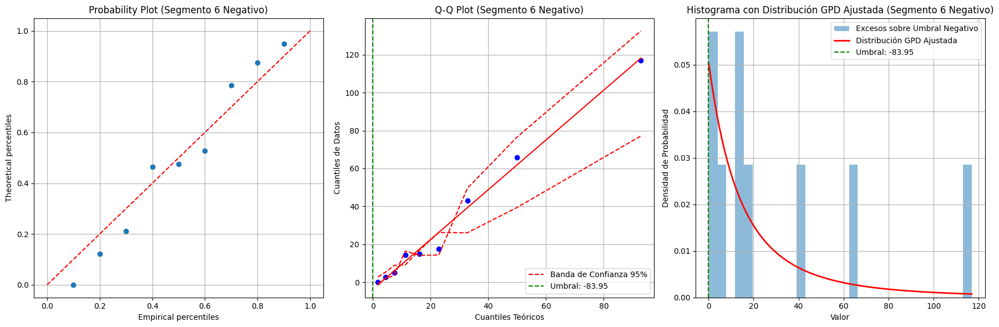

Segmento 7 (Positivo): Umbral = 117.96, Shape = -1.15, Loc = -0.71, Scale = 207.34


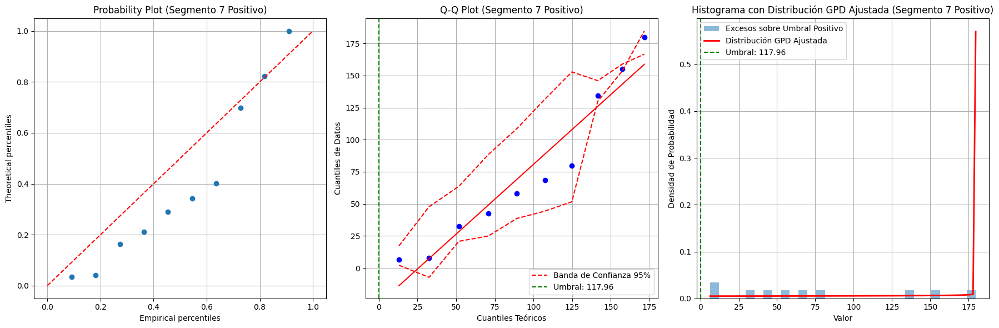

Segmento 7 (Negativo): Umbral = -75.69, Shape = -1.29, Loc = -1.50, Scale = 357.22


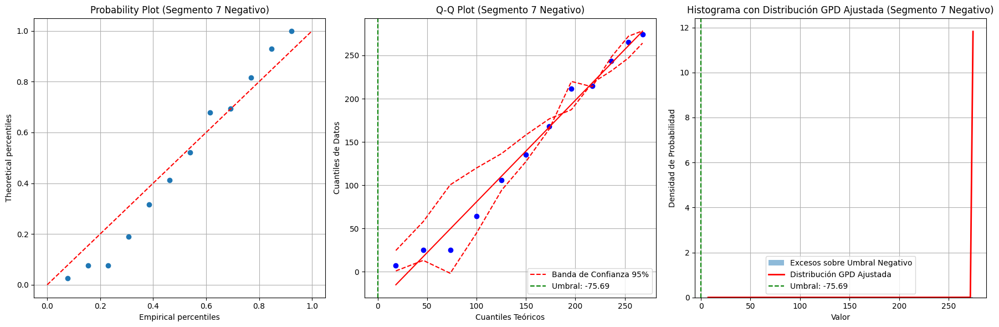

Segmento 8 (Positivo): Umbral = 63.75, Shape = -1.30, Loc = -0.32, Scale = 118.92


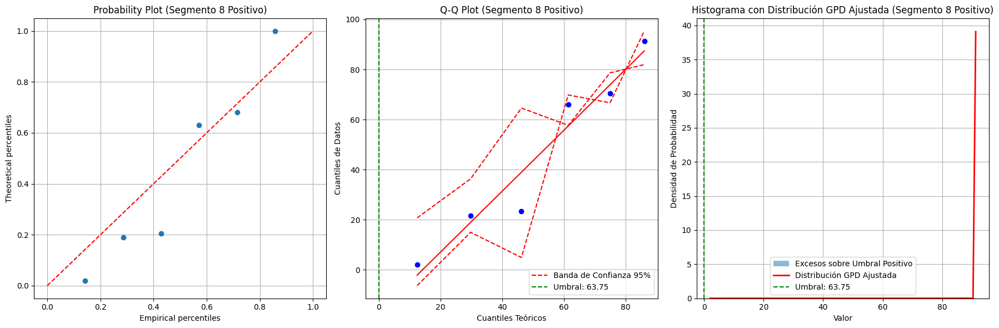

Segmento 8 (Negativo): Umbral = -112.60, Shape = 0.23, Loc = 11.37, Scale = 65.36


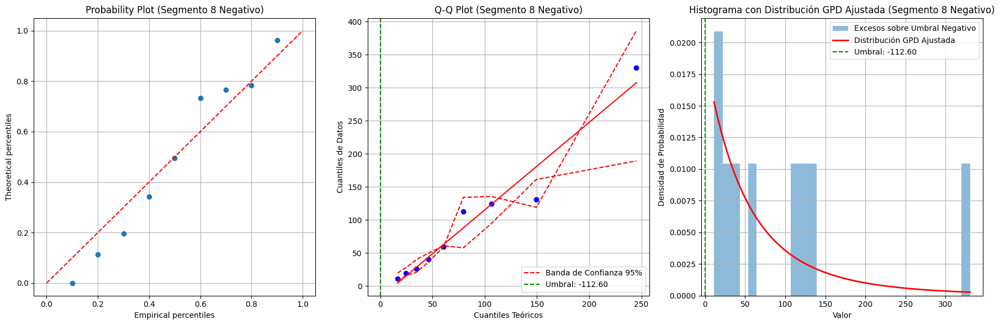

Segmento 9 (Positivo): Umbral = 65.48, Shape = 0.06, Loc = 6.27, Scale = 64.03


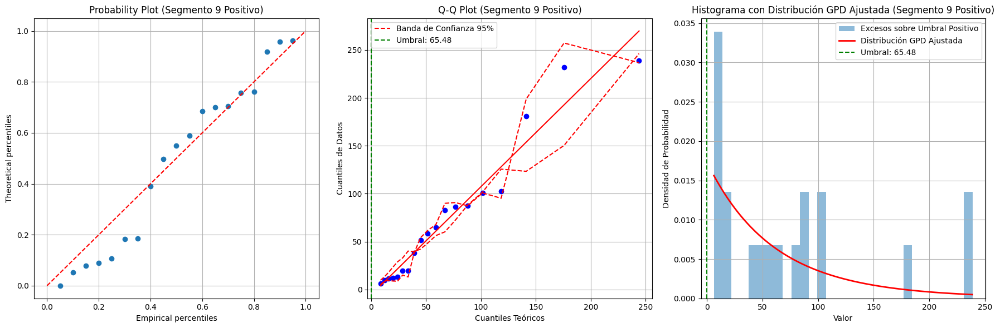

Segmento 9 (Negativo): Umbral = -55.81, Shape = -0.57, Loc = 1.46, Scale = 118.42


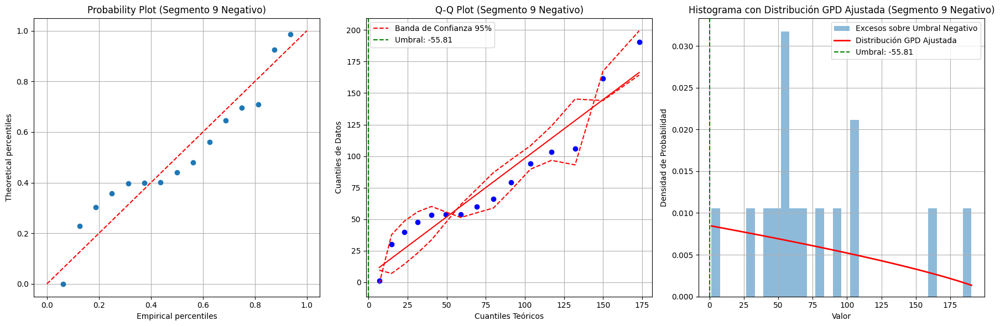

Segmento 10 (Positivo): Umbral = 53.40, Shape = -0.13, Loc = 0.68, Scale = 42.43


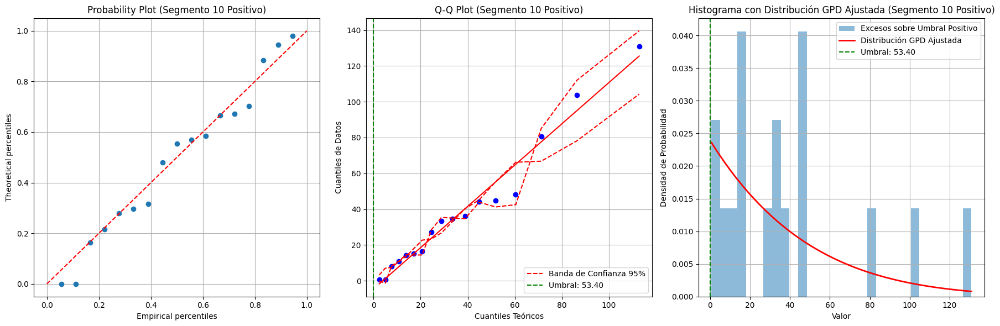

Segmento 10 (Negativo): Umbral = -85.42, Shape = -1.11, Loc = -1.02, Scale = 209.10


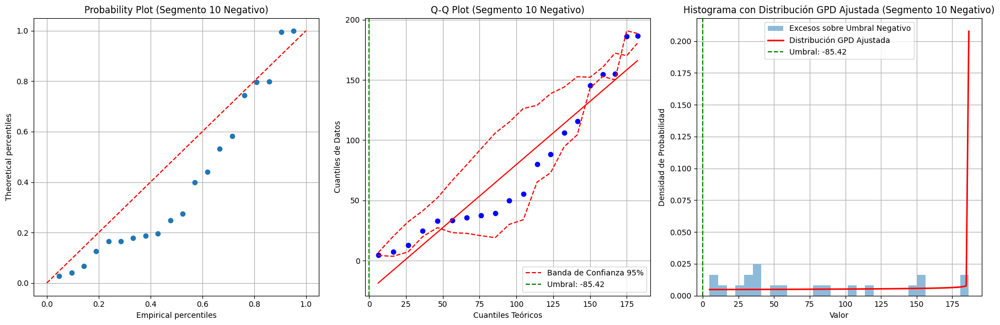

Segmento 11 (Positivo): Umbral = 28.39, Shape = -0.04, Loc = 0.10, Scale = 41.51


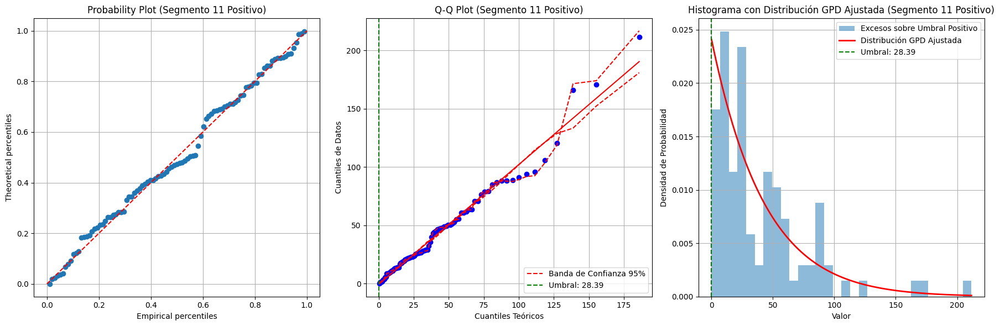

Segmento 11 (Negativo): Umbral = -19.43, Shape = 0.15, Loc = 0.71, Scale = 31.44


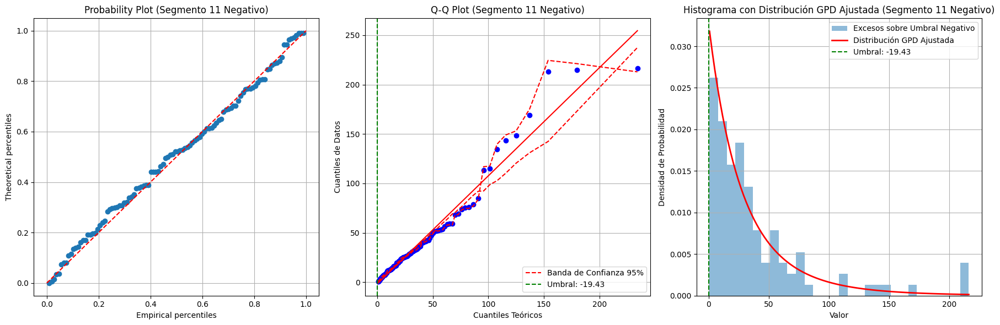

In [12]:
for i, segment in enumerate(segments):
    segment_df = pd.DataFrame(segment, columns=['value'])
    data = segment_df['value']

    # Separar tasas positivas y negativas
    data_pos = data[data >= 0]
    data_neg = data[data < 0]

    # Análisis para tasas positivas
    if len(data_pos) > 0:
        umbral_pos = find_threshold(data_pos)
        excesos_pos = data_pos[data_pos > umbral_pos] - umbral_pos
        if len(excesos_pos) > 0:
            shape_pos, loc_pos, scale_pos = genpareto.fit(excesos_pos)
            print(f"Segmento {i+1} (Positivo): Umbral = {umbral_pos:.2f}, Shape = {shape_pos:.2f}, Loc = {loc_pos:.2f}, Scale = {scale_pos:.2f}")

            plt.figure(figsize=(18, 6))

            # P-P plot
            excesos_sorted_pos = np.sort(excesos_pos)
            empirical_percentiles_pos = np.arange(1, len(excesos_sorted_pos) + 1) / (len(excesos_sorted_pos) + 1)
            theoretical_percentiles_pos = genpareto.cdf(excesos_sorted_pos, c=shape_pos, loc=loc_pos, scale=scale_pos)

            plt.subplot(1, 3, 1)
            plt.plot(empirical_percentiles_pos, theoretical_percentiles_pos, 'o')
            plt.plot([0, 1], [0, 1], 'r--')
            plt.xlabel('Empirical percentiles')
            plt.ylabel('Theoretical percentiles')
            plt.title(f'Probability Plot (Segmento {i+1} Positivo)')
            plt.grid(True)

            # Q-Q plot
            plt.subplot(1, 3, 2)
            res_pos = stats.probplot(excesos_pos, dist="genpareto", sparams=(shape_pos, loc_pos, scale_pos), plot=plt)
            plt.title(f'Q-Q Plot (Segmento {i+1} Positivo)')

            # Agregar bandas de confianza del 95%
            percs = np.linspace(0, 100, len(excesos_pos))
            ql = np.percentile(res_pos[0][0], percs)
            qu = np.percentile(res_pos[0][1], percs)
            z = stats.norm.ppf(1 - alpha/2)
            se = (qu - ql) / np.sqrt(len(excesos_pos))
            ci_low = ql - z * se
            ci_high = qu + z * se

            plt.plot(ql, ci_low, linestyle='--', color='r', label='Banda de Confianza 95%')
            plt.plot(ql, ci_high, linestyle='--', color='r')
            plt.axvline(x=0, color='g', linestyle='--', label=f'Umbral: {umbral_pos:.2f}')
            plt.xlabel('Cuantiles Teóricos')
            plt.ylabel('Cuantiles de Datos')
            plt.grid(True)
            plt.legend()

            # Histograma con la distribución GPD ajustada
            plt.subplot(1, 3, 3)
            plt.hist(excesos_pos, bins=30, density=True, alpha=0.5, label='Excesos sobre Umbral Positivo')
            x = np.linspace(min(excesos_pos), max(excesos_pos), 100)
            y = genpareto.pdf(x, shape_pos, loc_pos, scale_pos)
            plt.plot(x, y, 'r-', lw=2, label='Distribución GPD Ajustada')
            plt.axvline(x=0, color='g', linestyle='--', label=f'Umbral: {umbral_pos:.2f}')
            plt.xlabel('Valor')
            plt.ylabel('Densidad de Probabilidad')
            plt.title(f'Histograma con Distribución GPD Ajustada (Segmento {i+1} Positivo)')
            plt.legend()
            plt.grid(True)

            plt.tight_layout()
            plt.show()

    # Análisis para tasas negativas
    if len(data_neg) > 0:
        umbral_neg = find_threshold(data_neg)
        excesos_neg = np.abs(data_neg[data_neg < umbral_neg]) - np.abs(umbral_neg)
        if len(excesos_neg) > 0:
            shape_neg, loc_neg, scale_neg = genpareto.fit(excesos_neg)
            print(f"Segmento {i+1} (Negativo): Umbral = {umbral_neg:.2f}, Shape = {shape_neg:.2f}, Loc = {loc_neg:.2f}, Scale = {scale_neg:.2f}")

            plt.figure(figsize=(18, 6))

            # P-P plot
            excesos_sorted_neg = np.sort(excesos_neg)
            empirical_percentiles_neg = np.arange(1, len(excesos_sorted_neg) + 1) / (len(excesos_sorted_neg) + 1)
            theoretical_percentiles_neg = genpareto.cdf(excesos_sorted_neg, c=shape_neg, loc=loc_neg, scale=scale_neg)

            plt.subplot(1, 3, 1)
            plt.plot(empirical_percentiles_neg, theoretical_percentiles_neg, 'o')
            plt.plot([0, 1], [0, 1], 'r--')
            plt.xlabel('Empirical percentiles')
            plt.ylabel('Theoretical percentiles')
            plt.title(f'Probability Plot (Segmento {i+1} Negativo)')
            plt.grid(True)

            # Q-Q plot
            plt.subplot(1, 3, 2)
            res_neg = stats.probplot(excesos_neg, dist="genpareto", sparams=(shape_neg, loc_neg, scale_neg), plot=plt)
            plt.title(f'Q-Q Plot (Segmento {i+1} Negativo)')

            # Agregar bandas de confianza del 95%
            percs = np.linspace(0, 100, len(excesos_neg))
            ql = np.percentile(res_neg[0][0], percs)
            qu = np.percentile(res_neg[0][1], percs)
            z = stats.norm.ppf(1 - alpha/2)
            se = (qu - ql) / np.sqrt(len(excesos_neg))
            ci_low = ql - z * se
            ci_high = qu + z * se

            plt.plot(ql, ci_low, linestyle='--', color='r', label='Banda de Confianza 95%')
            plt.plot(ql, ci_high, linestyle='--', color='r')
            plt.axvline(x=0, color='g', linestyle='--', label=f'Umbral: {umbral_neg:.2f}')
            plt.xlabel('Cuantiles Teóricos')
            plt.ylabel('Cuantiles de Datos')
            plt.grid(True)
            plt.legend()

            # Histograma con la distribución GPD ajustada
            plt.subplot(1, 3, 3)
            plt.hist(excesos_neg, bins=30, density=True, alpha=0.5, label='Excesos sobre Umbral Negativo')
            x = np.linspace(min(excesos_neg), max(excesos_neg), 100)
            y = genpareto.pdf(x, shape_neg, loc_neg, scale_neg)
            plt.plot(x, y, 'r-', lw=2, label='Distribución GPD Ajustada')
            plt.axvline(x=0, color='g', linestyle='--', label=f'Umbral: {umbral_neg:.2f}')
            plt.xlabel('Valor')
            plt.ylabel('Densidad de Probabilidad')
            plt.title(f'Histograma con Distribución GPD Ajustada (Segmento {i+1} Negativo)')
            plt.legend()
            plt.grid(True)

            plt.tight_layout()
            plt.show()

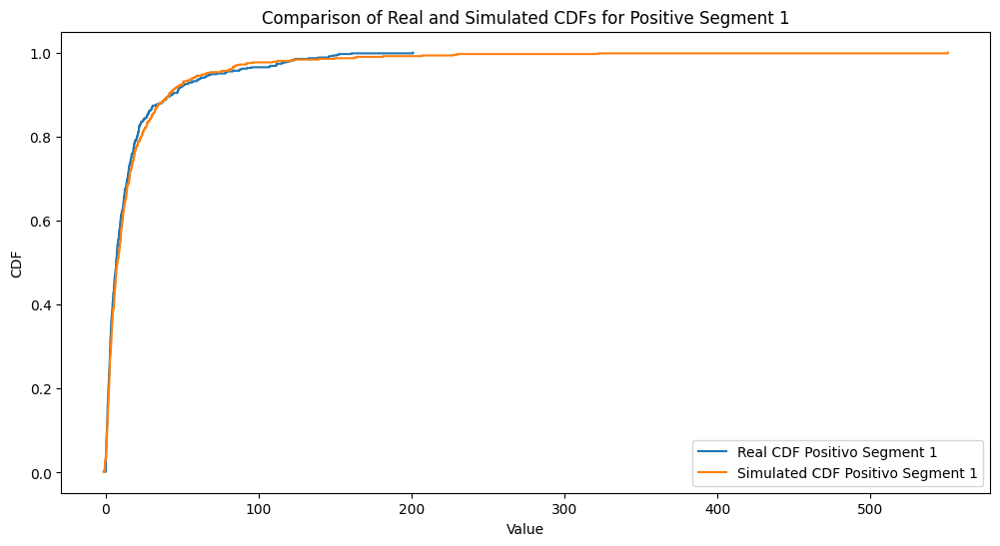

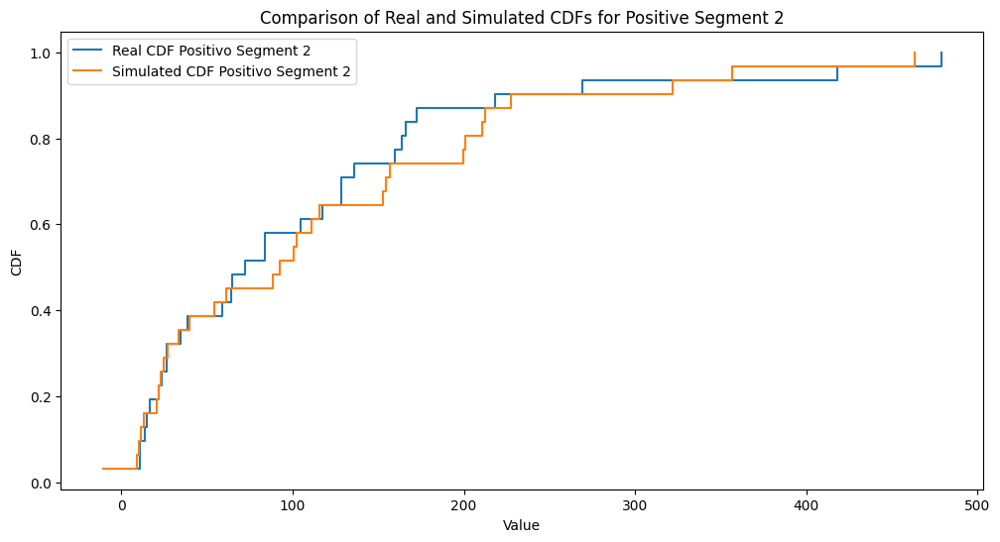

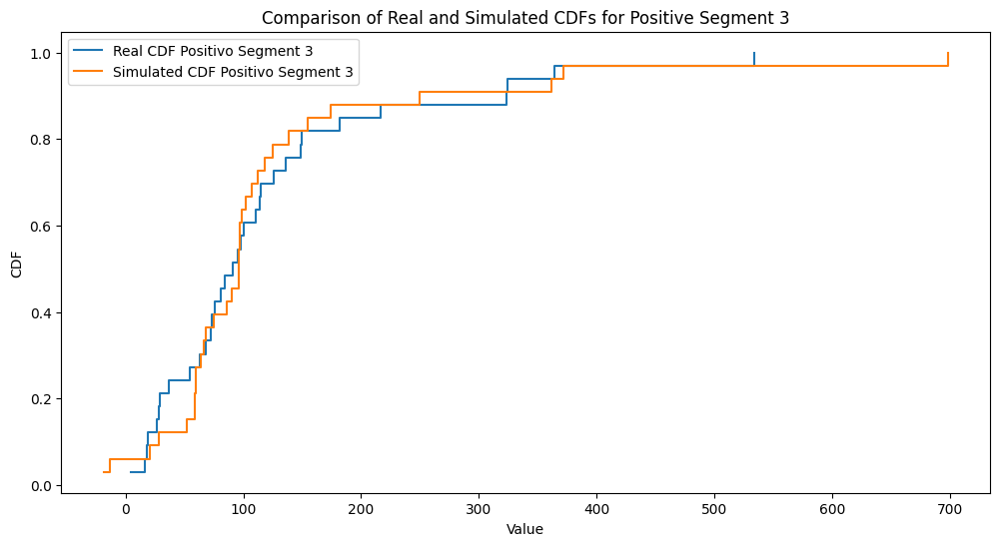

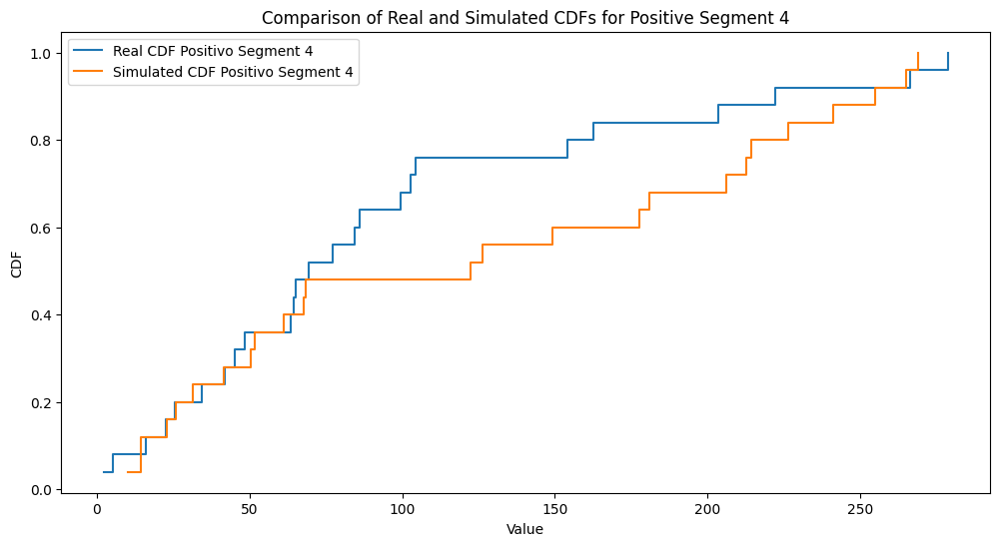

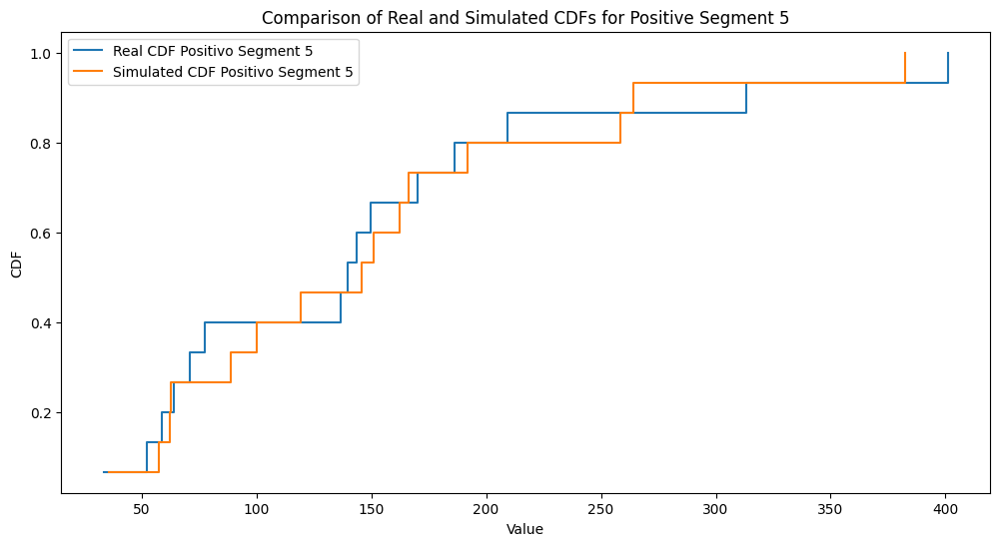

...

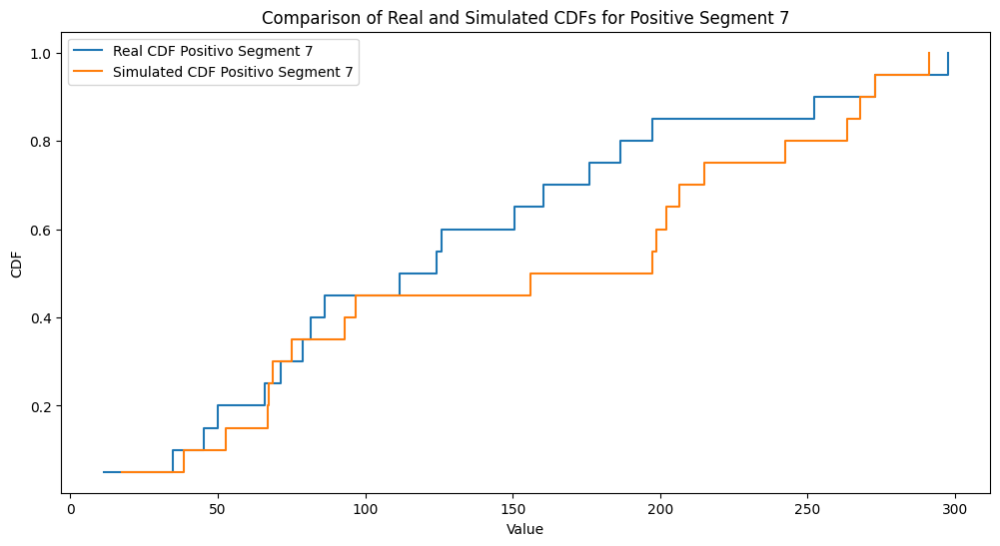

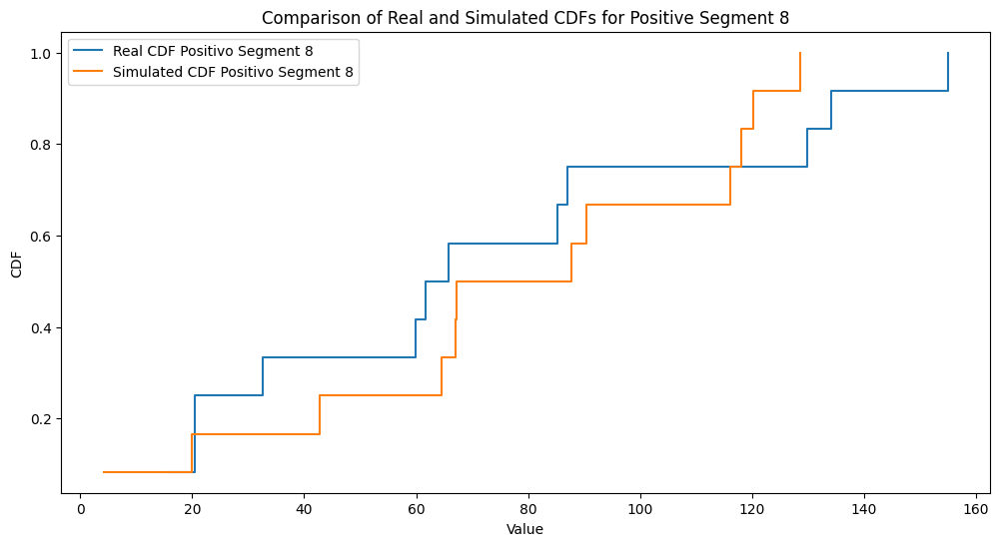

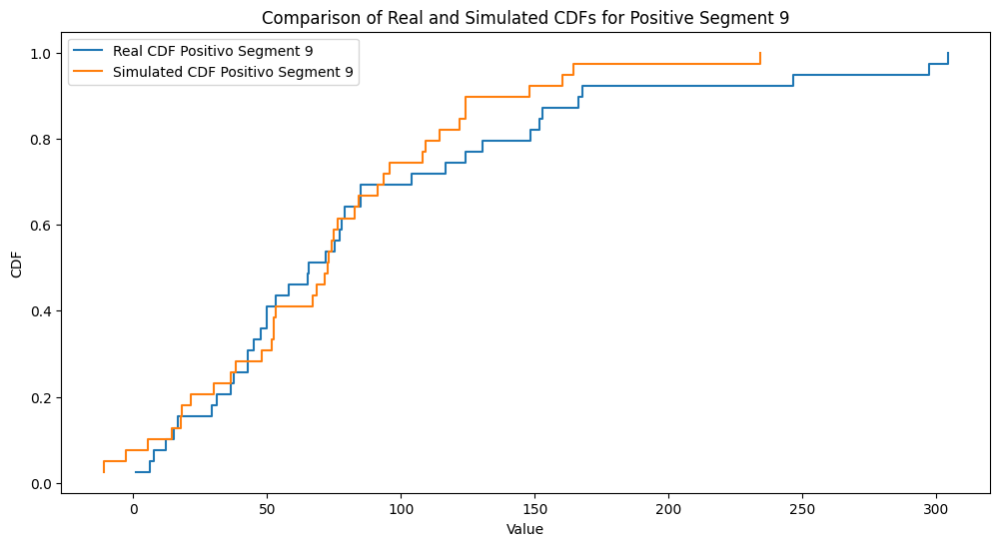

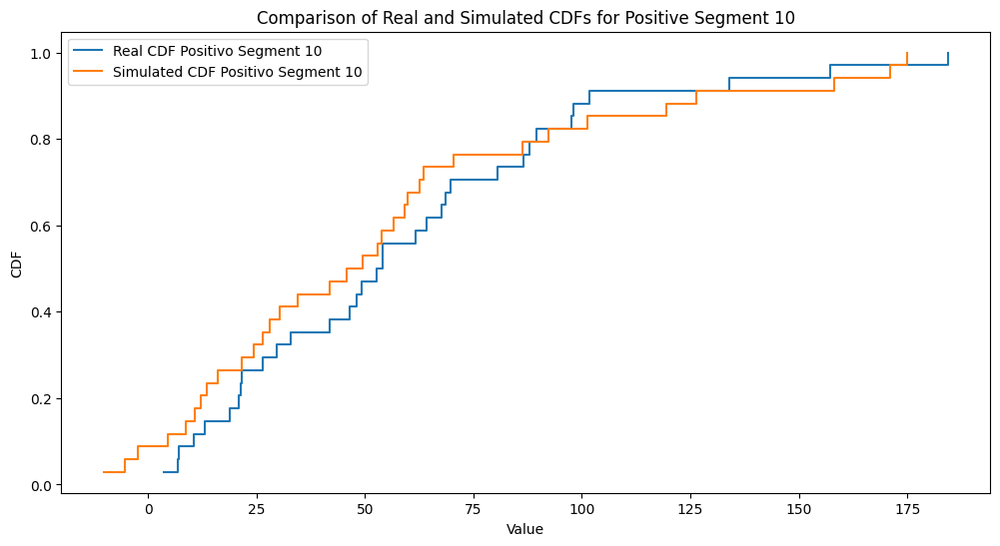

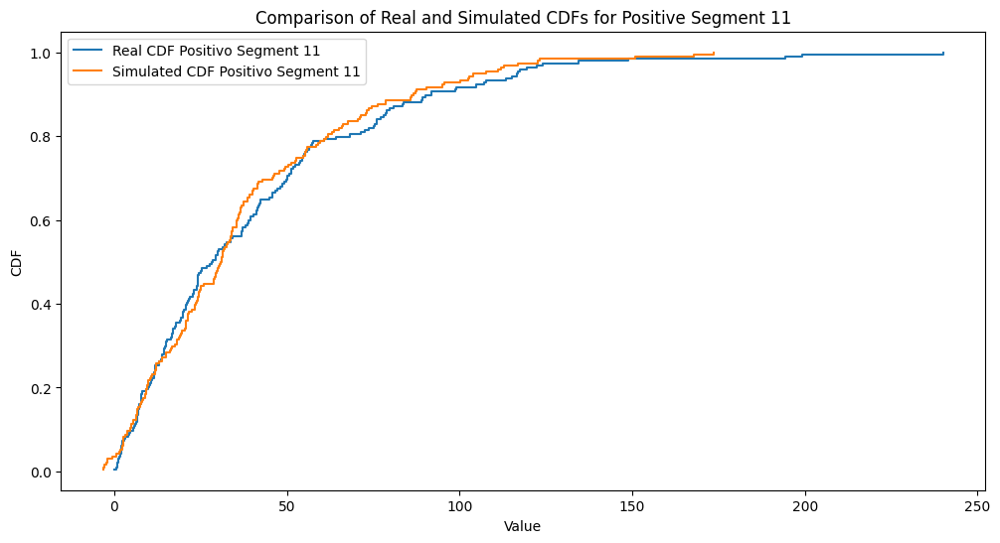

In [13]:
simulated_data_pos = []
simulated_data_neg = []
real_cdfs_pos = []
real_cdfs_neg = []
simulated_cdfs_pos = []
simulated_cdfs_neg = []

for i, segment in enumerate(segments):
    segment_df = pd.DataFrame(segment, columns=['value'])
    data = segment_df['value']

    data_pos = data[data >= 0]
    data_neg = data[data < 0]

    #------------Analisis para tasas positivas
    if len(data_pos) > 0:
        umbral_pos = find_threshold(data_pos)
        excesos_pos = data_pos[data_pos > umbral_pos] - umbral_pos
        if len(excesos_pos) > 0:
            shape_pos, loc_pos, scale_pos = genpareto.fit(excesos_pos)
            
            #-----KDE para valores menores o iguales al umbral
            kernel_data_pos = data_pos[data_pos <= umbral_pos]
            kde_pos = gaussian_kde(kernel_data_pos)

            #------Simulación
            num_simulations = len(data_pos)
            simulated_segment_pos = []

            for _ in range(num_simulations):
                if random.random() > 0.5:
                    simulated_value = kde_pos.resample(1)[0][0]
                else:
                    simulated_value = umbral_pos + genpareto.rvs(c=shape_pos, loc=loc_pos, scale=scale_pos)
                simulated_segment_pos.append(simulated_value)

            simulated_data_pos.append(np.array(simulated_segment_pos))
            
            #-----Calcular la CDF de los datos reales
            sorted_real_data_pos = np.sort(data_pos)
            cdf_real_data_pos = np.arange(1, len(sorted_real_data_pos) + 1) / len(sorted_real_data_pos)
            real_cdfs_pos.append((sorted_real_data_pos, cdf_real_data_pos))
            
            #------------------------------Calcular la CDF de los datos simulados
            sorted_simulated_data_pos = np.sort(simulated_segment_pos)
            cdf_simulated_data_pos = np.arange(1, len(sorted_simulated_data_pos) + 1) / len(sorted_simulated_data_pos)
            simulated_cdfs_pos.append((sorted_simulated_data_pos, cdf_simulated_data_pos))

    #-----Análisis para tasas negativas
    if len(data_neg) > 0:
        umbral_neg = find_threshold(data_neg)
        excesos_neg = np.abs(data_neg[data_neg < umbral_neg]) - np.abs(umbral_neg)
        if len(excesos_neg) > 0:
            shape_neg, loc_neg, scale_neg = genpareto.fit(excesos_neg)
            
            #------KDE para valores mayores o iguales al umbral
            kernel_data_neg = np.abs(data_neg[data_neg >= umbral_neg])
            kde_neg = gaussian_kde(kernel_data_neg)

            #------Simulación
            num_simulations = len(data_neg)
            simulated_segment_neg = []

            for _ in range(num_simulations):
                if random.random() > 0.5:
                    simulated_value = -kde_neg.resample(1)[0][0]
                else:
                    simulated_value = -(umbral_neg + genpareto.rvs(c=shape_neg, loc=loc_neg, scale=scale_neg))
                simulated_segment_neg.append(simulated_value)

            simulated_data_neg.append(np.array(simulated_segment_neg))
            
            #-----------Calcular la CDF de los datos reales
            sorted_real_data_neg = np.sort(data_neg)
            cdf_real_data_neg = np.arange(1, len(sorted_real_data_neg) + 1) / len(sorted_real_data_neg)
            real_cdfs_neg.append((sorted_real_data_neg, cdf_real_data_neg))
            
            #-----------Calcular la CDF de los datos simulados
            sorted_simulated_data_neg = np.sort(simulated_segment_neg)
            cdf_simulated_data_neg = np.arange(1, len(sorted_simulated_data_neg) + 1) / len(sorted_simulated_data_neg)
            simulated_cdfs_neg.append((sorted_simulated_data_neg, cdf_simulated_data_neg))

#-------------Graficar y comparar las CDFs positivas
num_segments_pos = len(real_cdfs_pos)
for i in range(num_segments_pos):
    plt.figure(figsize=(12, 6))
    sorted_real_data_pos, cdf_real_data_pos = real_cdfs_pos[i]
    sorted_simulated_data_pos, cdf_simulated_data_pos = simulated_cdfs_pos[i]
    
    plt.step(sorted_real_data_pos, cdf_real_data_pos, where='post', label=f'Real CDF Positivo Segment {i+1}')
    plt.step(sorted_simulated_data_pos, cdf_simulated_data_pos, where='post', linestyle='-', label=f'Simulated CDF Positivo Segment {i+1}')
    
    plt.xlabel('Value')
    plt.ylabel('CDF')
    plt.title(f'Comparison of Real and Simulated CDFs for Positive Segment {i+1}')
    plt.legend()
    plt.show()

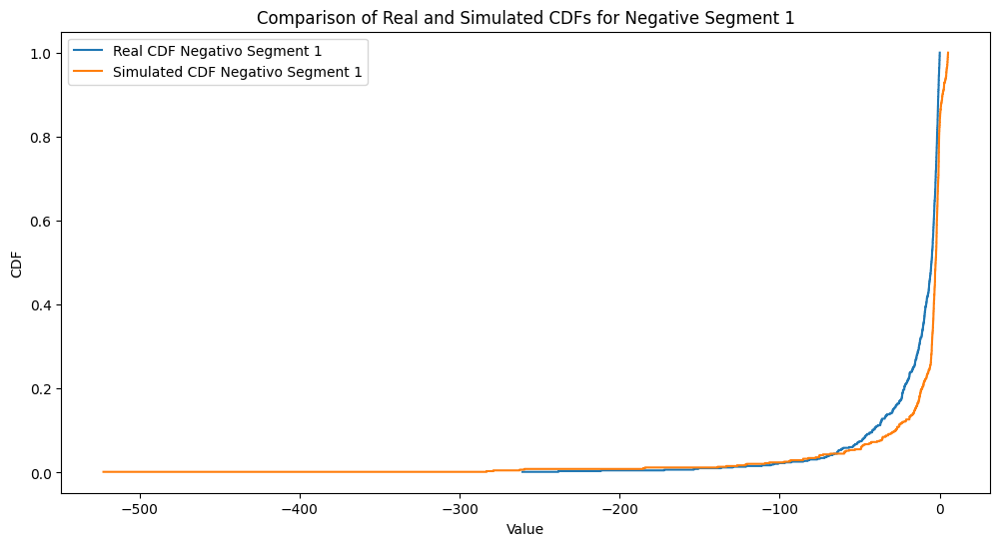

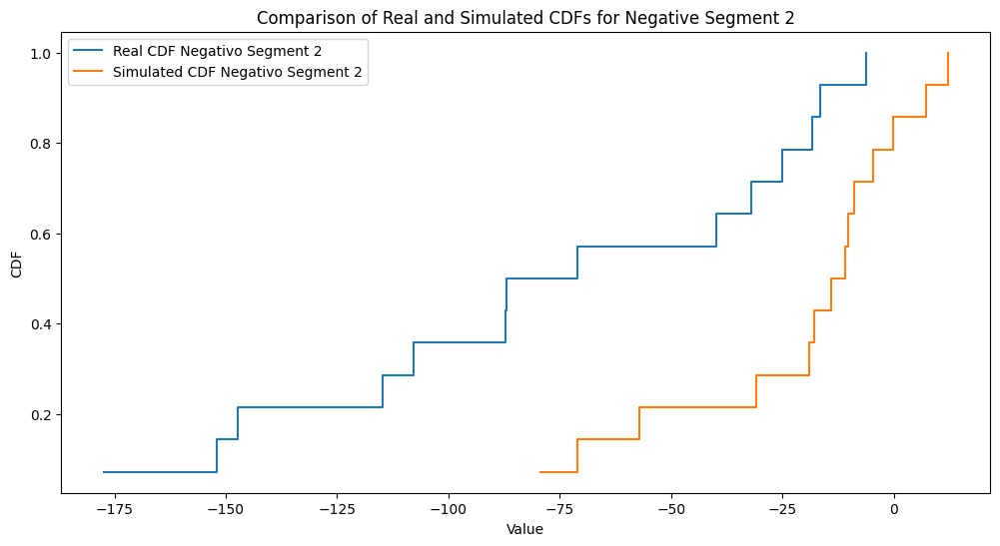

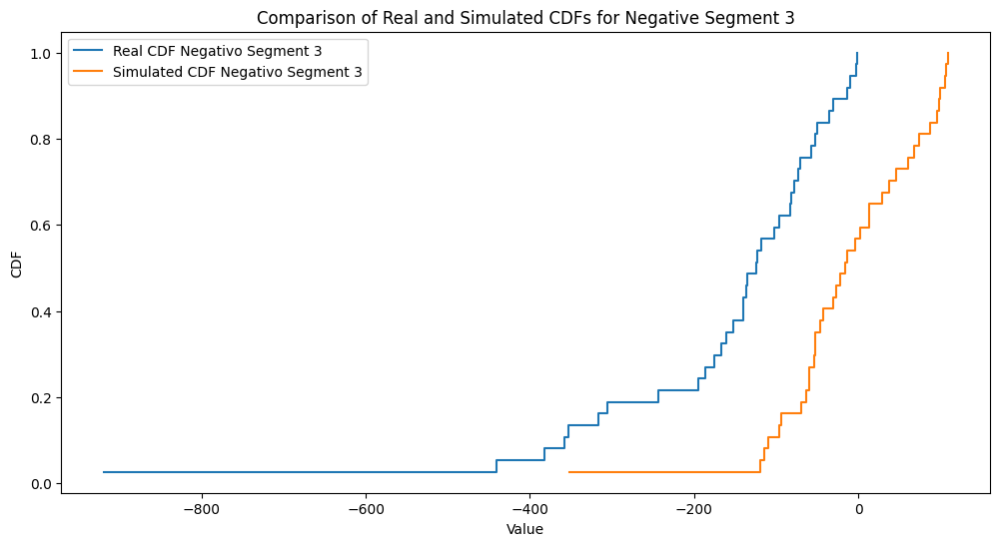

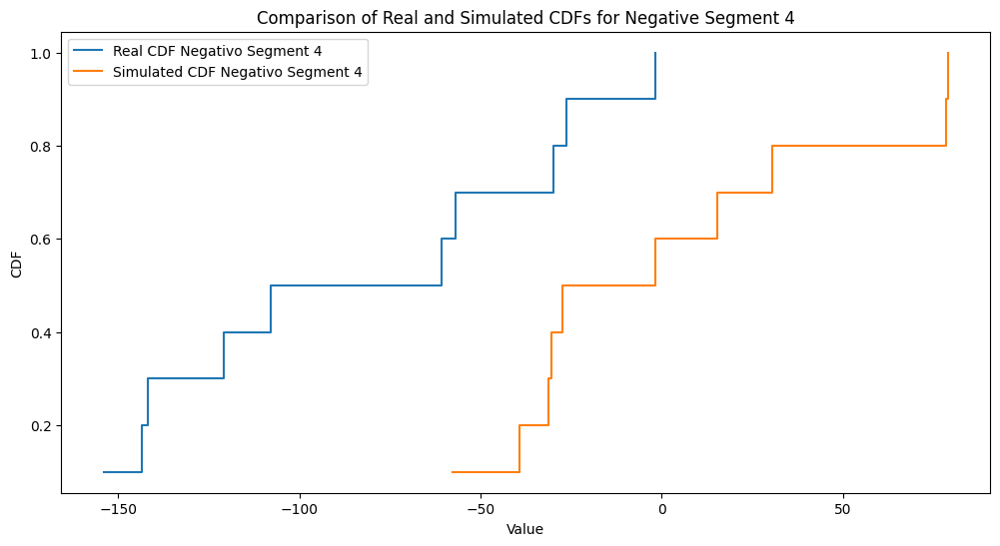

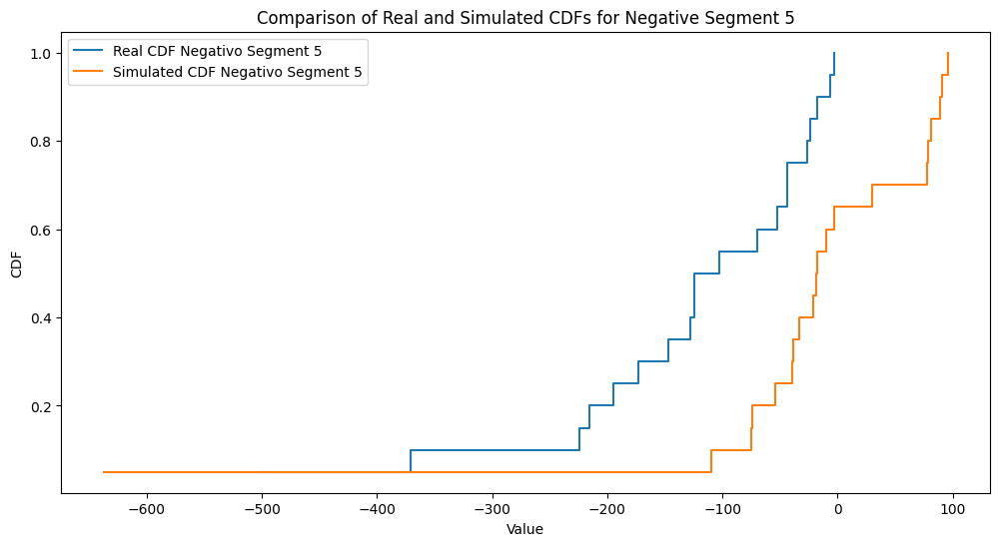

...

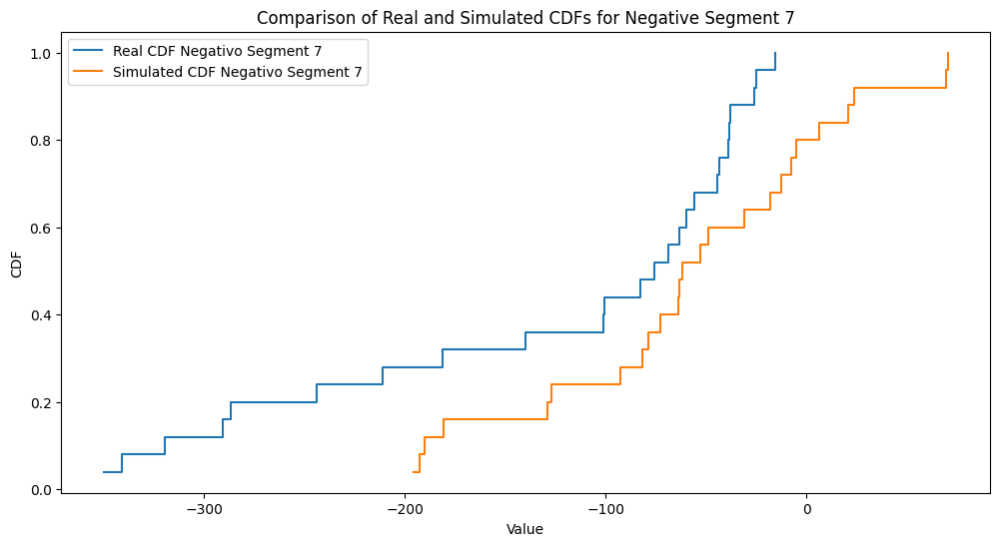

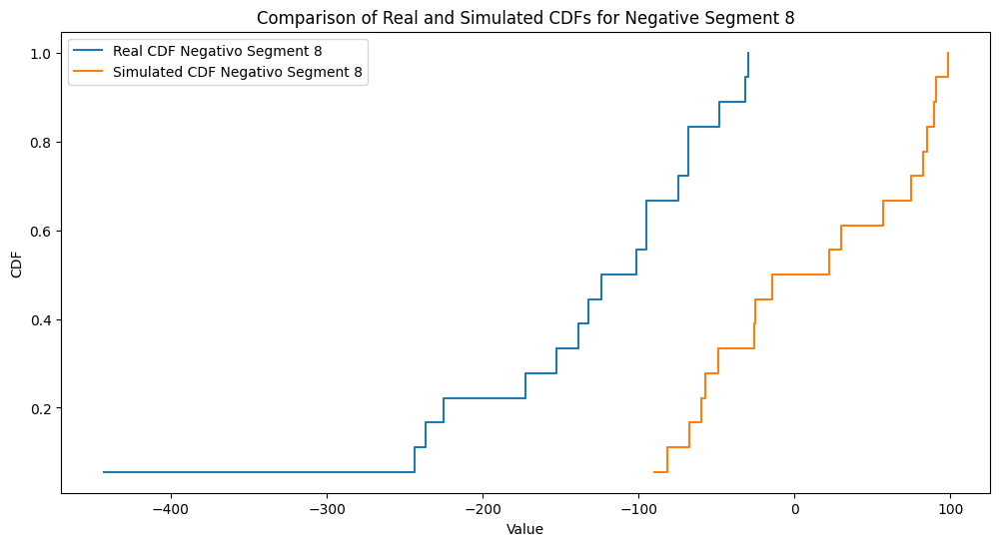

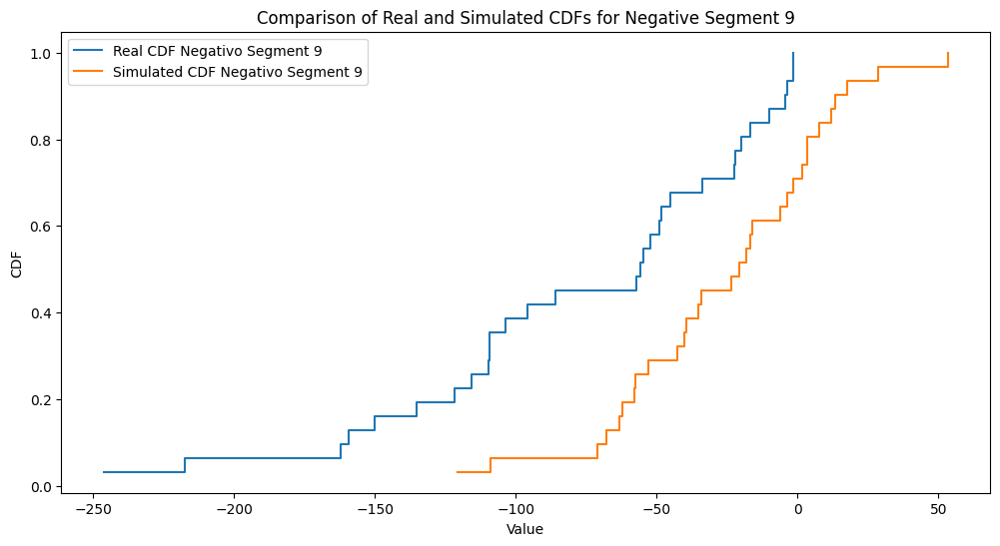

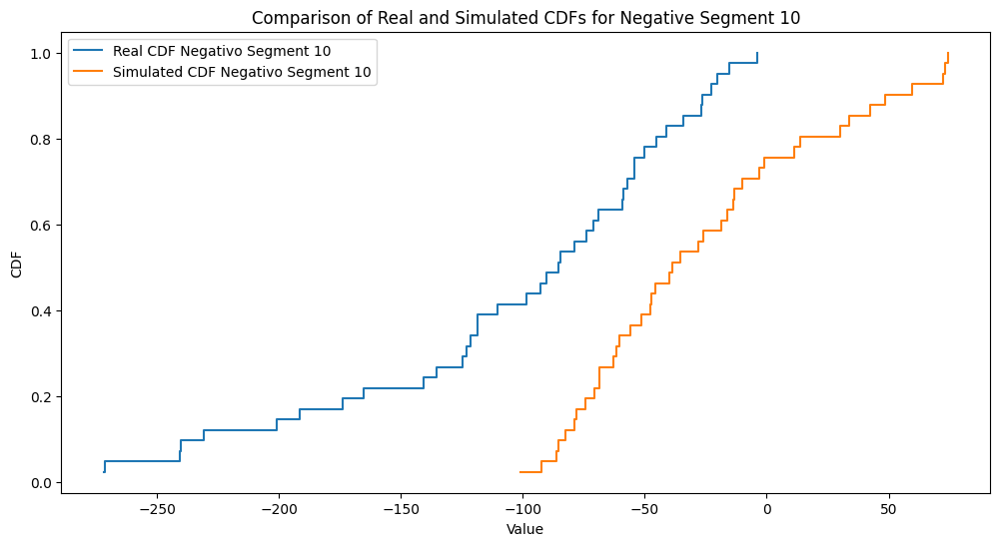

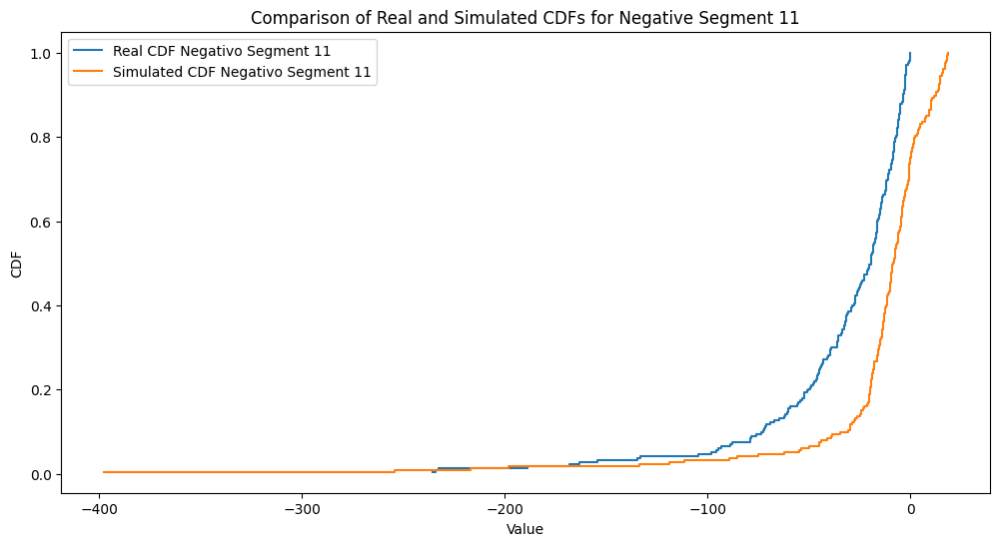

In [14]:
# Graficar y comparar las CDFs negativas
num_segments_neg = len(real_cdfs_neg)
for i in range(num_segments_neg):
    plt.figure(figsize=(12, 6))
    sorted_real_data_neg, cdf_real_data_neg = real_cdfs_neg[i]
    sorted_simulated_data_neg, cdf_simulated_data_neg = simulated_cdfs_neg[i]
    
    plt.step(sorted_real_data_neg, cdf_real_data_neg, where='post', label=f'Real CDF Negativo Segment {i+1}')
    plt.step(sorted_simulated_data_neg, cdf_simulated_data_neg, where='post', linestyle='-', label=f'Simulated CDF Negativo Segment {i+1}')
    
    plt.xlabel('Value')
    plt.ylabel('CDF')
    plt.title(f'Comparison of Real and Simulated CDFs for Negative Segment {i+1}')
    plt.legend()
    plt.show()

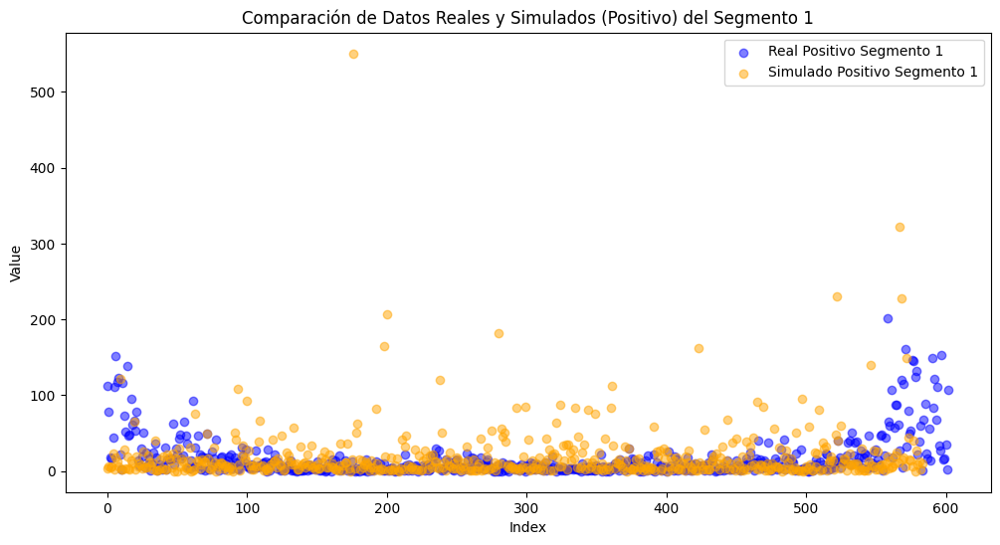

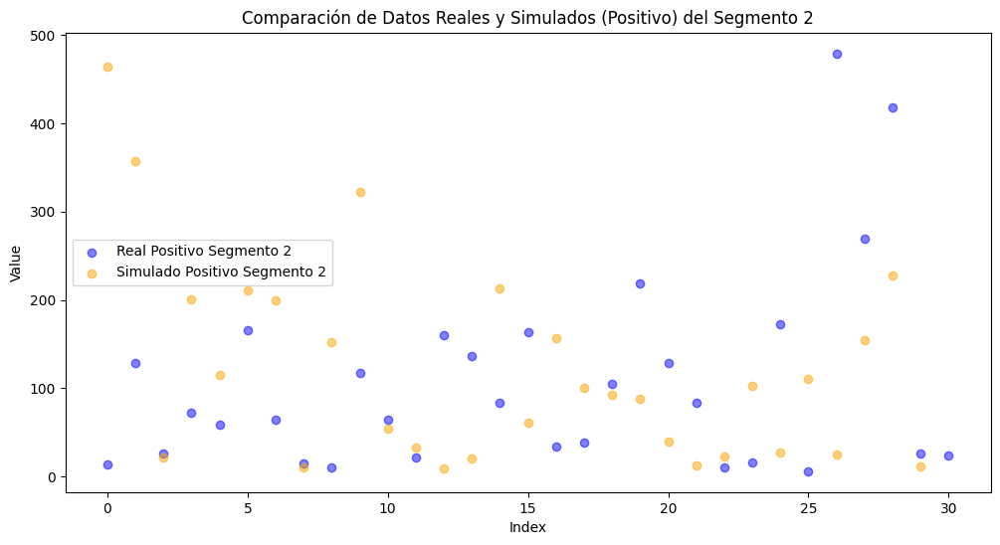

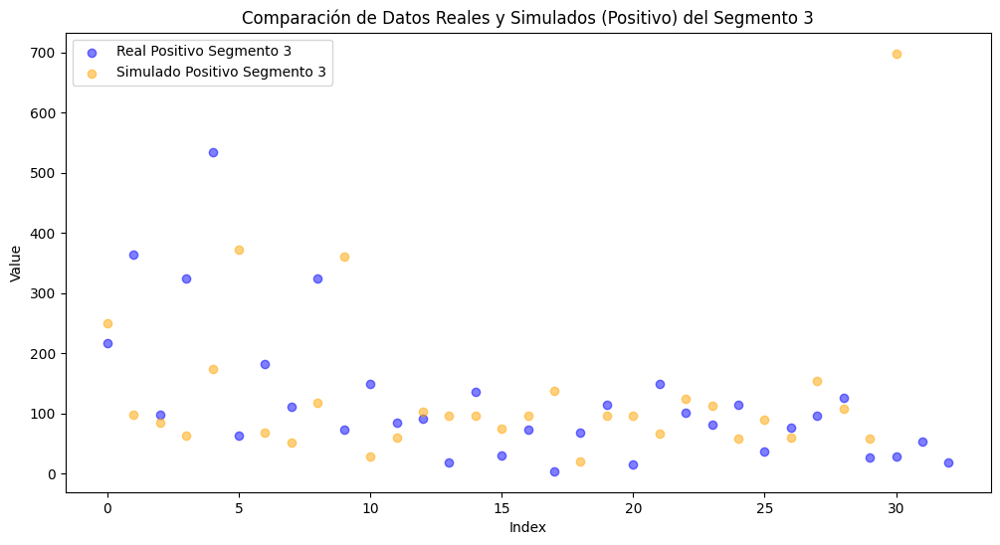

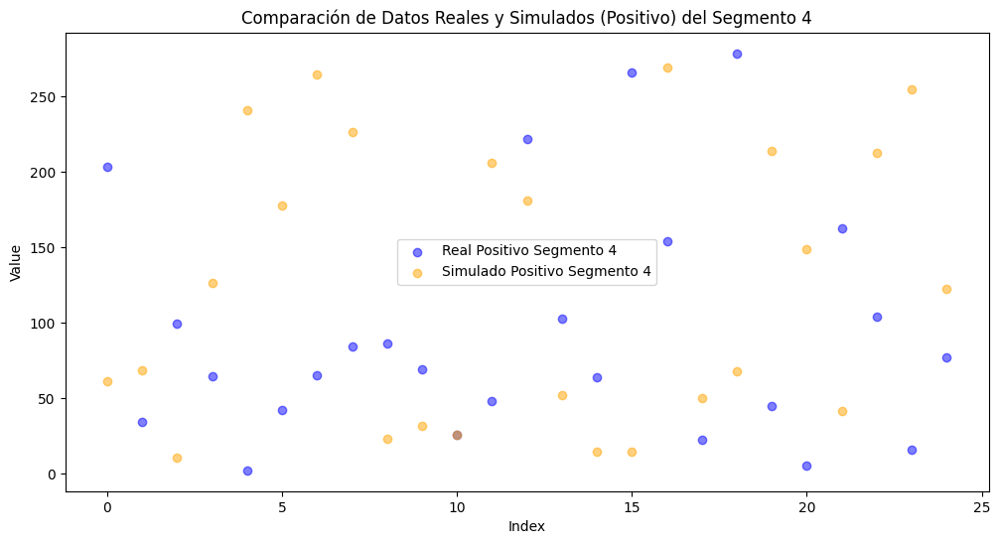

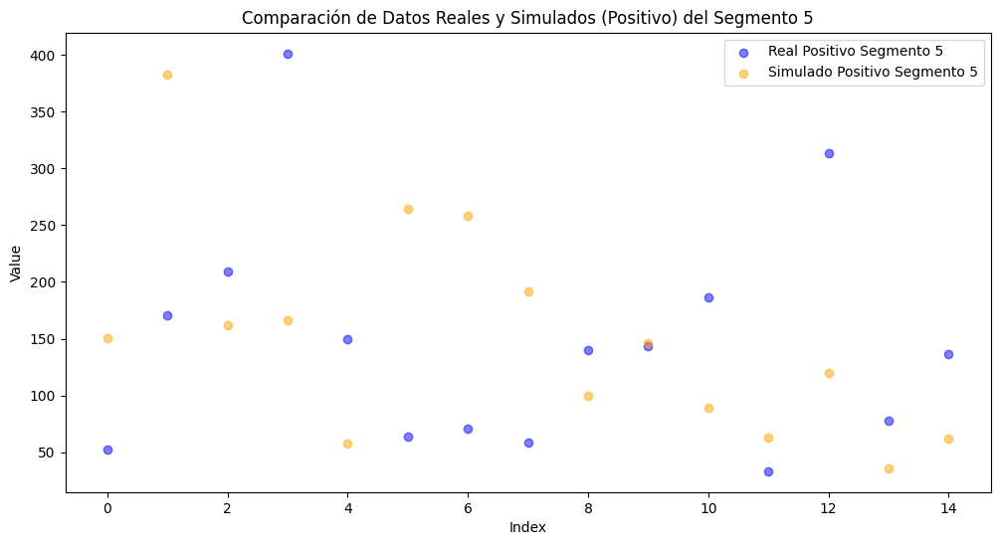

...

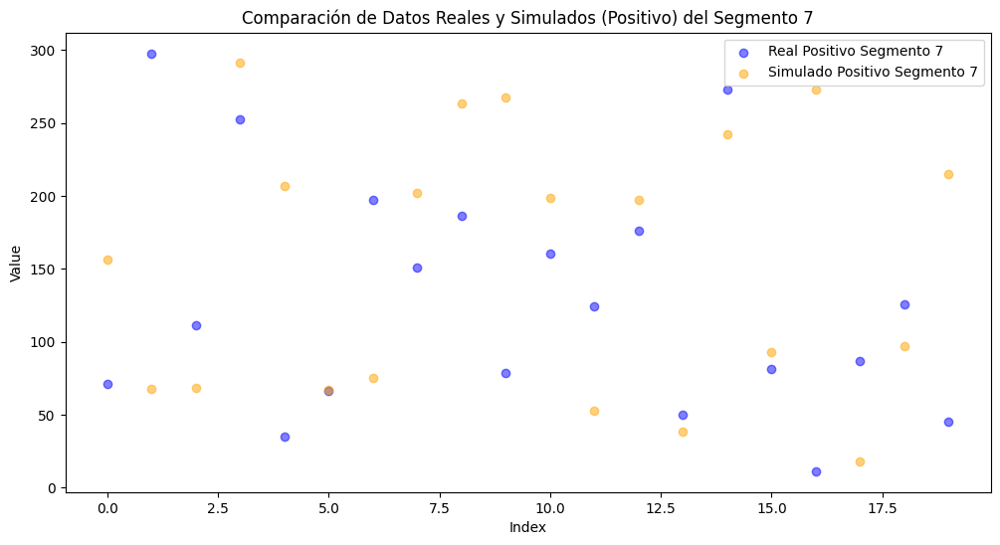

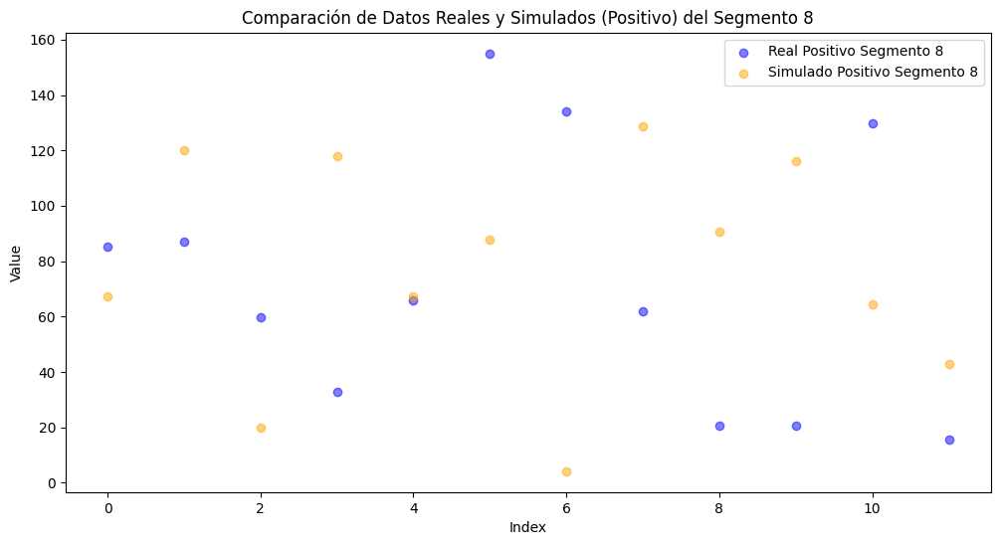

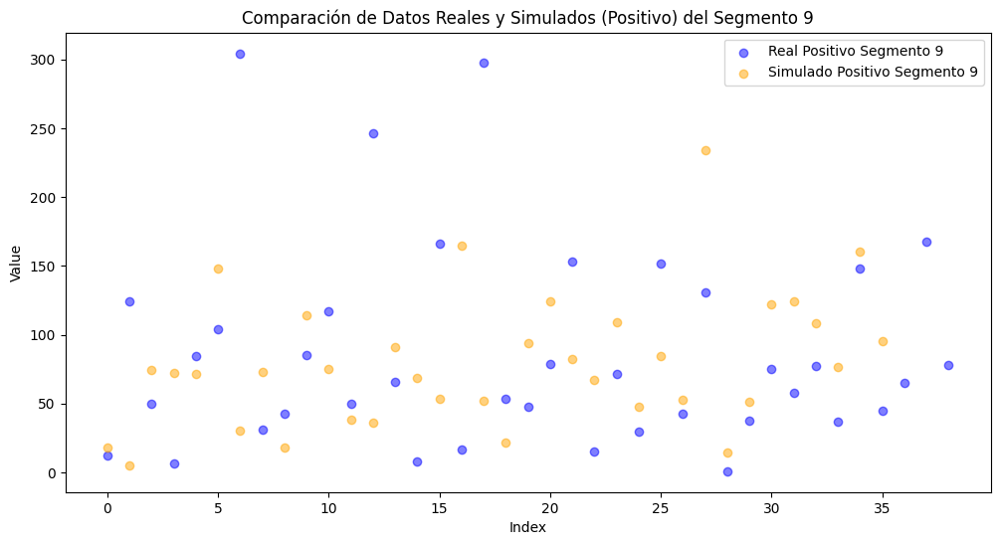

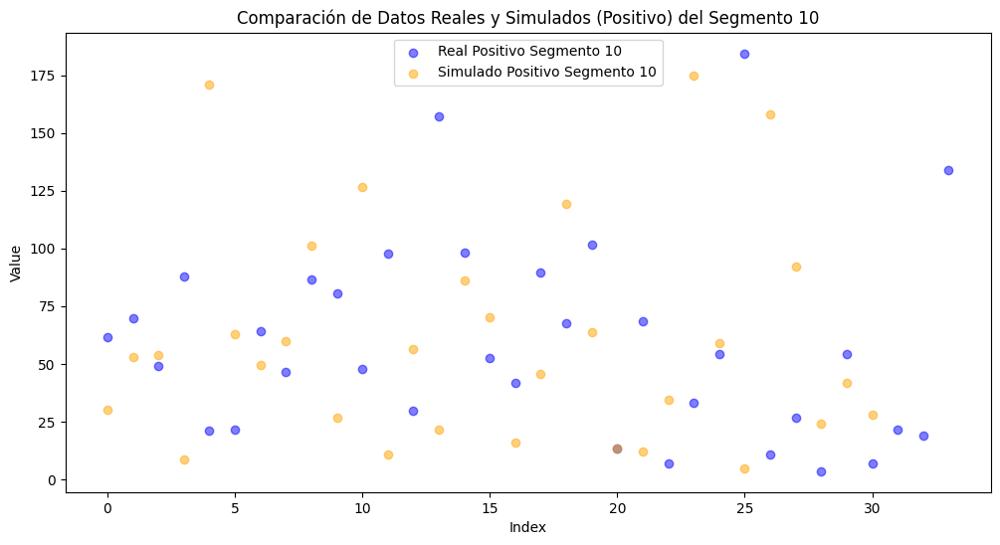

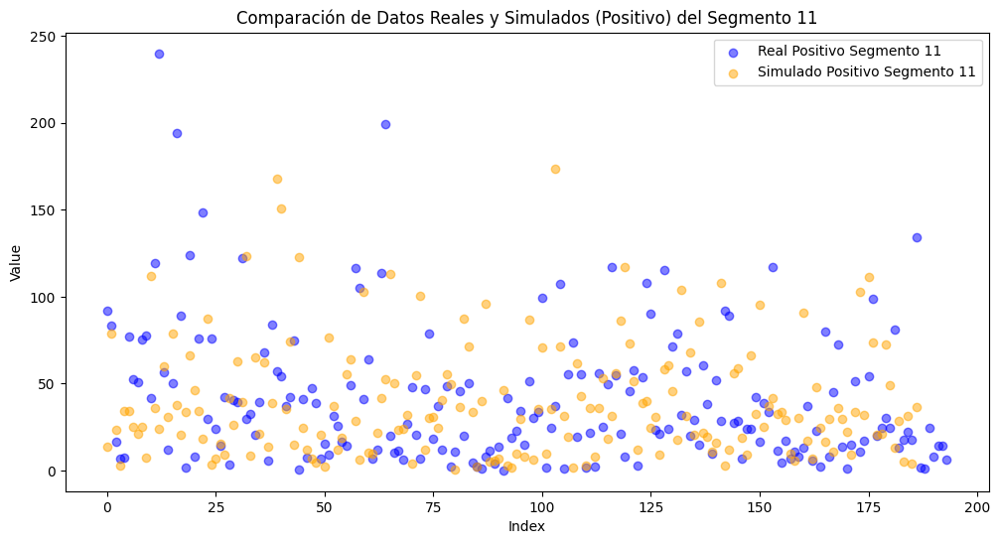

In [15]:
for i, (real_segment_pos, simulated_segment_pos) in enumerate(zip(segments, simulated_data_pos)):
    # Filtrar las tasas positivas
    real_pos = real_segment_pos[real_segment_pos > 0]
    simulated_pos = simulated_segment_pos[simulated_segment_pos > 0]

    plt.figure(figsize=(12, 6))
     
    plt.scatter(range(len(real_pos)), real_pos, alpha=0.5, label=f'Real Positivo Segmento {i+1}', color='blue')
    plt.scatter(range(len(simulated_pos)), simulated_pos, alpha=0.5, label=f'Simulado Positivo Segmento {i+1}', color='orange')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Datos Reales y Simulados (Positivo) del Segmento {i+1}')
    plt.legend()
    plt.show()

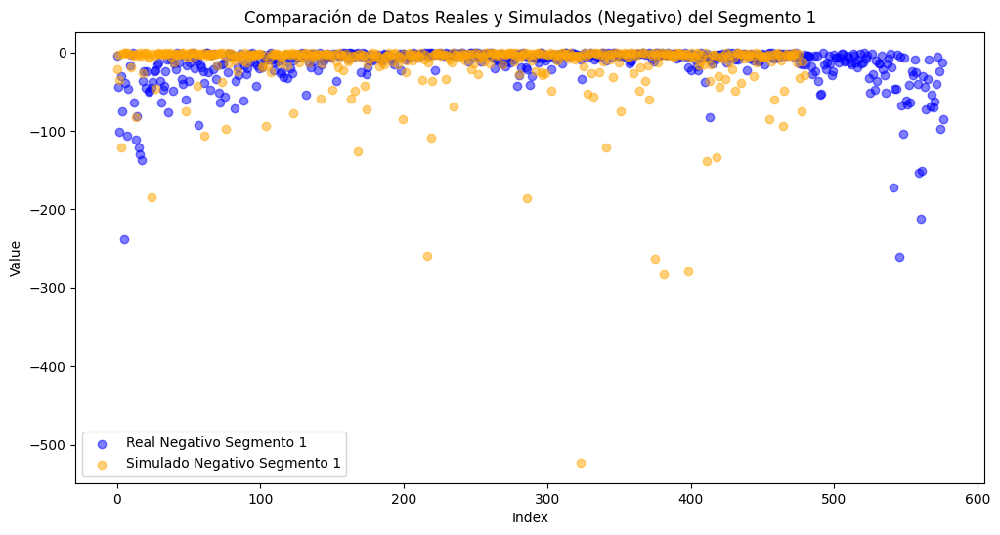

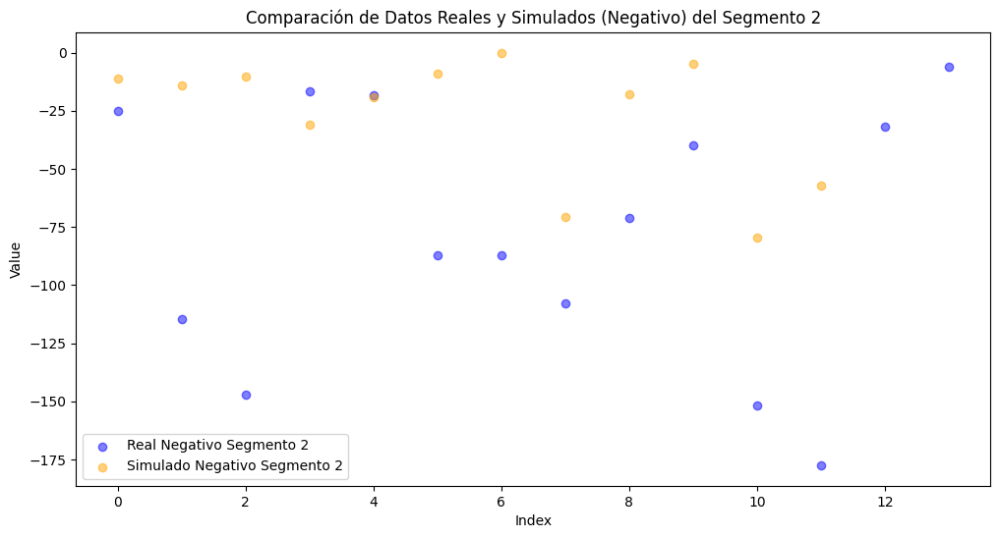

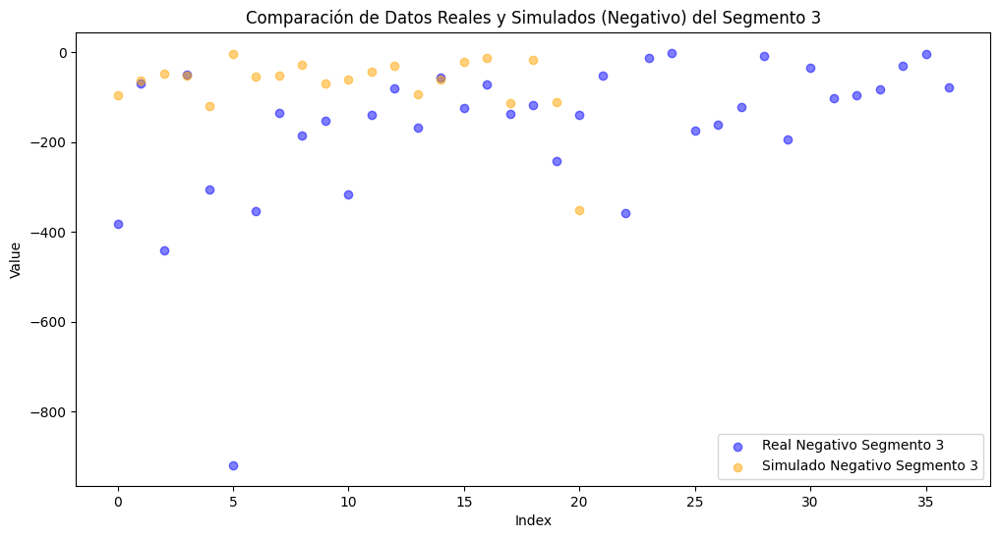

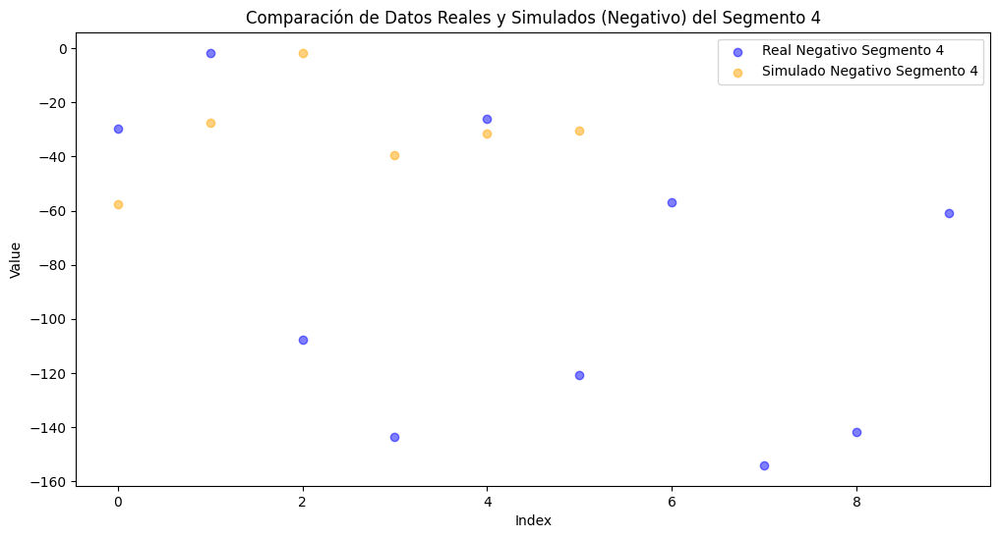

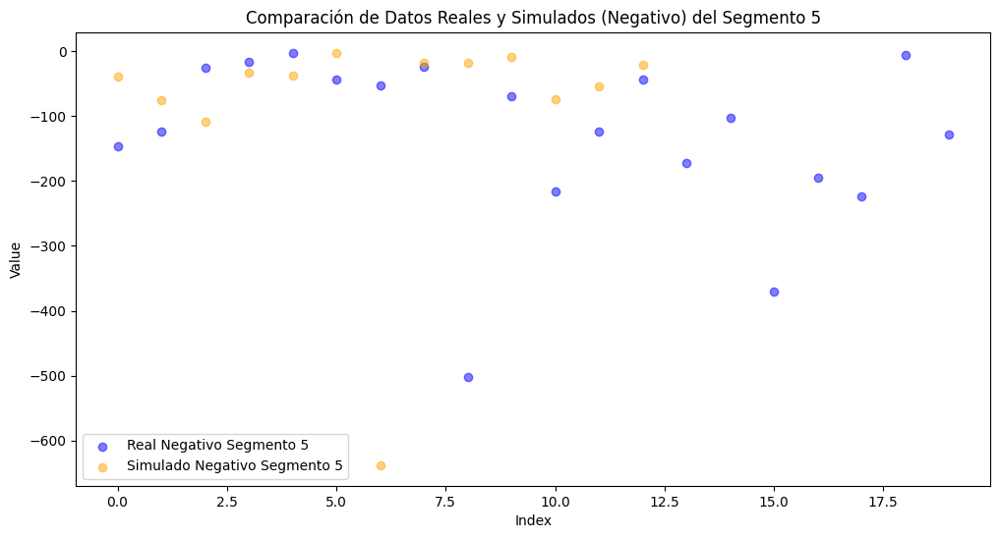

...

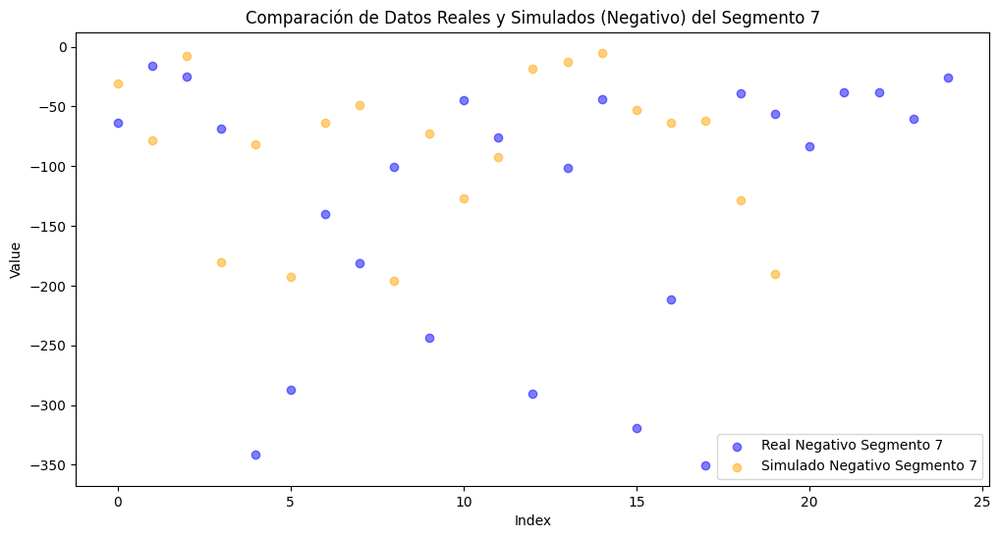

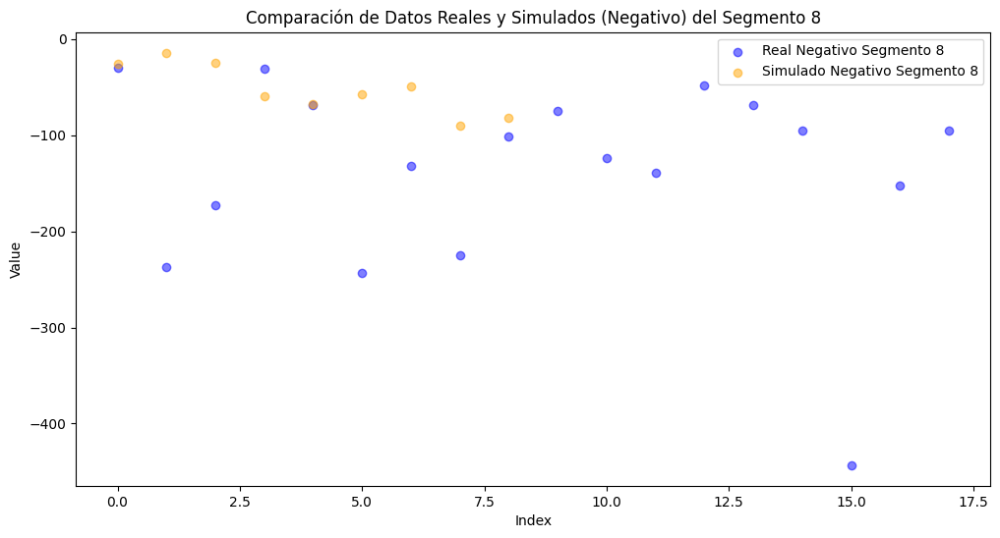

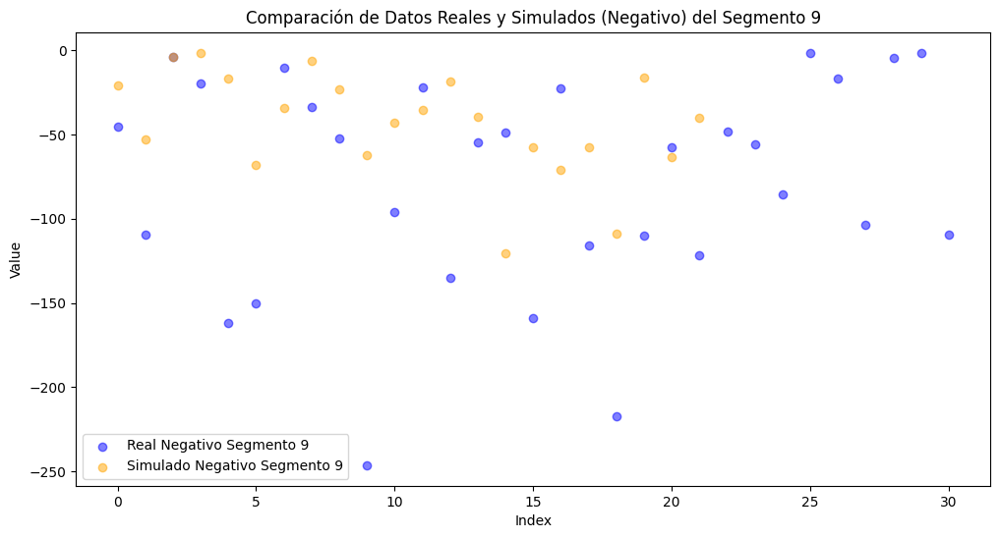

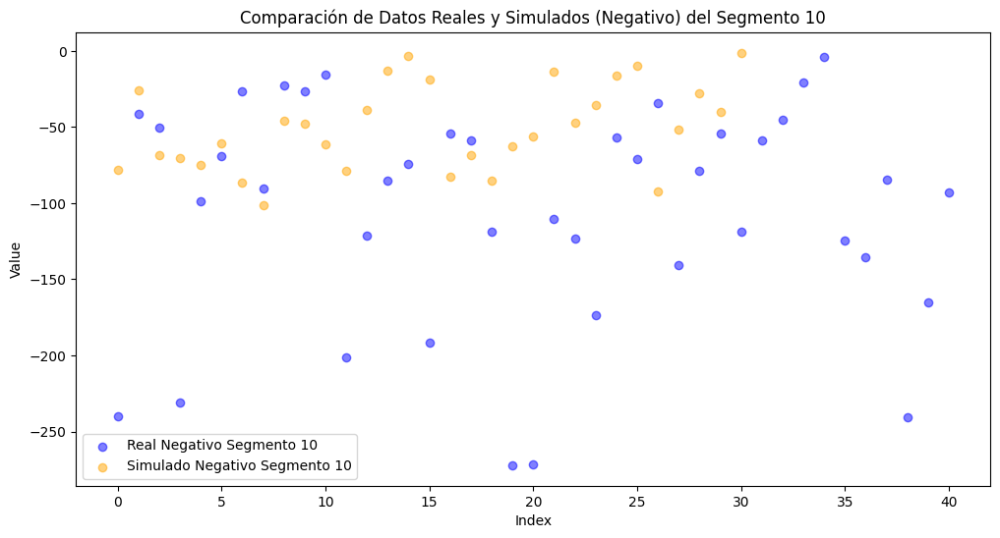

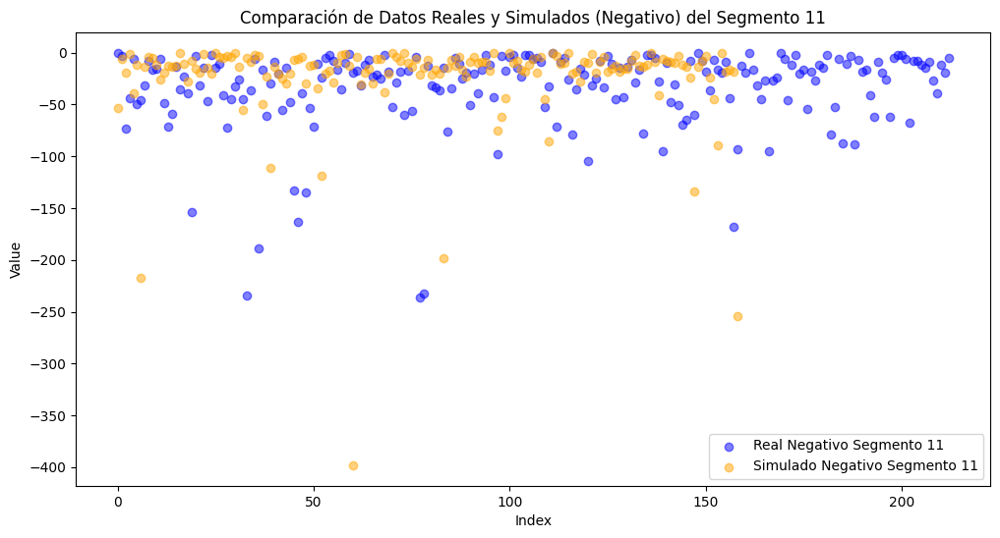

In [16]:
for i, (real_segment_neg, simulated_segment_neg) in enumerate(zip(segments, simulated_data_neg)):
    # Filtrar las tasas negativas
    real_neg = real_segment_neg[real_segment_neg < 0]
    
    simulated_neg = simulated_segment_neg[simulated_segment_neg < 0]

    plt.figure(figsize=(12, 6))
     
    plt.scatter(range(len(real_neg)), real_neg, alpha=0.5, label=f'Real Negativo Segmento {i+1}', color='blue')
    plt.scatter(range(len(simulated_neg)), simulated_neg, alpha=0.5, label=f'Simulado Negativo Segmento {i+1}', color='orange')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Datos Reales y Simulados (Negativo) del Segmento {i+1}')
    plt.legend()
    plt.show()

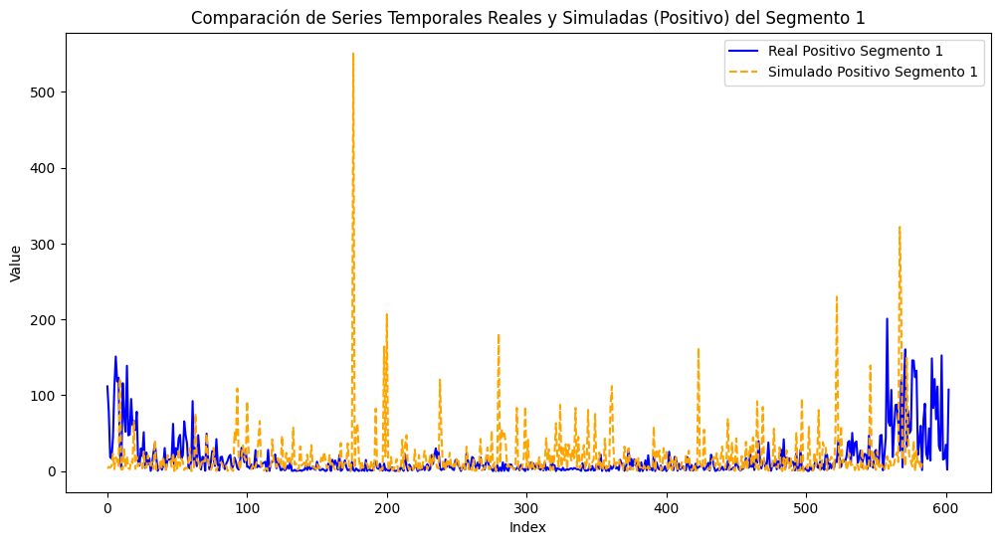

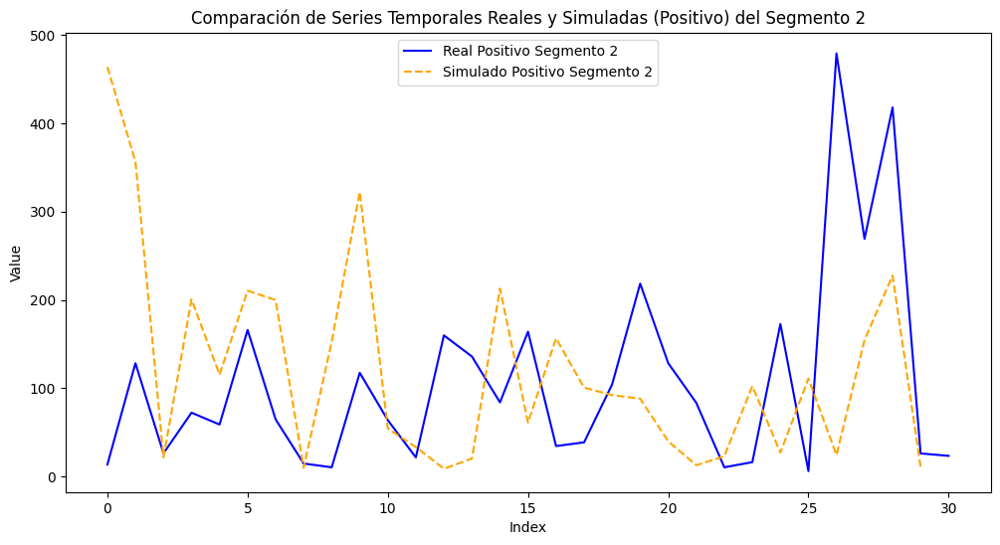

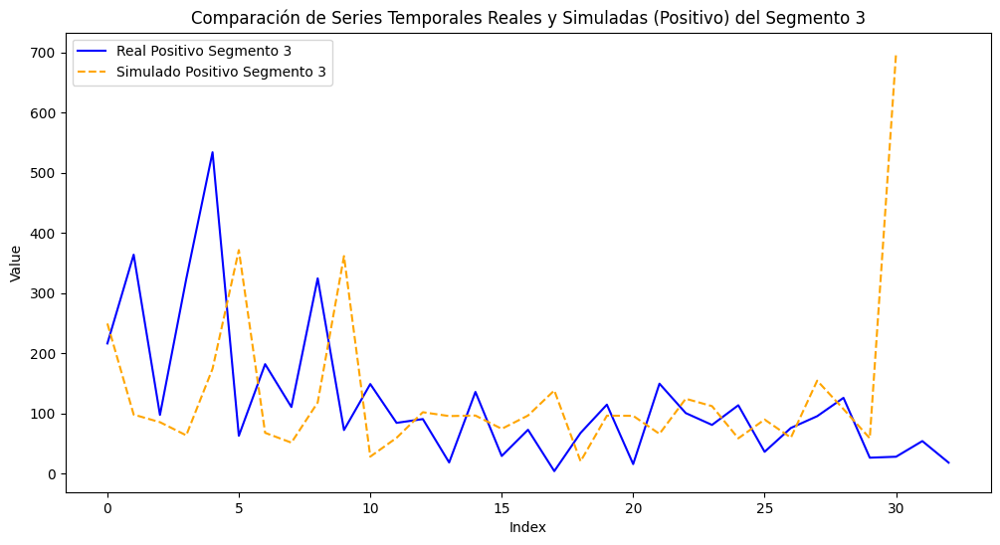

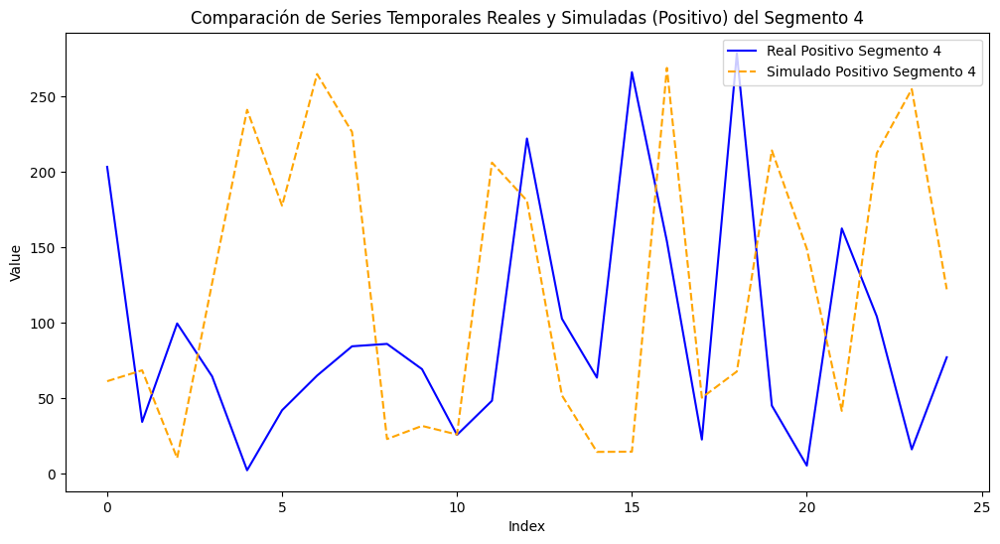

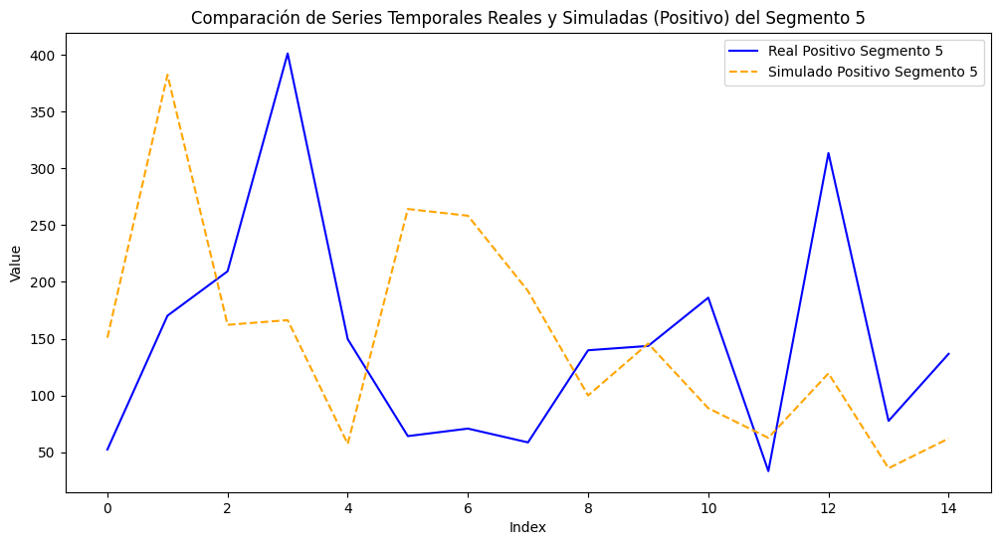

...

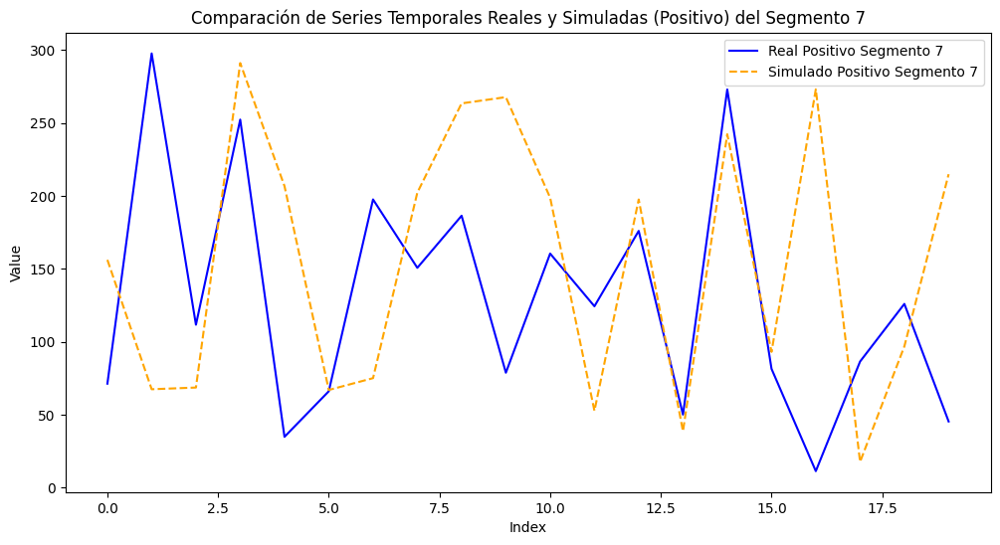

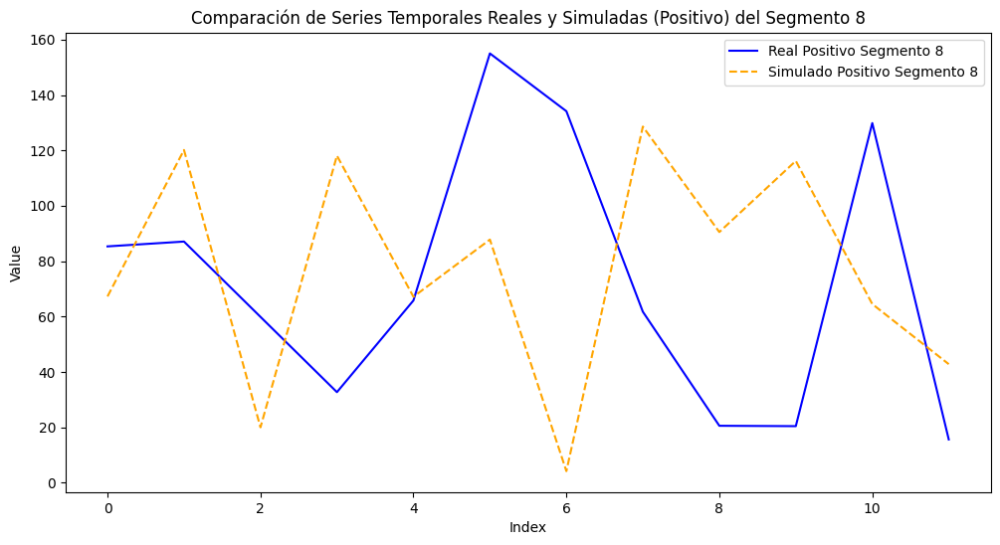

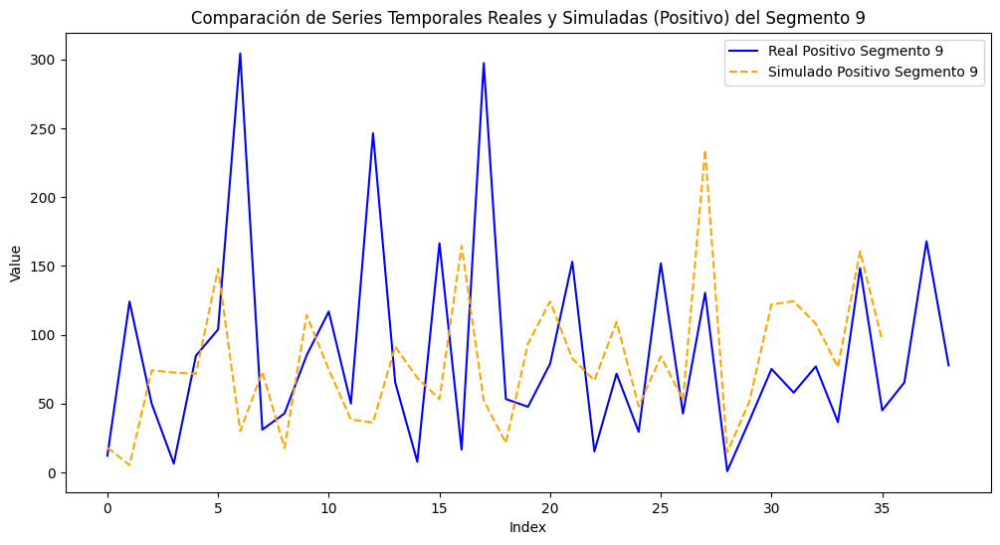

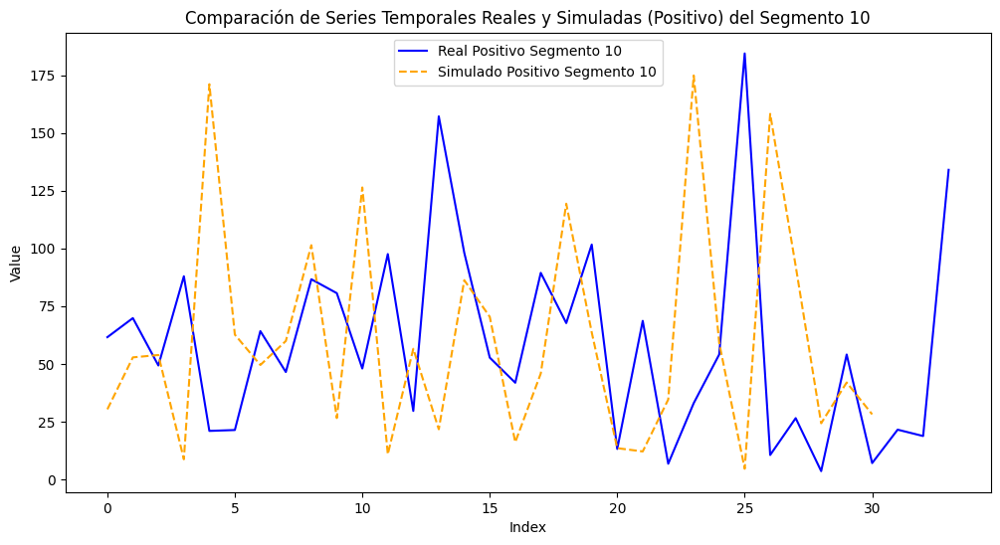

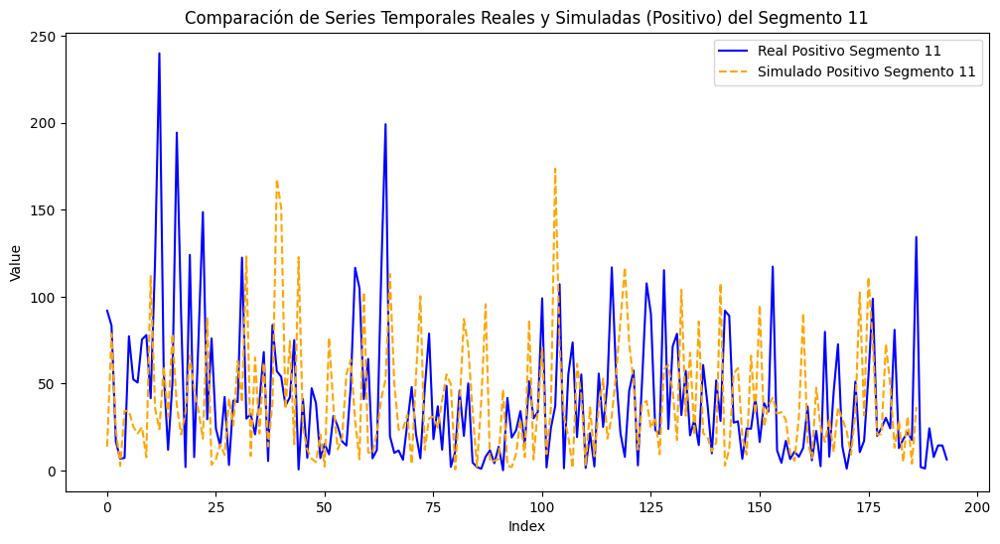

In [17]:
for i, (real_segment, simulated_segment) in enumerate(zip(segments, simulated_data_pos)):
    # Filtrar tasas positivas
    real_pos = real_segment[real_segment >= 0]
    simulated_pos = simulated_segment[simulated_segment >= 0]

    plt.figure(figsize=(12, 6))
    
    plt.plot(range(len(real_pos)), real_pos, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(simulated_pos)), simulated_pos, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas (Positivo) del Segmento {i+1}')
    plt.legend()
    plt.show()

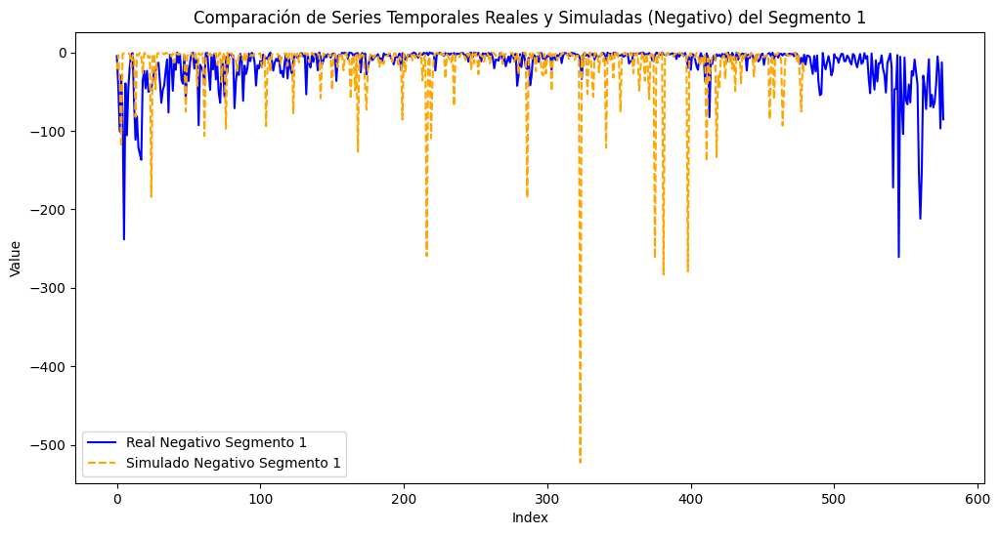

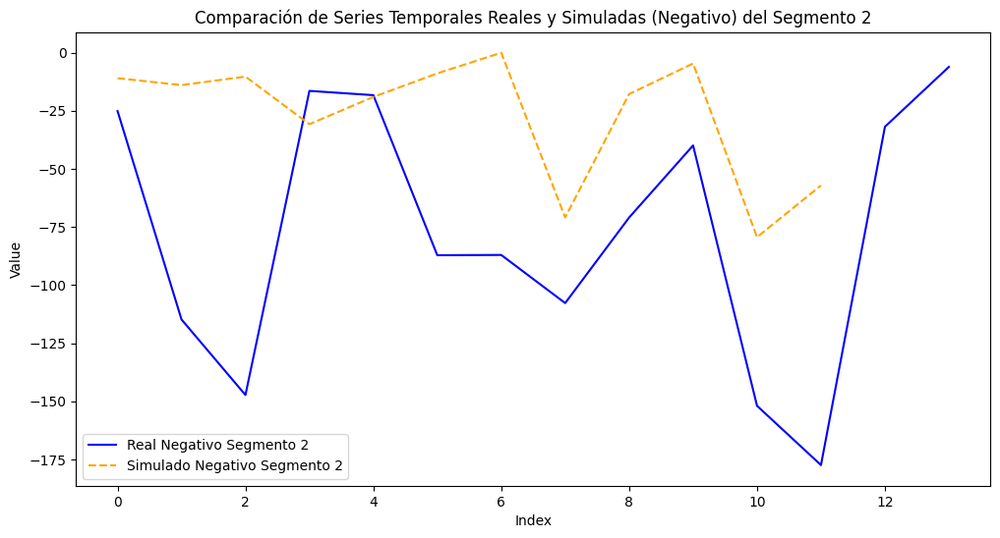

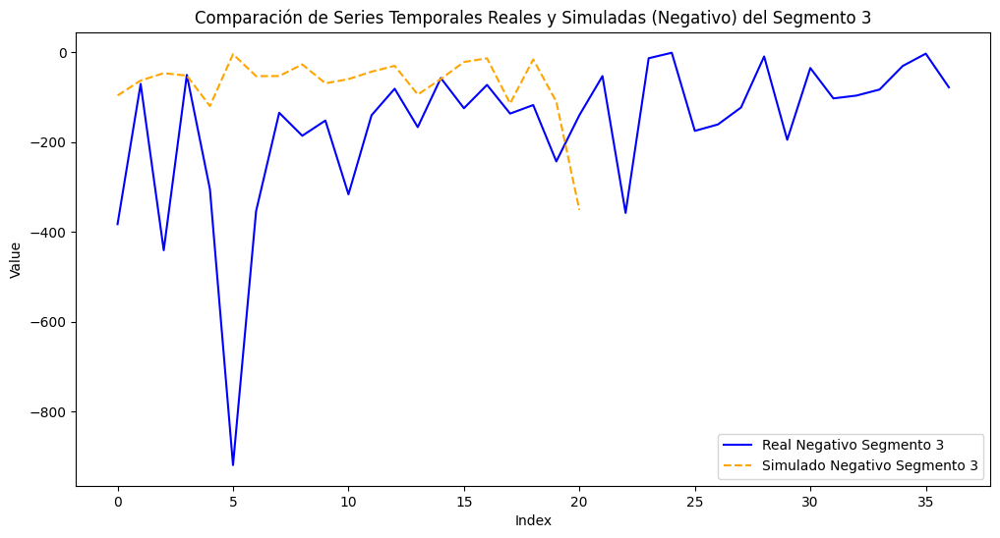

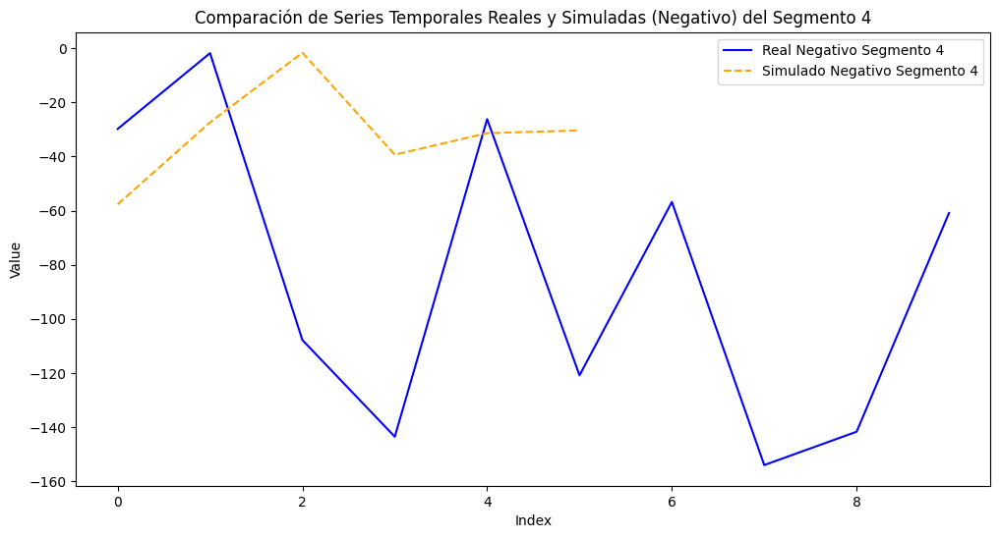

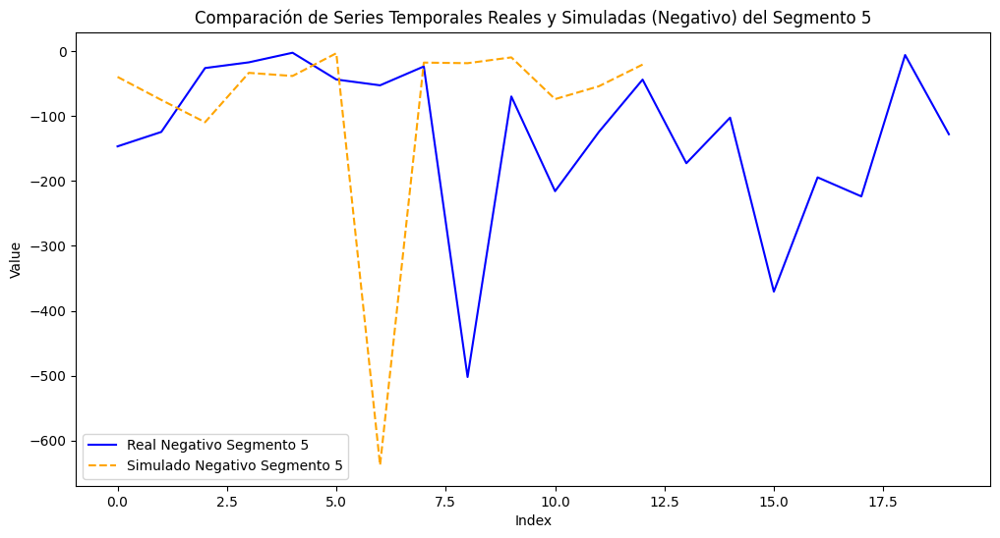

...

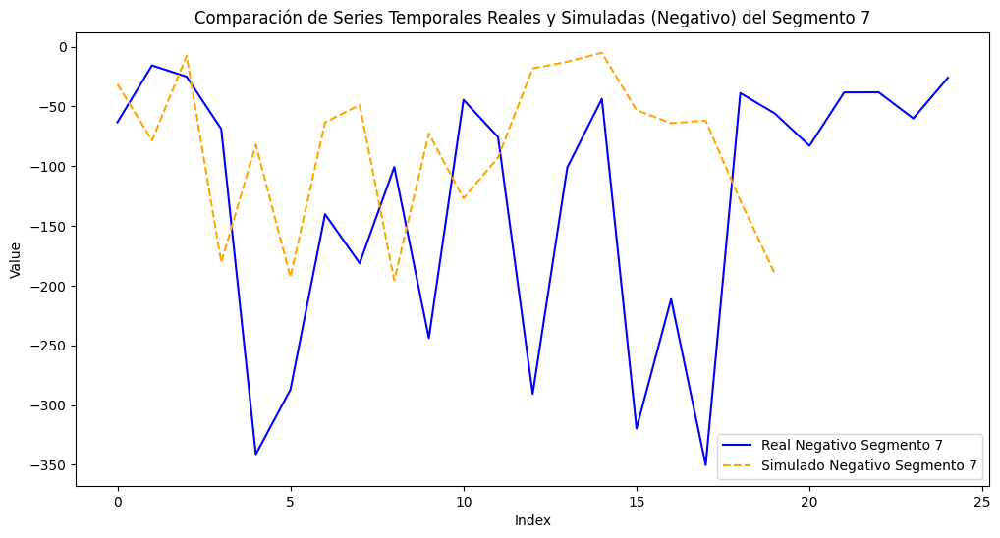

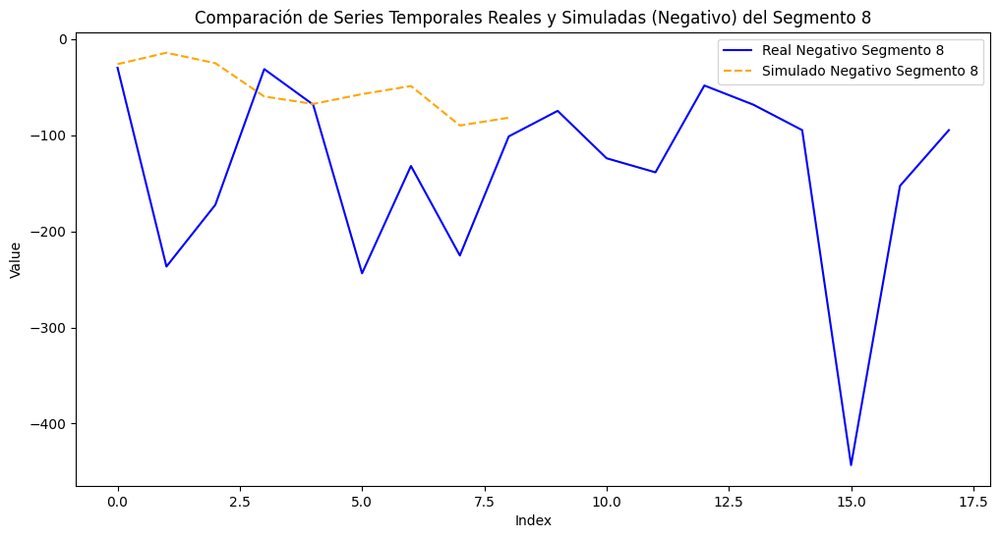

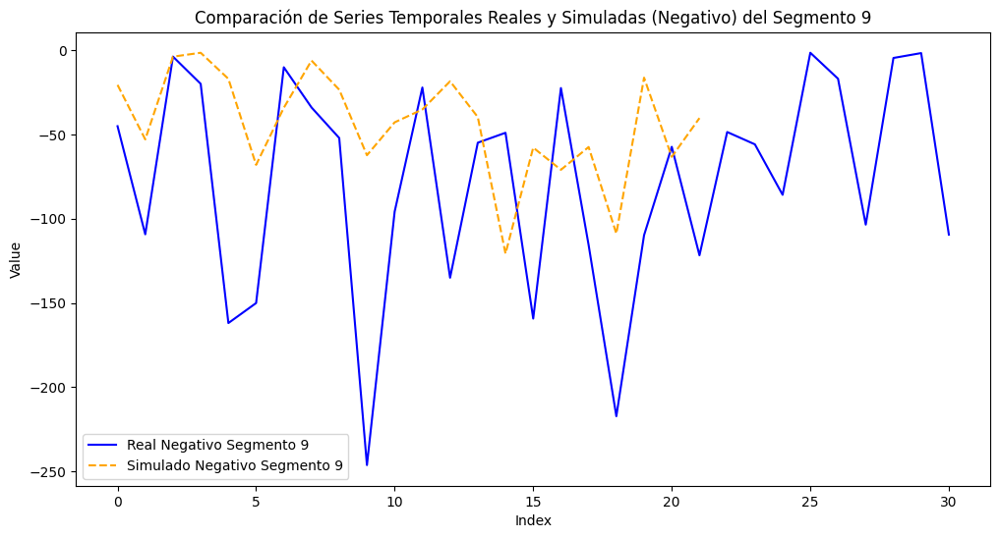

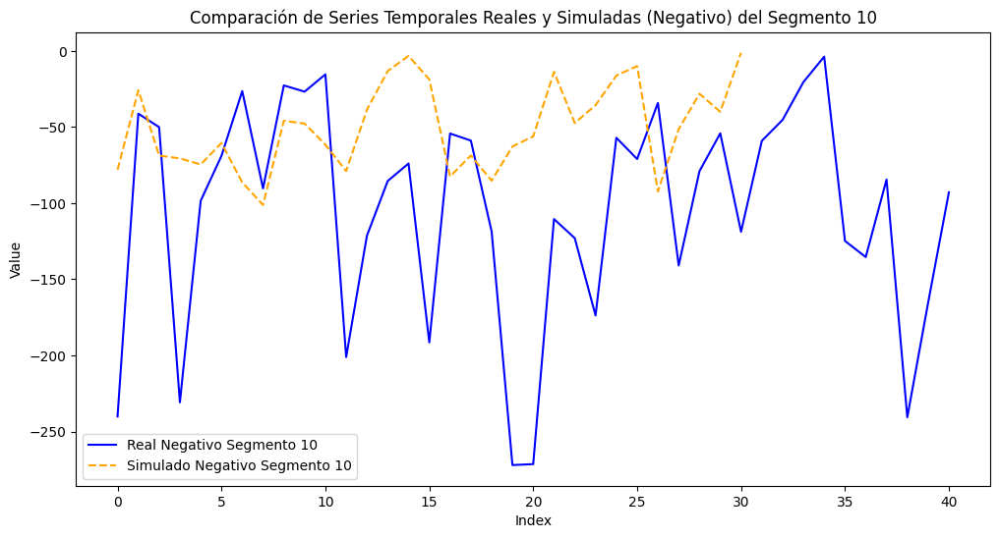

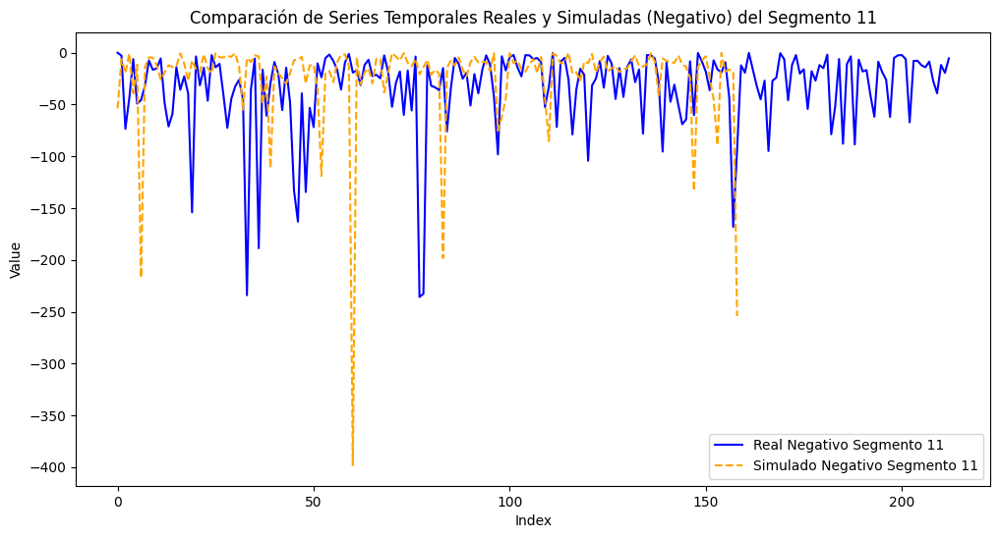

In [18]:
for i, (real_segment, simulated_segment) in enumerate(zip(segments, simulated_data_neg)):
    # Filtrar tasas negativas
    real_neg = real_segment[real_segment < 0]
    #simulated_data_neg = simulated_data_neg
    simulated_neg = simulated_segment[simulated_segment < 0]

    plt.figure(figsize=(12, 6))
    
    plt.plot(range(len(real_neg)), real_neg, label=f'Real Negativo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(simulated_neg)), simulated_neg, label=f'Simulado Negativo Segmento {i+1}', color='orange', linestyle='--')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas (Negativo) del Segmento {i+1}')
    plt.legend()
    plt.show()

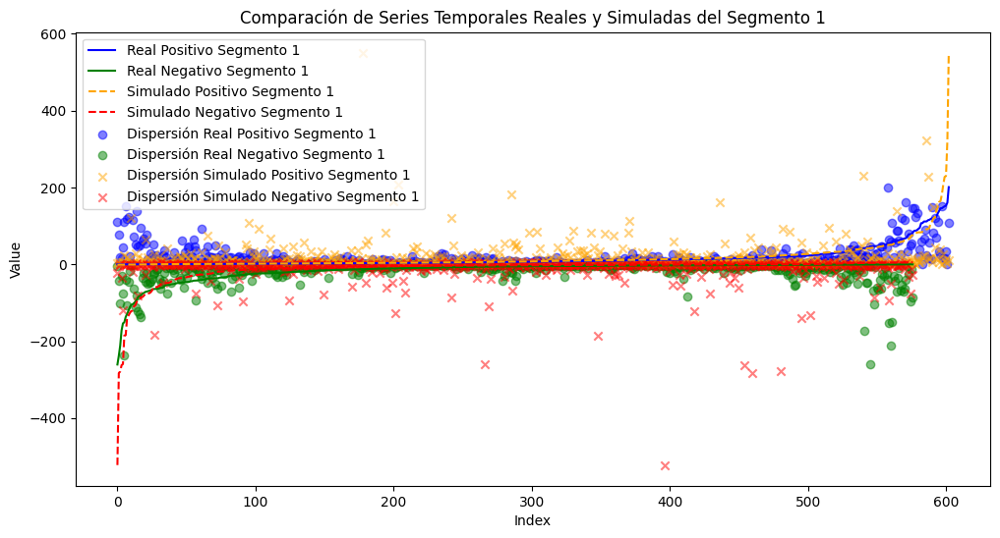

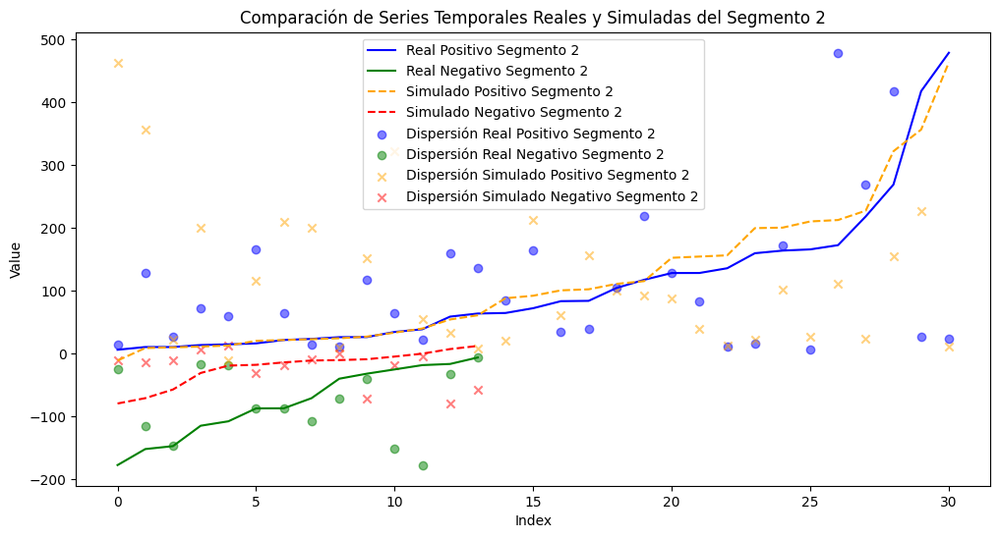

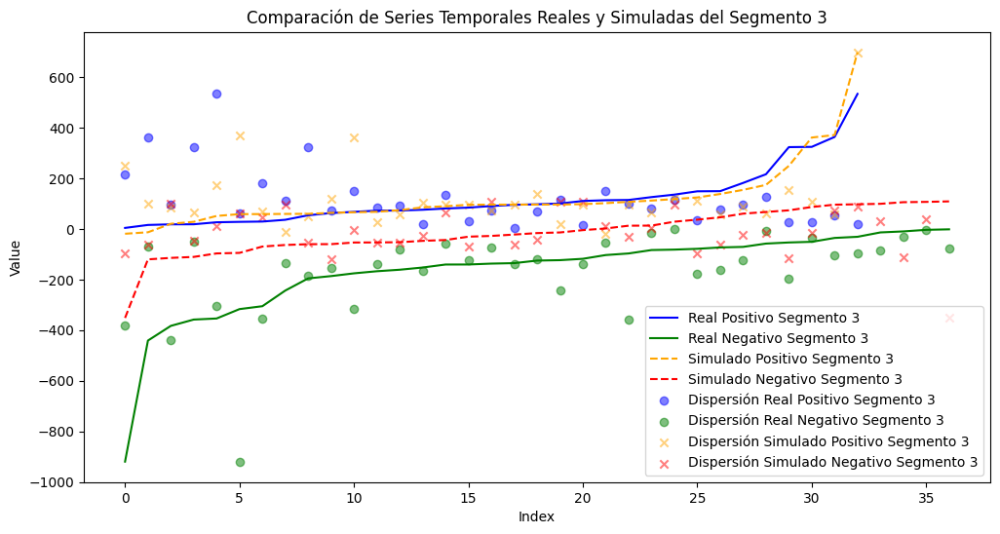

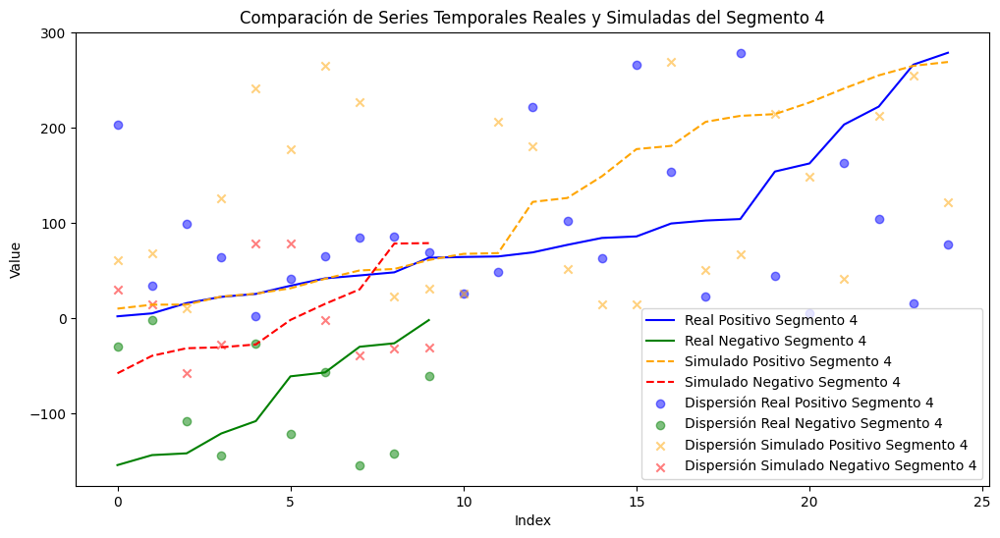

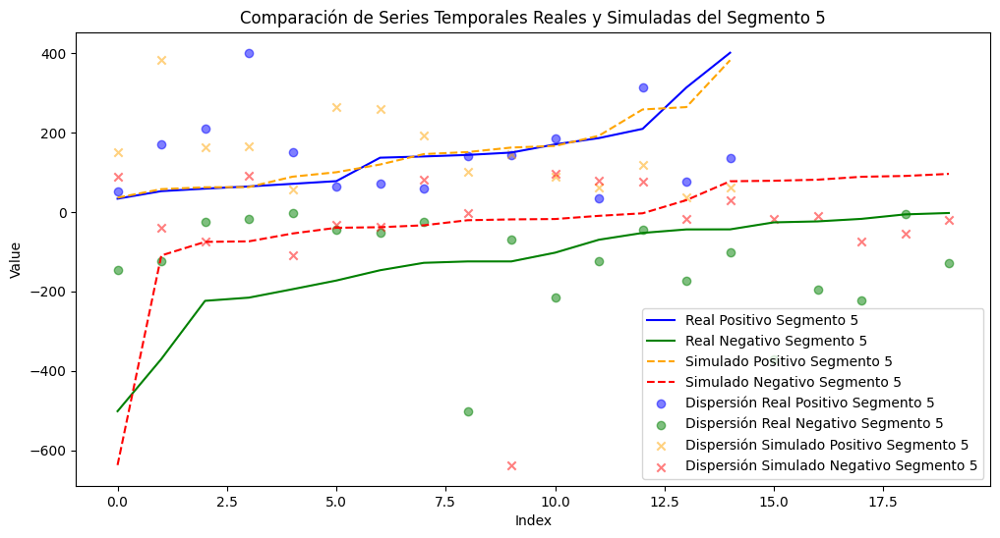

...

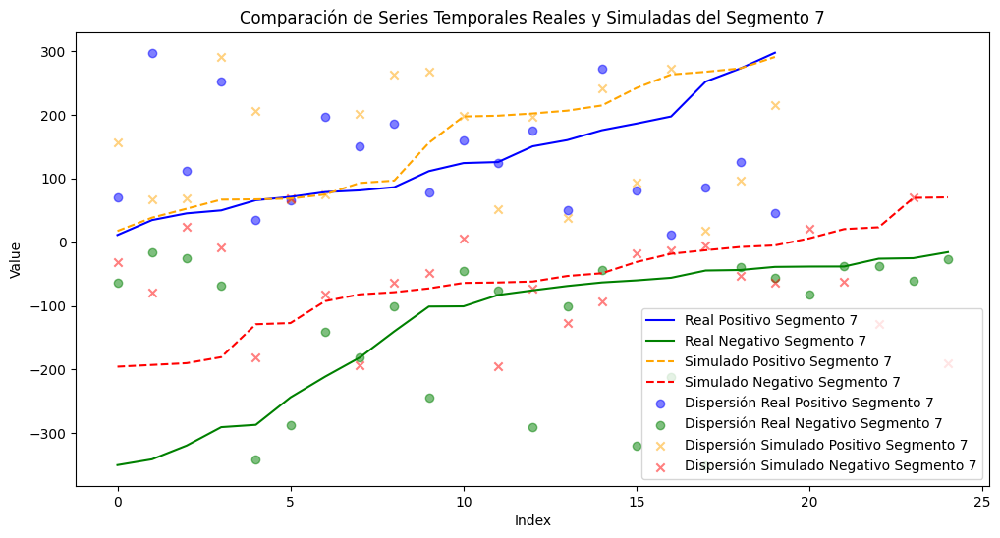

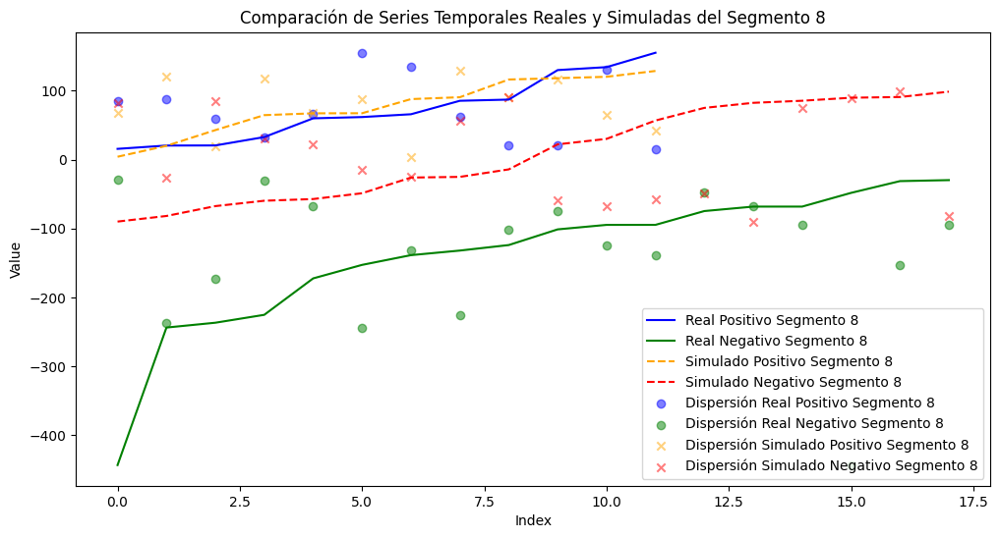

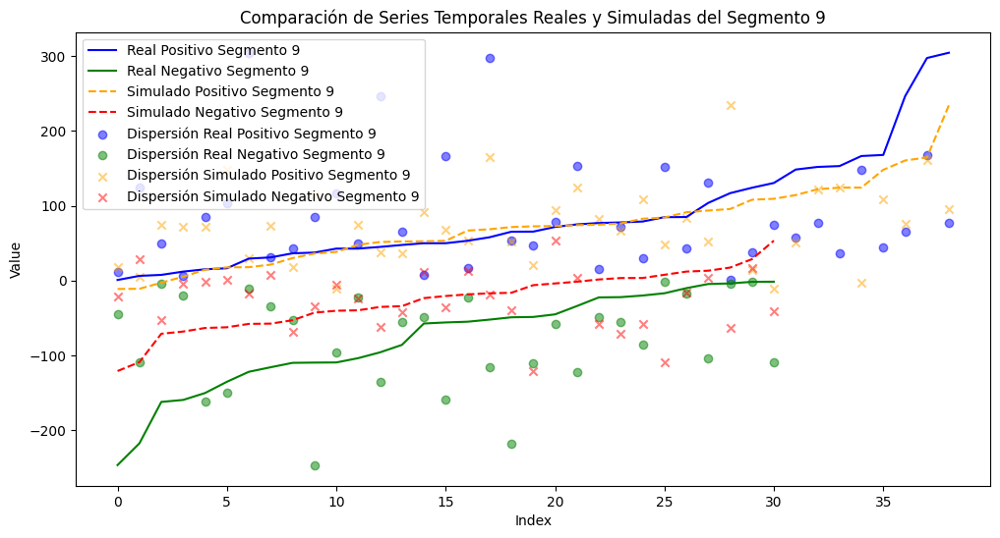

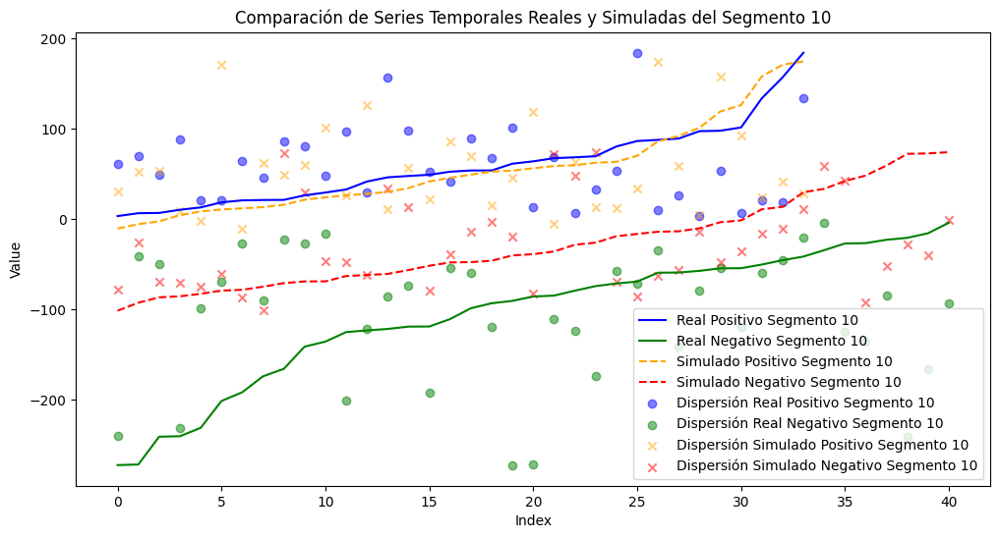

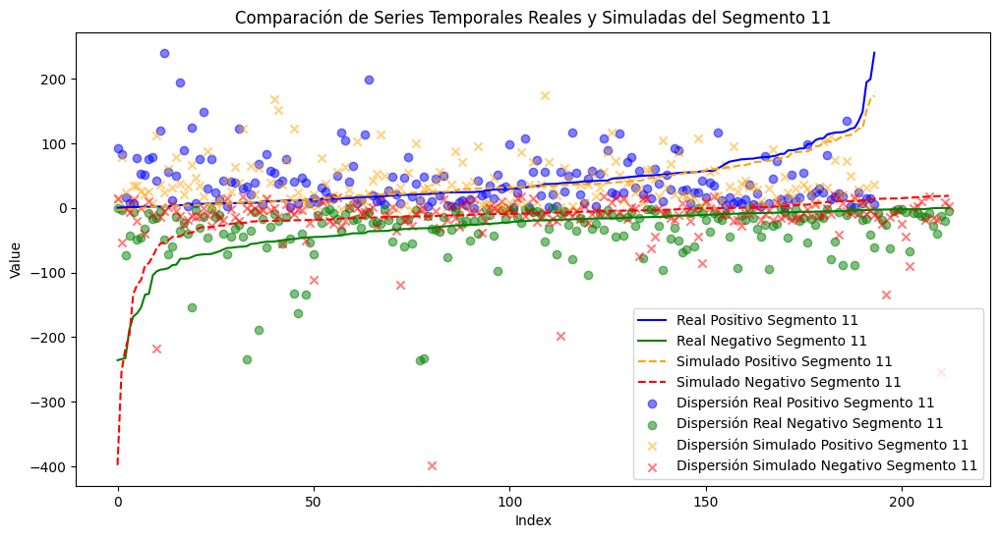

In [19]:
for i, segment in enumerate(segments):
    #####Filtrar tasas positivas y negativas
    real_pos = segment[segment > 0]
    real_neg = segment[segment < 0]
    
    ########Ordenar las tasas positivas y negativas
    real_pos_sorted = np.sort(real_pos)
    real_neg_sorted = np.sort(real_neg)
    
    ###########Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    ##########3Ordenar las simulaciones positivas y negativas
    simulated_pos_sorted = np.sort(simulated_pos)
    simulated_neg_sorted = np.sort(simulated_neg)

    plt.figure(figsize=(12, 6))

    ####Graficar los datos reales y simulados
    plt.plot(range(len(real_pos_sorted)), real_pos_sorted, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg_sorted)), real_neg_sorted, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    plt.plot(range(len(simulated_pos_sorted)), simulated_pos_sorted, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg_sorted)), simulated_neg_sorted, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')
    
    # Dispersión de los datos reales
    plt.scatter(range(len(real_pos)), real_pos, color='blue', alpha=0.5, marker='o', label=f'Dispersión Real Positivo Segmento {i+1}')
    plt.scatter(range(len(real_neg)), real_neg, color='green', alpha=0.5, marker='o', label=f'Dispersión Real Negativo Segmento {i+1}')
    
    #########3Dispersión de los datos simulados
    plt.scatter(range(len(simulated_pos)), simulated_pos, color='orange', alpha=0.5, marker='x', label=f'Dispersión Simulado Positivo Segmento {i+1}')
    plt.scatter(range(len(simulated_neg)), simulated_neg, color='red', alpha=0.5, marker='x', label=f'Dispersión Simulado Negativo Segmento {i+1}')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas del Segmento {i+1}')
    plt.legend()
    plt.show()

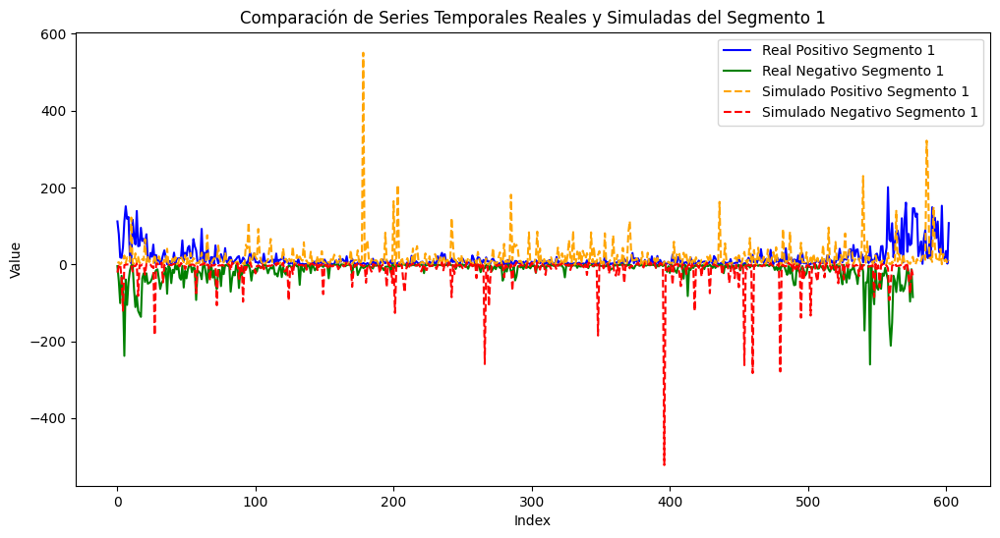

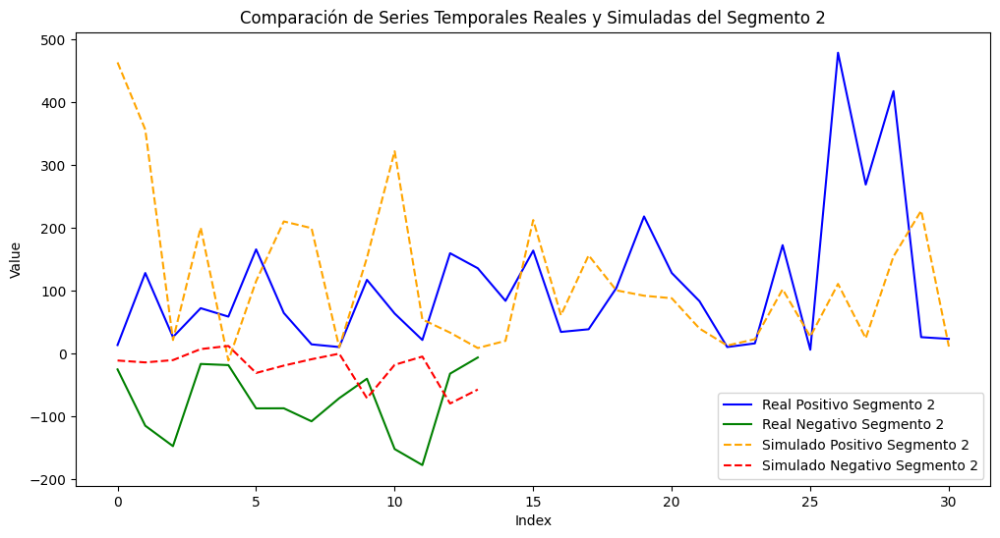

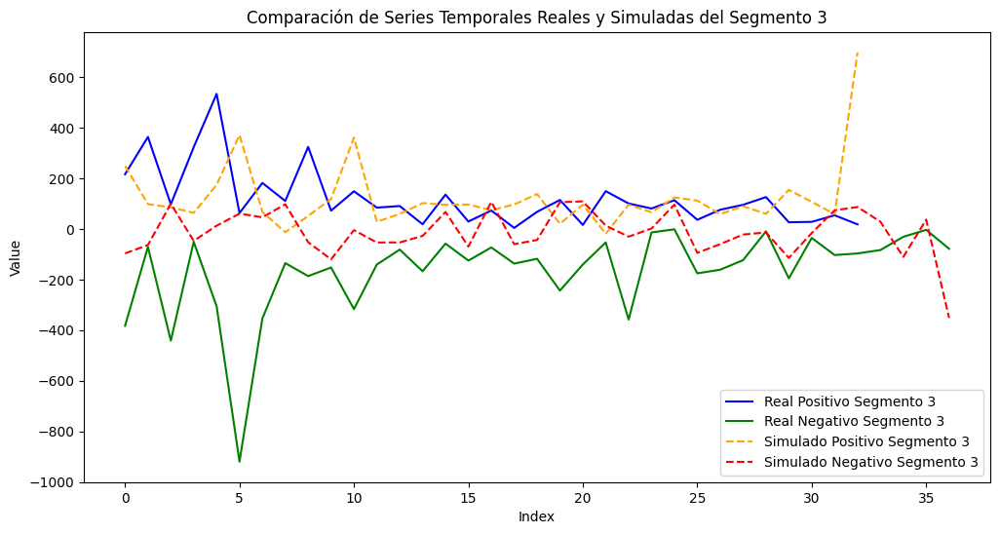

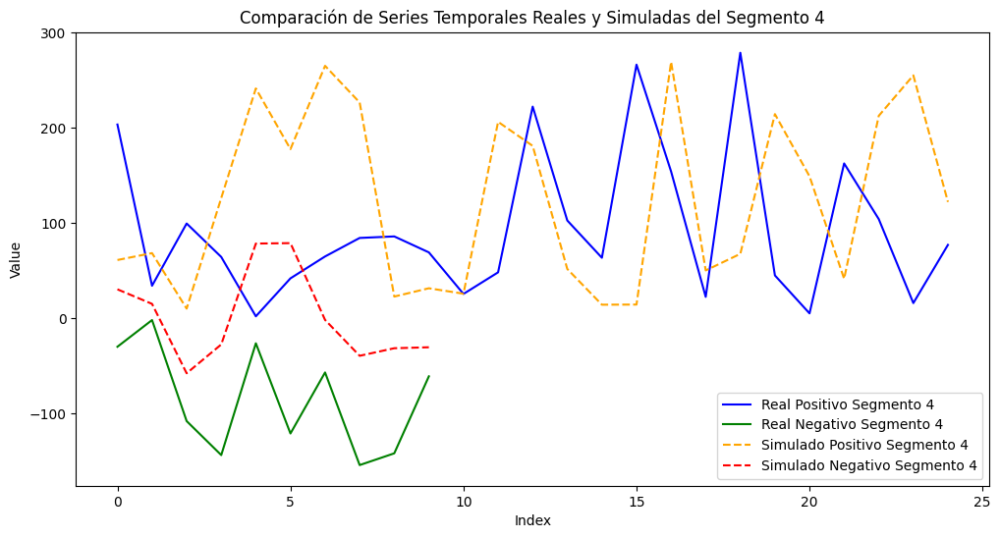

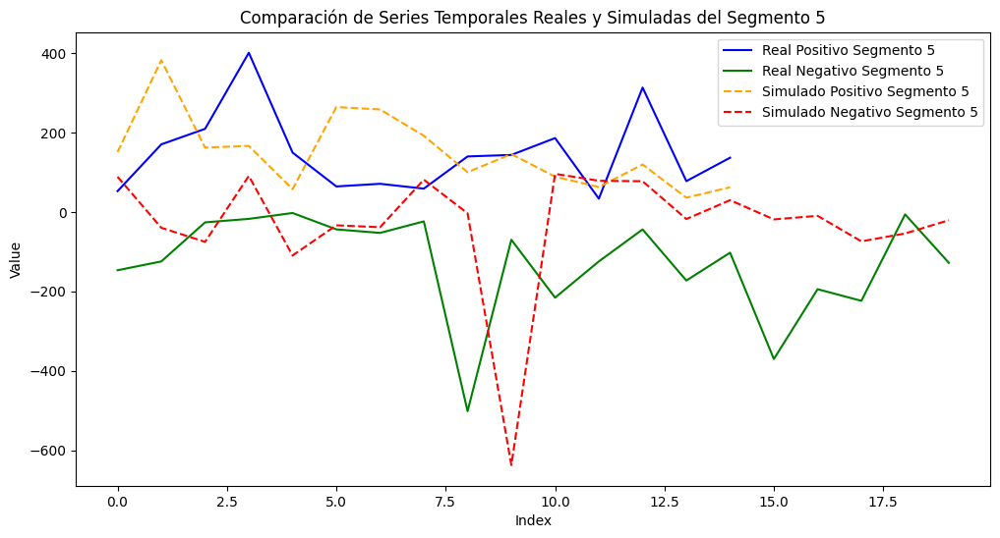

...

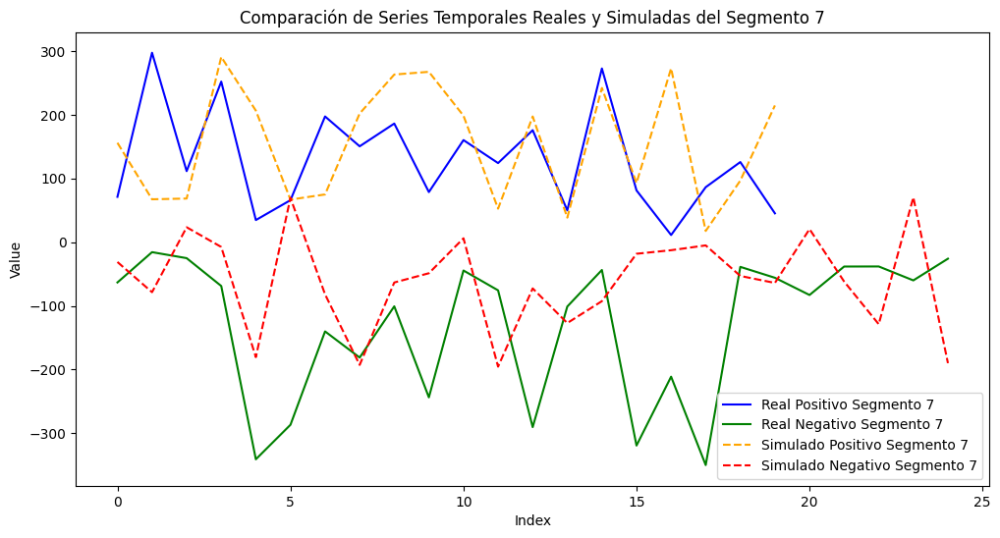

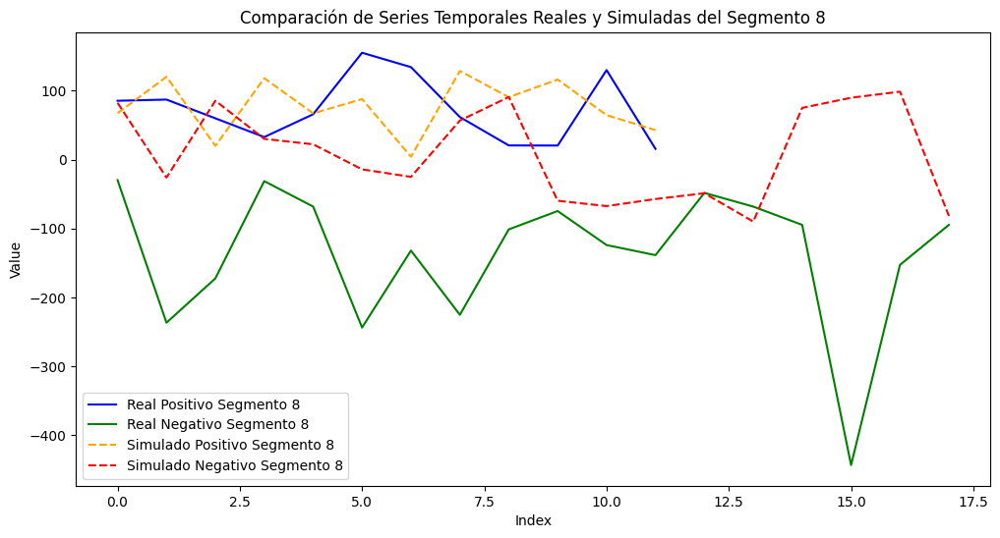

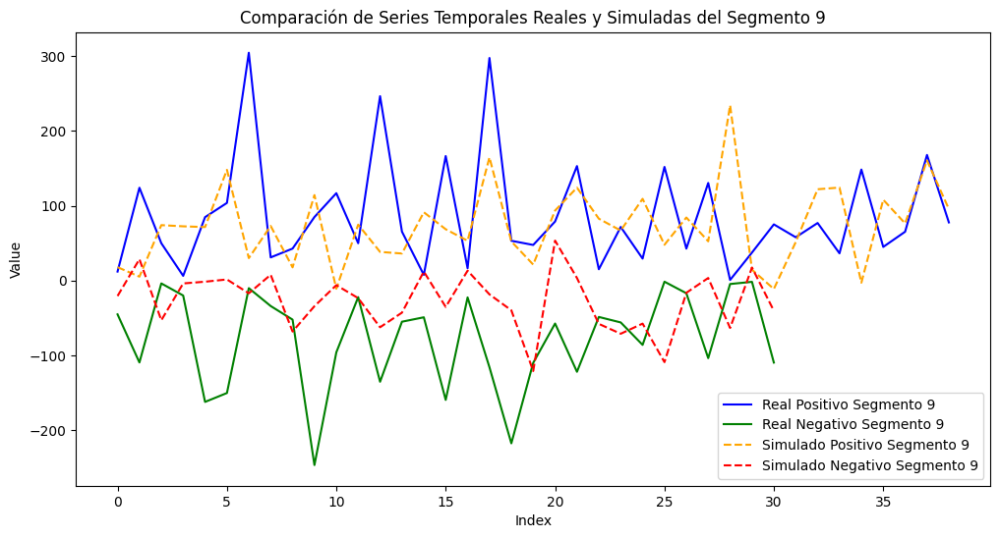

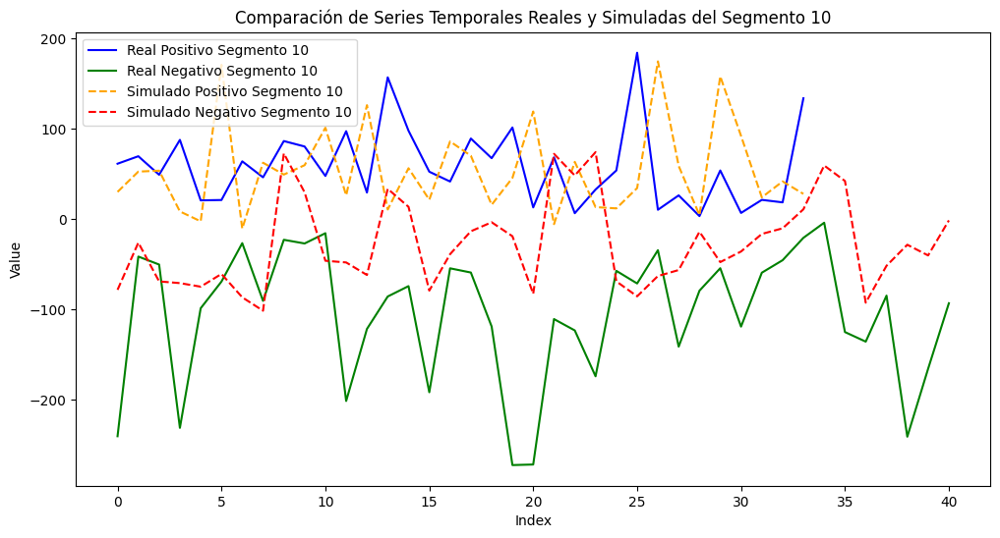

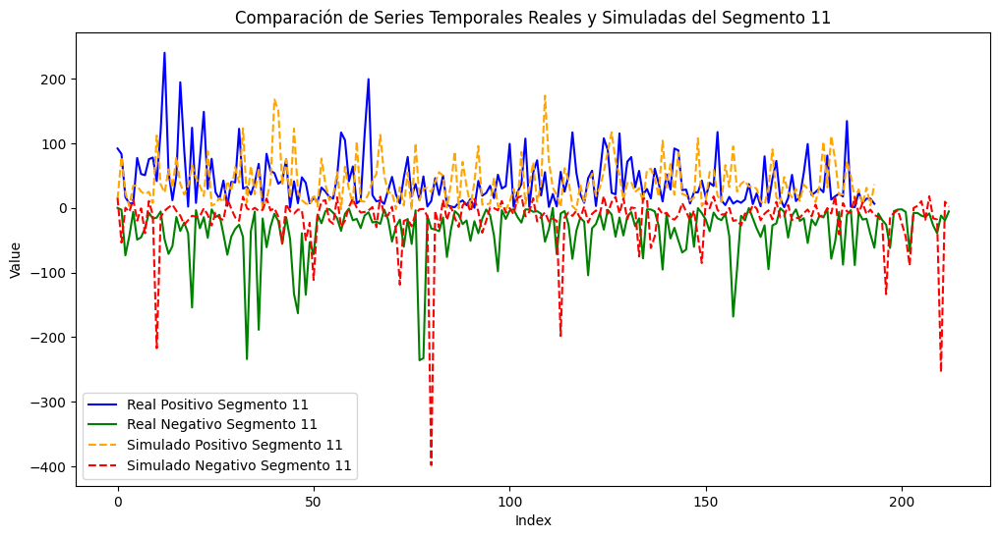

In [20]:
for i, segment in enumerate(segments):
    # Filtrar tasas positivas y negativas
    real_pos = segment[segment > 0]
    real_neg = segment[segment < 0]
    
    # Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    # Interpolación para hacer coincidir las longitudes
    if len(simulated_pos) < len(real_pos):
        simulated_pos = np.interp(np.linspace(0, len(simulated_pos), len(real_pos)), np.arange(len(simulated_pos)), simulated_pos)
    if len(simulated_neg) < len(real_neg):
        simulated_neg = np.interp(np.linspace(0, len(simulated_neg), len(real_neg)), np.arange(len(simulated_neg)), simulated_neg)

    plt.figure(figsize=(12, 6))

    # Graficar las series de tiempo reales
    plt.plot(range(len(real_pos)), real_pos, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg)), real_neg, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    
    # Graficar las series de tiempo simuladas
    plt.plot(range(len(simulated_pos)), simulated_pos, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg)), simulated_neg, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas del Segmento {i+1}')
    plt.legend()
    plt.show()

In [21]:
def pad_series_with_mean(data, target_length):
    padding_length = target_length - len(data)
    if padding_length > 0:
        mean_value = np.mean(data) if len(data) > 0 else 0
        padding = np.full(padding_length, mean_value)
        padded_data = np.concatenate([data, padding])
    else:
        padded_data = data
    return padded_data

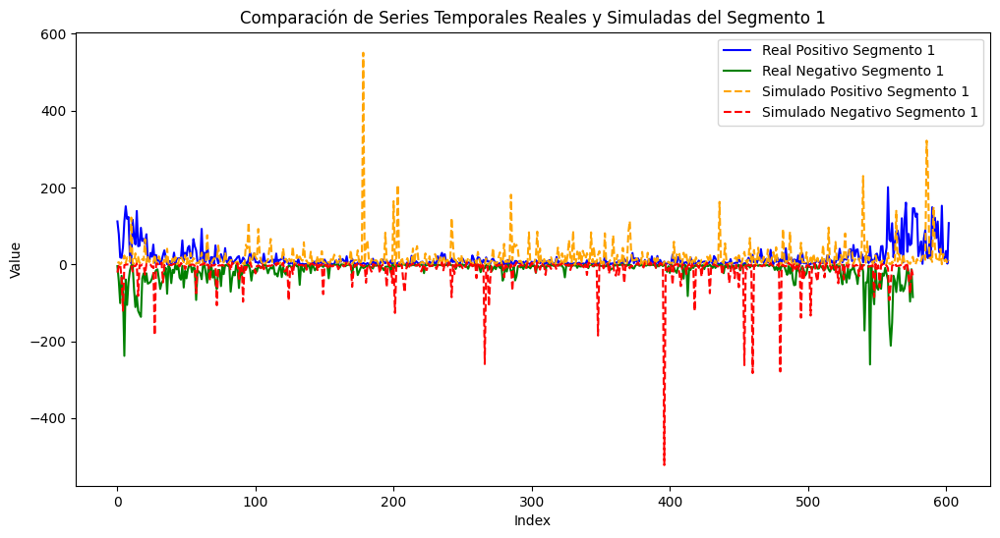

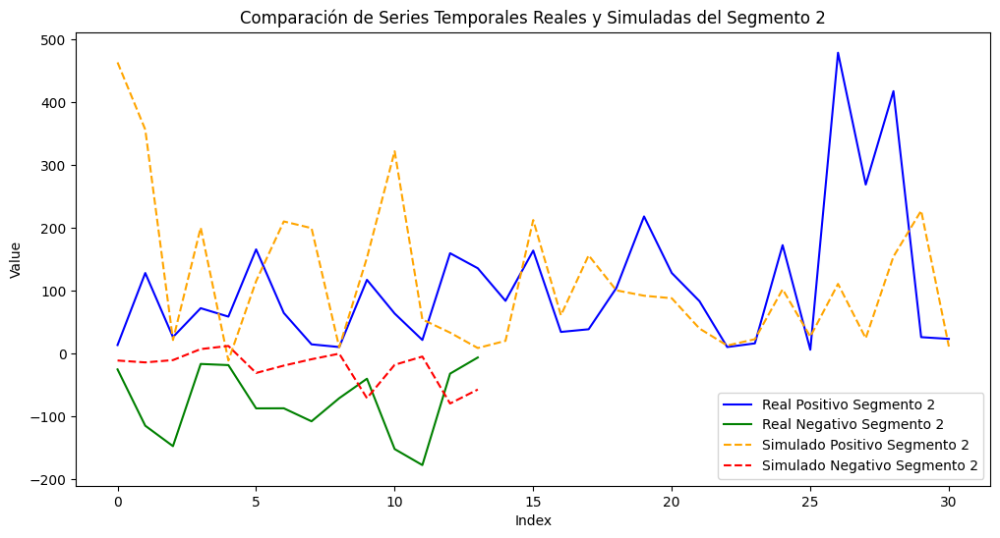

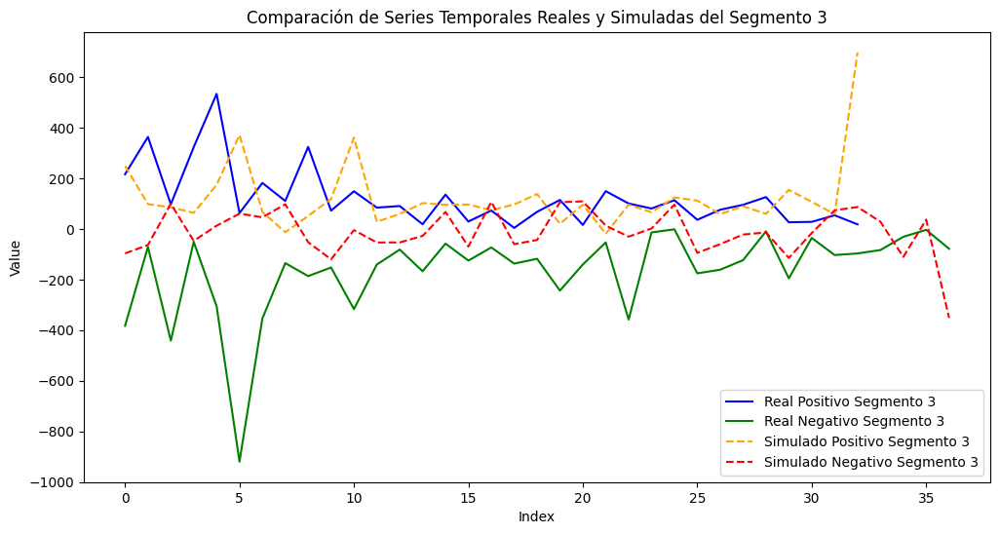

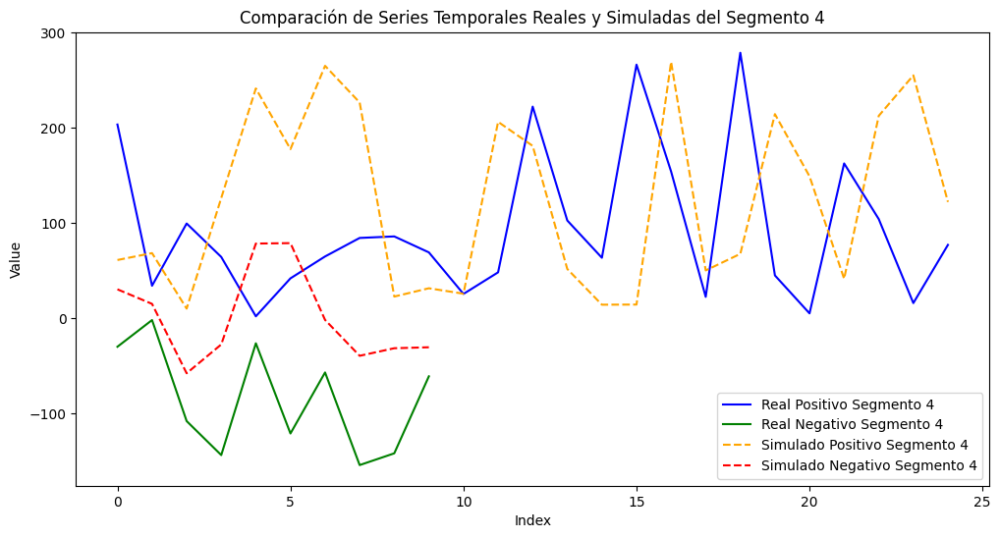

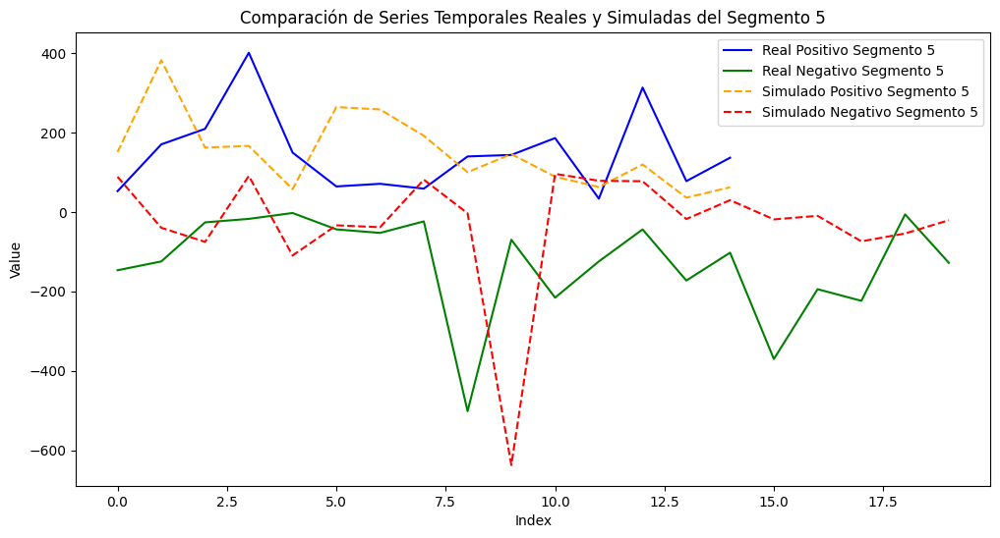

...

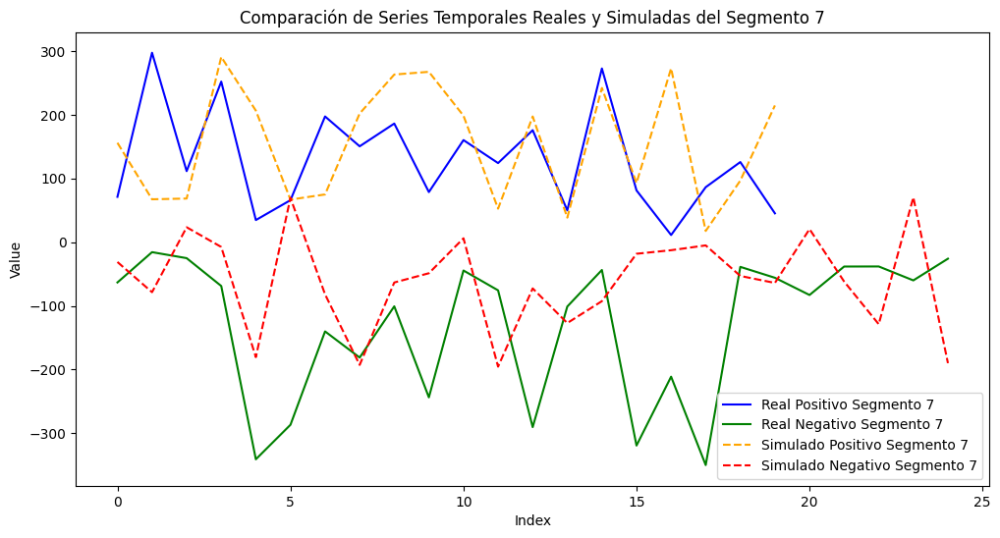

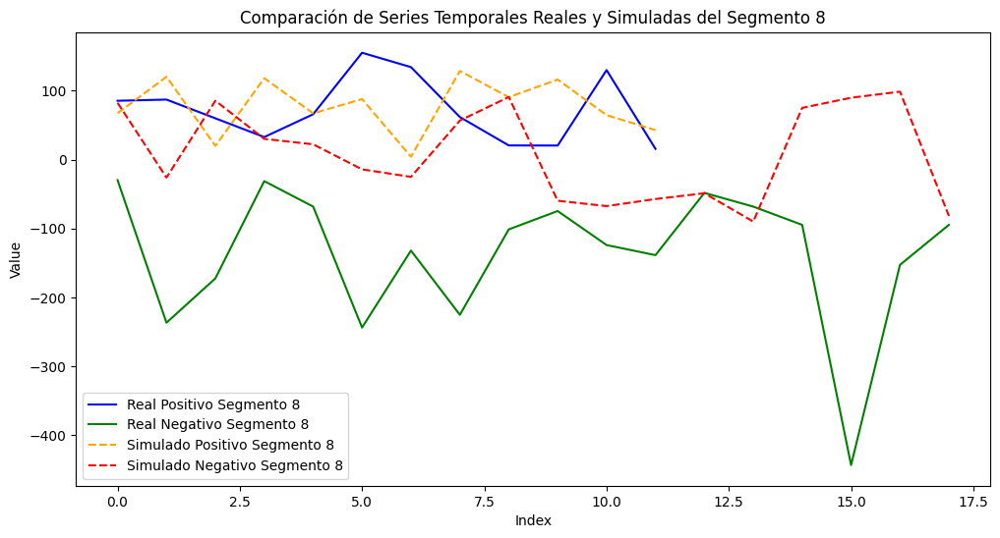

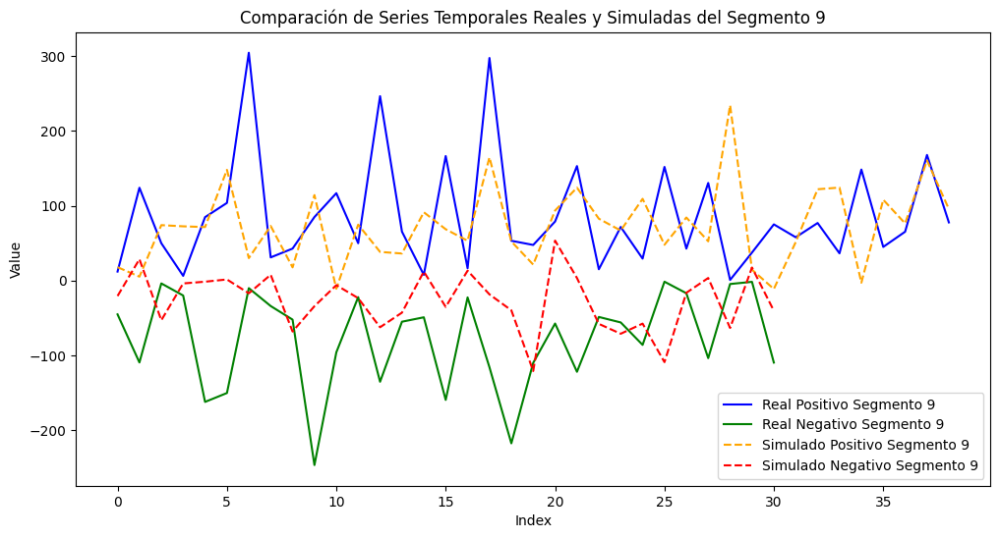

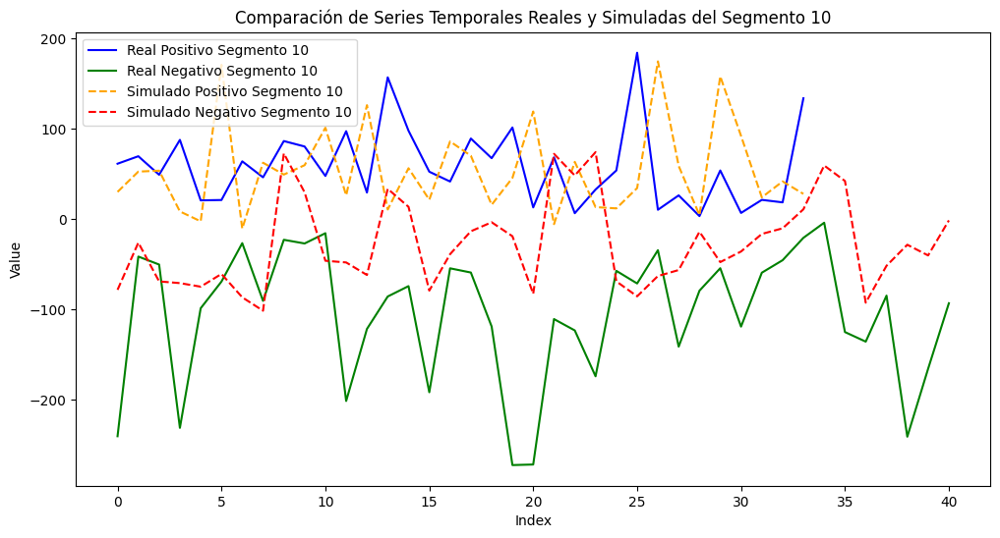

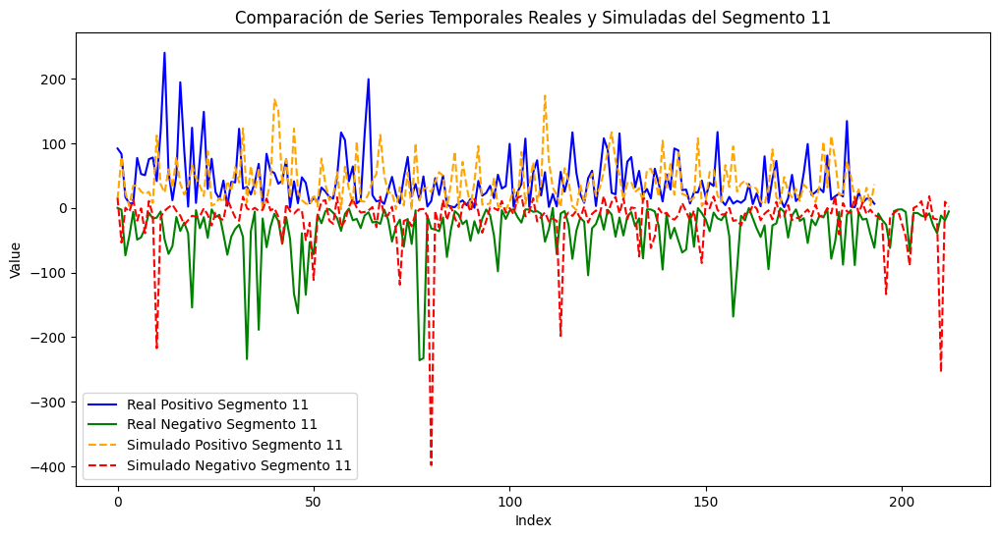

In [22]:
for i, segment in enumerate(segments):
    # Filtrar tasas positivas y negativas
    real_pos = segment[segment > 0]
    real_neg = segment[segment < 0]
    
    # Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    # Rellenar las series simuladas para hacer coincidir las longitudes
    max_length_pos = max(len(real_pos), len(simulated_pos))
    max_length_neg = max(len(real_neg), len(simulated_neg))
    
    real_pos_padded = pad_series_with_mean(real_pos, max_length_pos)
    real_neg_padded = pad_series_with_mean(real_neg, max_length_neg)
    simulated_pos_padded = pad_series_with_mean(simulated_pos, max_length_pos)
    simulated_neg_padded = pad_series_with_mean(simulated_neg, max_length_neg)

    plt.figure(figsize=(12, 6))

    # Graficar las series de tiempo reales
    plt.plot(range(len(real_pos_padded)), real_pos_padded, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg_padded)), real_neg_padded, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    
    # Graficar las series de tiempo simuladas
    plt.plot(range(len(simulated_pos_padded)), simulated_pos_padded, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg_padded)), simulated_neg_padded, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas del Segmento {i+1}')
    plt.legend()
    plt.show()

In [23]:
def calculate_statistics(data):
    stats = {
        'media': np.mean(data) if len(data) > 0 else np.nan,
        'varianza': np.var(data) if len(data) > 0 else np.nan,
    }
    return stats
stats_real_pos = []
stats_real_neg = []
stats_simulated_pos = []
stats_simulated_neg = []

for i, segment in enumerate(segments):
    real_pos = segment[segment > 0]
    real_neg = segment[segment < 0]
    
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    stats_real_pos.append(calculate_statistics(real_pos))
    stats_real_neg.append(calculate_statistics(real_neg))
    stats_simulated_pos.append(calculate_statistics(simulated_pos))
    stats_simulated_neg.append(calculate_statistics(simulated_neg))

def print_comparison_stats(real_stats, simulated_stats, segment, rate_type):
    print(f"Segmento {segment + 1} - {rate_type}")
    print(f"{'Estadística':<15} {'Real':<15} {'Simulado':<15}")
    for key in real_stats:
        print(f"{key:<15} {real_stats[key]:<15} {simulated_stats[key]:<15}")
    print("\n")

for i in range(len(segments)):
    print_comparison_stats(stats_real_pos[i], stats_simulated_pos[i], i, "Positivo")
    print_comparison_stats(stats_real_neg[i], stats_simulated_neg[i], i, "Negativo")

Segmento 1 - Positivo
Estadística     Real            Simulado       
media           16.510075233830847 18.088474798540414
varianza        754.1241993531548 1374.1405526459362


Segmento 1 - Negativo
Estadística     Real            Simulado       
media           -15.641896561525131 -12.088933537001811
varianza        777.40707951535 1425.5817025016265


Segmento 2 - Positivo
Estadística     Real            Simulado       
media           107.47779890322582 116.2744856779181
varianza        12553.289234347087 12752.03726430583


Segmento 2 - Negativo
Estadística     Real            Simulado       
media           -77.31141871428574 -21.766507650803927
varianza        2963.801972779053 737.5352062618707


Segmento 3 - Positivo
Estadística     Real            Simulado       
media           120.61899263636363 122.65857964999549
varianza        12980.117046394342 17218.131644152552


Segmento 3 - Negativo
Estadística     Real            Simulado       
media           -165.28173164864864

## Toca volverse loco... LSTM + GPD

In [24]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from scipy.stats import genpareto

In [25]:
def create_dataset(data, look_back):
    X, Y = [], []
    for i in range(len(data) - look_back):
        a = data[i:(i + look_back)]
        X.append(a)
        Y.append(data[i + look_back])
    return np.array(X), np.array(Y)

look_back = 5  #Número de pasos de tiempo que el modelo LSTM verá

#Preparación de los datos de cada segmento para LSTM
X_all, Y_all = [], []

for segment in segments:
    data = np.array(segment)
    X, Y = create_dataset(data, look_back)
    X_all.extend(X)
    Y_all.extend(Y)

X_all = np.array(X_all)
Y_all = np.array(Y_all)

###Reeshape para LSTM [samples, time steps, features]
X_all = np.reshape(X_all, (X_all.shape[0], X_all.shape[1], 1))

#$$...............Entrenamiento del Modelo LSTM
model = Sequential()
model.add(LSTM(50, input_shape=(look_back, 1)))
model.add(Dense(1))
model.compile(loss='mean_squared_error', optimizer='rmsprop')
model.fit(X_all, Y_all, epochs=300, batch_size=32, verbose=2)

# Predicción y Cálculo de Residuos
predictions = model.predict(X_all)
residuals = Y_all - predictions.flatten()

Epoch 1/300


c:\Users\Angel Lopez\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\layers\rnn\rnn.py:200: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


62/62 - 1s - 19ms/step - loss: 5493.2090
Epoch 2/300
62/62 - 0s - 3ms/step - loss: 5491.2236
Epoch 3/300
62/62 - 0s - 3ms/step - loss: 5489.9004
Epoch 4/300
62/62 - 0s - 3ms/step - loss: 5488.6758
Epoch 5/300
62/62 - 0s - 3ms/step - loss: 5487.2324
Epoch 6/300
62/62 - 0s - 3ms/step - loss: 5486.6650
Epoch 7/300
62/62 - 0s - 3ms/step - loss: 5485.0894
Epoch 8/300
62/62 - 0s - 3ms/step - loss: 5484.1816
Epoch 9/300
62/62 - 0s - 3ms/step - loss: 5482.7515
Epoch 10/300
62/62 - 0s - 3ms/step - loss: 5481.7451
Epoch 11/300
62/62 - 0s - 3ms/step - loss: 5480.0088
Epoch 12/300
62/62 - 0s - 3ms/step - loss: 5478.7051
Epoch 13/300
62/62 - 0s - 3ms/step - loss: 5477.0884
Epoch 14/300
62/62 - 0s - 3ms/step - loss: 5475.2378
Epoch 15/300
62/62 - 0s - 3ms/step - loss: 5473.7168
Epoch 16/300
62/62 - 0s - 3ms/step - loss: 5471.0039
Epoch 17/300
62/62 - 0s - 3ms/step - loss: 5468.5942
Epoch 18/300
62/62 - 0s - 3ms/step - loss: 5466.4761
Epoch 19/300
62/62 - 0s - 3ms/step - loss: 5463.8130
Epoch 20/300


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━

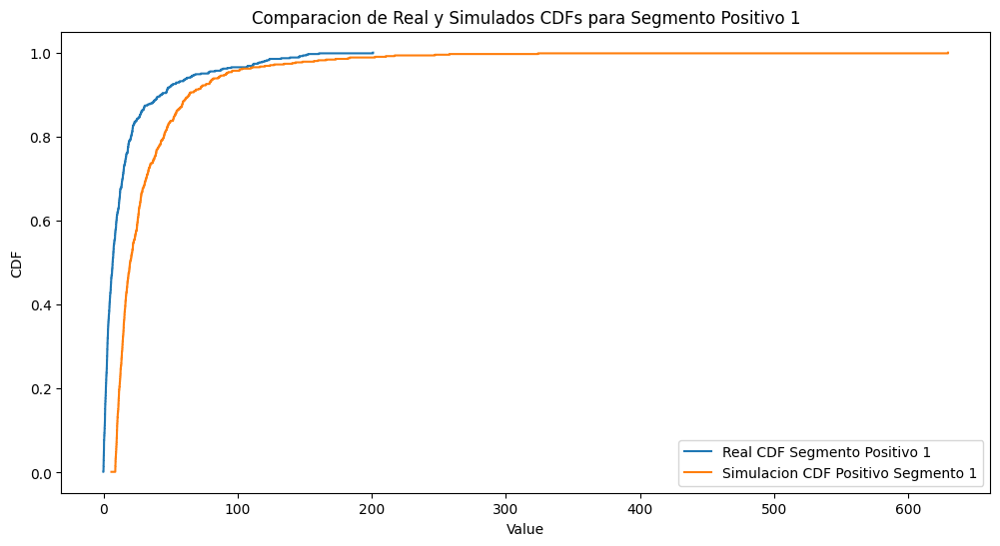

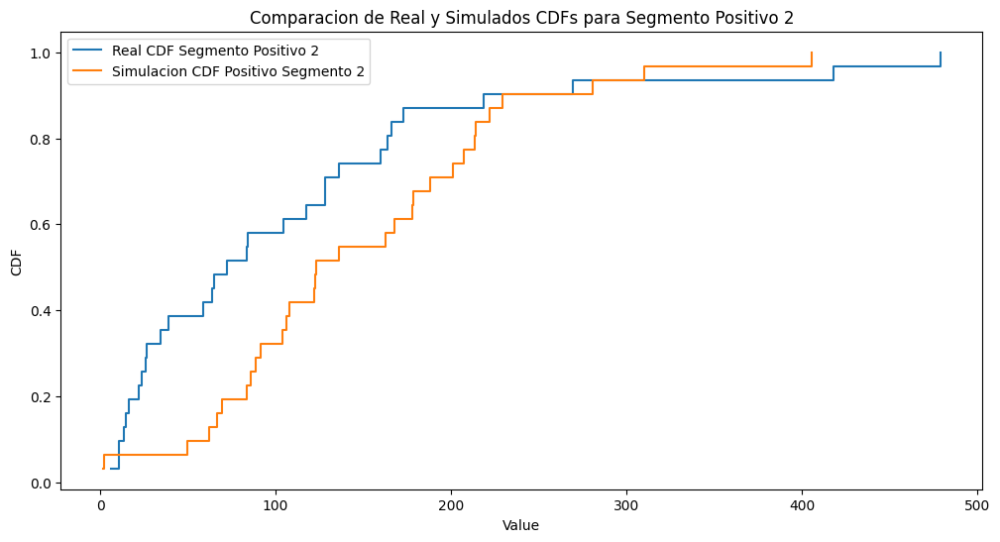

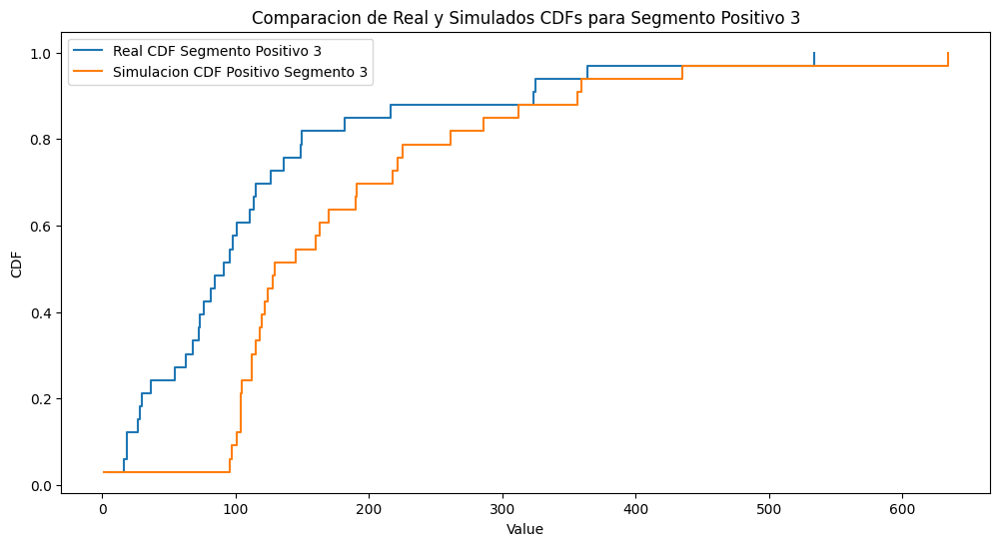

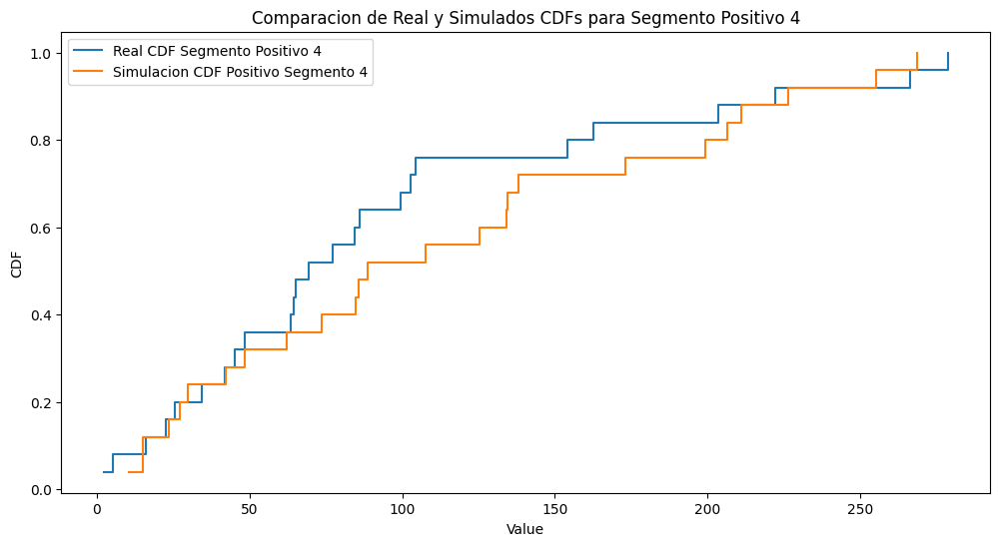

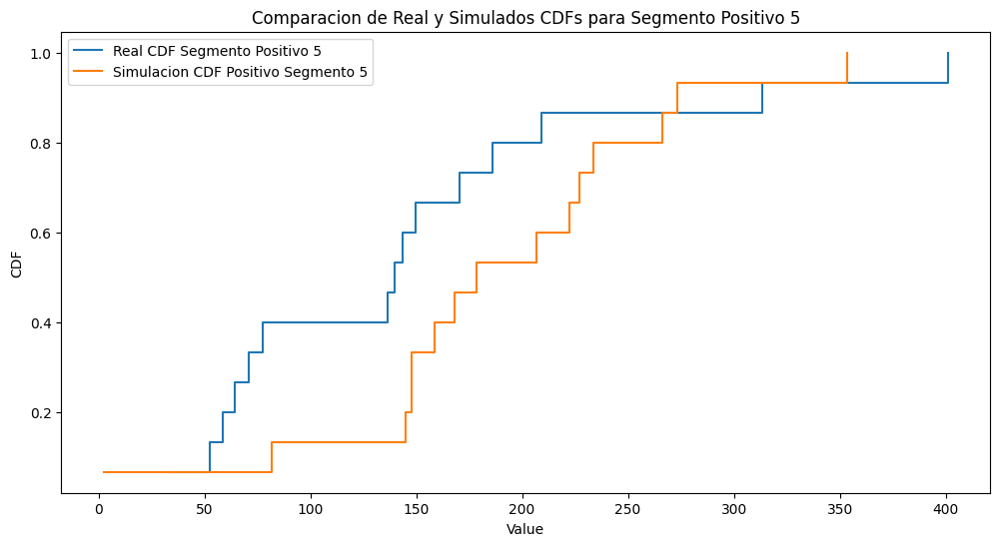

...

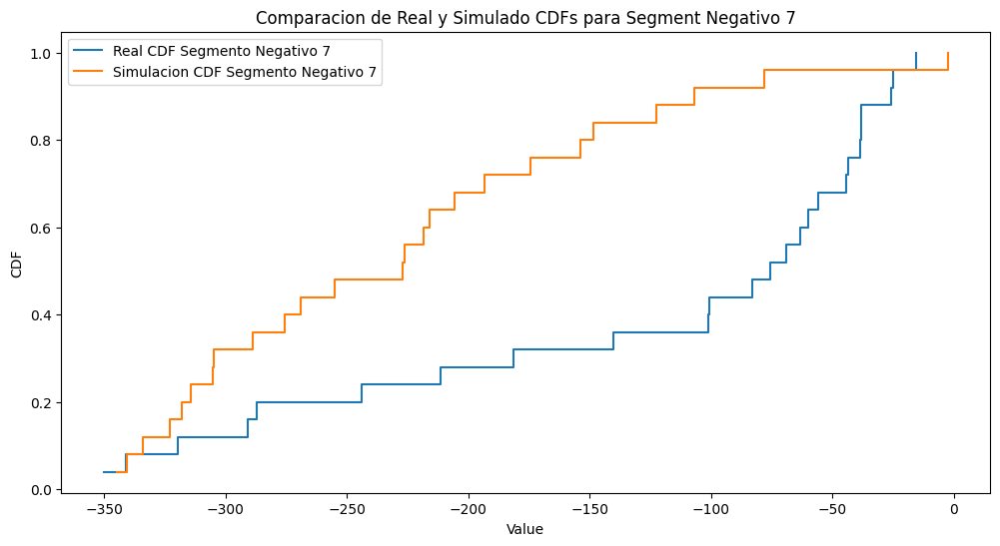

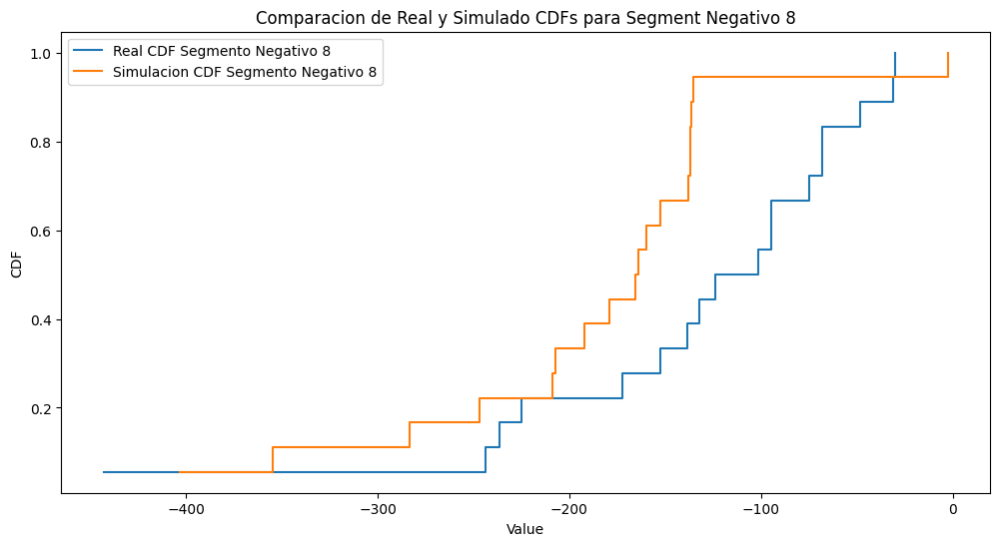

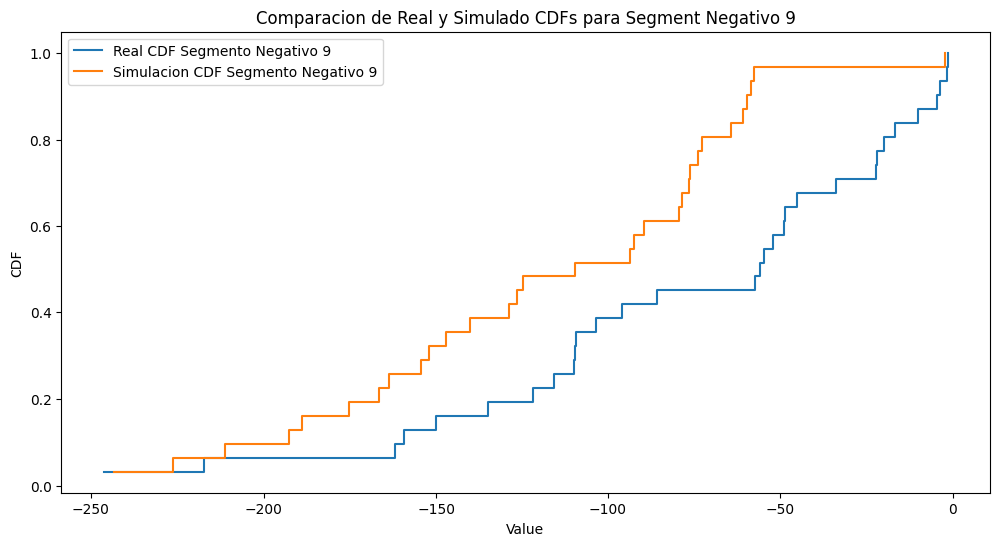

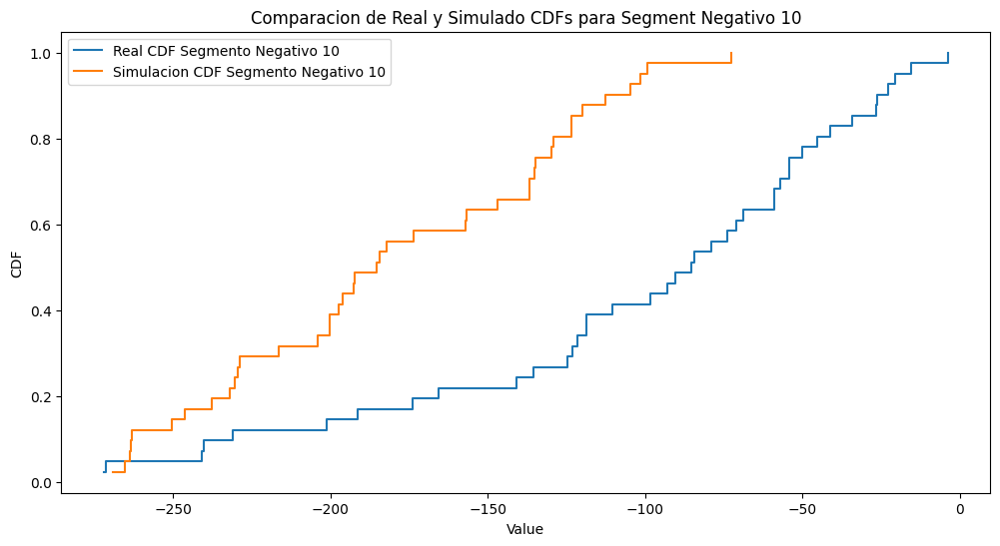

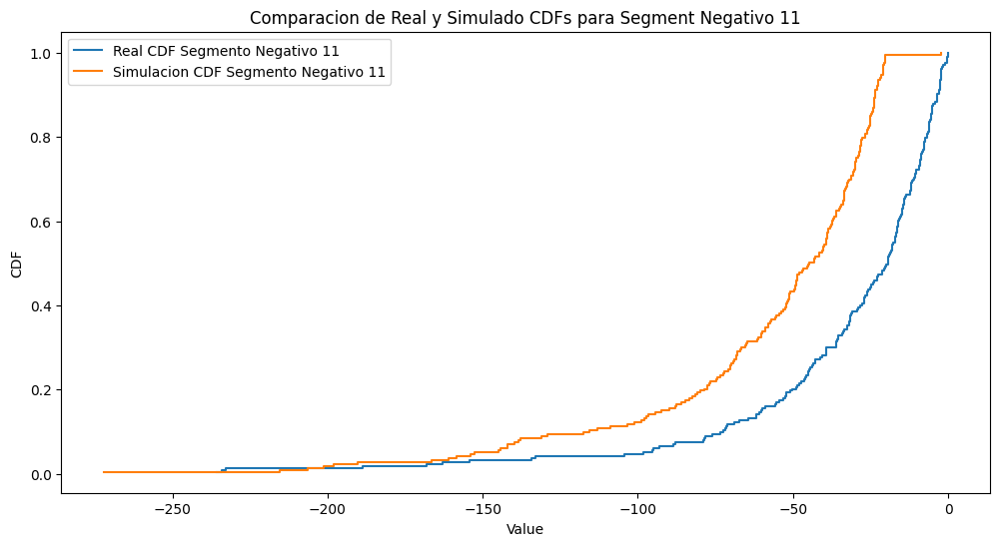

In [26]:
simulated_cdfs_pos = []
simulated_cdfs_neg = []
real_cdfs_pos = []
real_cdfs_neg = []
simulated_data_pos = []
simulated_data_neg = []

# Función para rellenar datos
def pad_series_with_mean(data, target_length):
    padding_length = target_length - len(data)
    if padding_length > 0:
        mean_value = np.mean(data) if len(data) > 0 else 0
        padding = np.full(padding_length, mean_value)
        padded_data = np.concatenate([data, padding])
    else:
        padded_data = data
    return padded_data

# Analizar cada segmento
for i, segment in enumerate(segments):
    segment_df = pd.DataFrame(segment, columns=['value'])
    data = np.array(segment_df['value'])  # Convertir a array de NumPy

    # Separar tasas positivas y negativas
    data_pos = data[data >= 0]
    data_neg = data[data < 0]

    # Análisis para tasas positivas
    if len(data_pos) > 0:
        umbral_pos = find_threshold(data_pos)
        excesos_pos = data_pos[data_pos > umbral_pos] - umbral_pos
        
        if len(excesos_pos) > 0:
            shape_pos, loc_pos, scale_pos = genpareto.fit(excesos_pos)
            
            # Simulación usando LSTM y GPD
            simulated_segment_pos = []
            positive_mode = False
            
            for j in range(len(data_pos)):
                if data_pos[j] > umbral_pos or positive_mode:
                    simulated_value = umbral_pos + genpareto.rvs(c=shape_pos, loc=loc_pos, scale=scale_pos)
                else:
                    input_seq = np.array(segment[max(0, j-look_back):j])
                    input_seq = pad_series_with_mean(input_seq, look_back)
                    input_seq = input_seq.reshape((1, look_back, 1))
                    predicted_value = model.predict(input_seq)[0][0]
                    simulated_value = predicted_value

                if simulated_value <= 0:
                    positive_mode = True
                    simulated_value = np.abs(simulated_value)

                simulated_segment_pos.append(simulated_value)

            simulated_data_pos.append(np.array(simulated_segment_pos))

            sorted_real_data_pos = np.sort(data_pos)
            cdf_real_data_pos = np.arange(1, len(sorted_real_data_pos) + 1) / len(sorted_real_data_pos)
            real_cdfs_pos.append((sorted_real_data_pos, cdf_real_data_pos))

            sorted_simulated_data_pos = np.sort(simulated_segment_pos)
            cdf_simulated_data_pos = np.arange(1, len(sorted_simulated_data_pos) + 1) / len(sorted_simulated_data_pos)
            simulated_cdfs_pos.append((sorted_simulated_data_pos, cdf_simulated_data_pos))

    # Análisis para tasas negativas
    if len(data_neg) > 0:
        umbral_neg = find_threshold(data_neg)
        excesos_neg = np.abs(data_neg) - np.abs(umbral_neg)
        excesos_neg = excesos_neg[excesos_neg > 0]
        
        if len(excesos_neg) > 0:
            shape_neg, loc_neg, scale_neg = genpareto.fit(excesos_neg)
            
            # Simulación usando LSTM y GPD
            simulated_segment_neg = []
            negative_mode = False

            for j in range(len(data_neg)):
                if np.abs(data_neg[j]) > np.abs(umbral_neg) or negative_mode:
                    simulated_value = -1 * (np.abs(umbral_neg) + genpareto.rvs(c=shape_neg, loc=loc_neg, scale=scale_neg))
                else:
                    input_seq = np.array(segment[max(0, j-look_back):j])
                    input_seq = pad_series_with_mean(input_seq, look_back)
                    input_seq = input_seq.reshape((1, look_back, 1))
                    predicted_value = model.predict(input_seq)[0][0]
                    simulated_value = predicted_value

                if simulated_value >= 0:
                    negative_mode = True
                    simulated_value = -np.abs(simulated_value)

                simulated_segment_neg.append(simulated_value)

            simulated_data_neg.append(np.array(simulated_segment_neg))

            sorted_real_data_neg = np.sort(data_neg)
            cdf_real_data_neg = np.arange(1, len(sorted_real_data_neg) + 1) / len(sorted_real_data_neg)
            real_cdfs_neg.append((sorted_real_data_neg, cdf_real_data_neg))

            sorted_simulated_data_neg = np.sort(simulated_segment_neg)
            cdf_simulated_data_neg = np.arange(1, len(sorted_simulated_data_neg) + 1) / len(sorted_simulated_data_neg)
            simulated_cdfs_neg.append((sorted_simulated_data_neg, cdf_simulated_data_neg))

# Graficar y comparar las CDFs positivas
num_segments_pos = len(real_cdfs_pos)
for i in range(num_segments_pos):
    plt.figure(figsize=(12, 6))
    sorted_real_data_pos, cdf_real_data_pos = real_cdfs_pos[i]
    sorted_simulated_data_pos, cdf_simulated_data_pos = simulated_cdfs_pos[i]

    plt.step(sorted_real_data_pos, cdf_real_data_pos, where='post', label=f'Real CDF Segmento Positivo {i+1}')
    plt.step(sorted_simulated_data_pos, cdf_simulated_data_pos, where='post', linestyle='-', label=f'Simulacion CDF Positivo Segmento {i+1}')

    plt.xlabel('Value')
    plt.ylabel('CDF')
    plt.title(f'Comparacion de Real y Simulados CDFs para Segmento Positivo {i+1}')
    plt.legend()
    plt.show()

# Graficar y comparar las CDFs negativas
num_segments_neg = len(real_cdfs_neg)
for i in range(num_segments_neg):
    plt.figure(figsize=(12, 6))
    sorted_real_data_neg, cdf_real_data_neg = real_cdfs_neg[i]
    sorted_simulated_data_neg, cdf_simulated_data_neg = simulated_cdfs_neg[i]

    plt.step(sorted_real_data_neg, cdf_real_data_neg, where='post', label=f'Real CDF Segmento Negativo {i+1}')
    plt.step(sorted_simulated_data_neg, cdf_simulated_data_neg, where='post', linestyle='-', label=f'Simulacion CDF Segmento Negativo {i+1}')

    plt.xlabel('Value')
    plt.ylabel('CDF')
    plt.title(f'Comparacion de Real y Simulado CDFs para Segment Negativo {i+1}')
    plt.legend()
    plt.show()

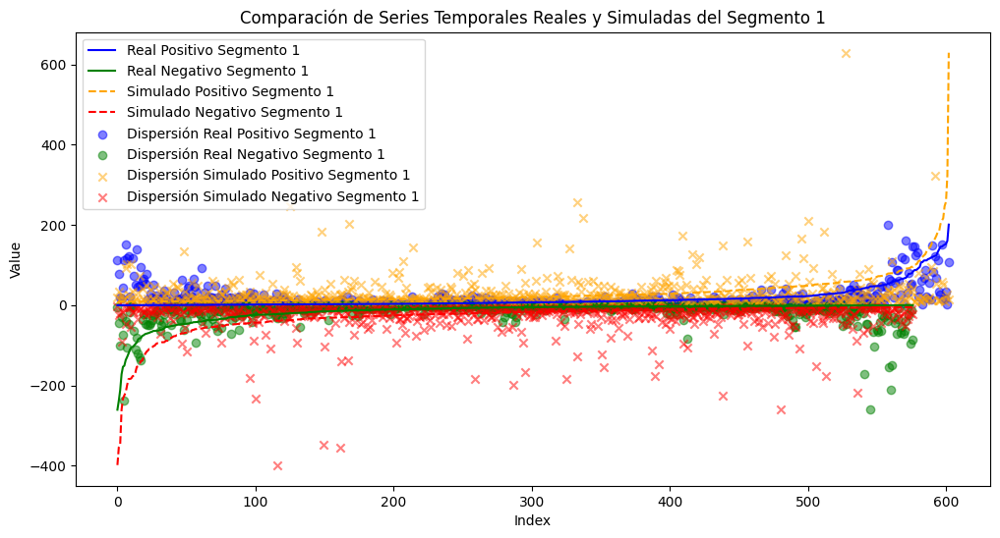

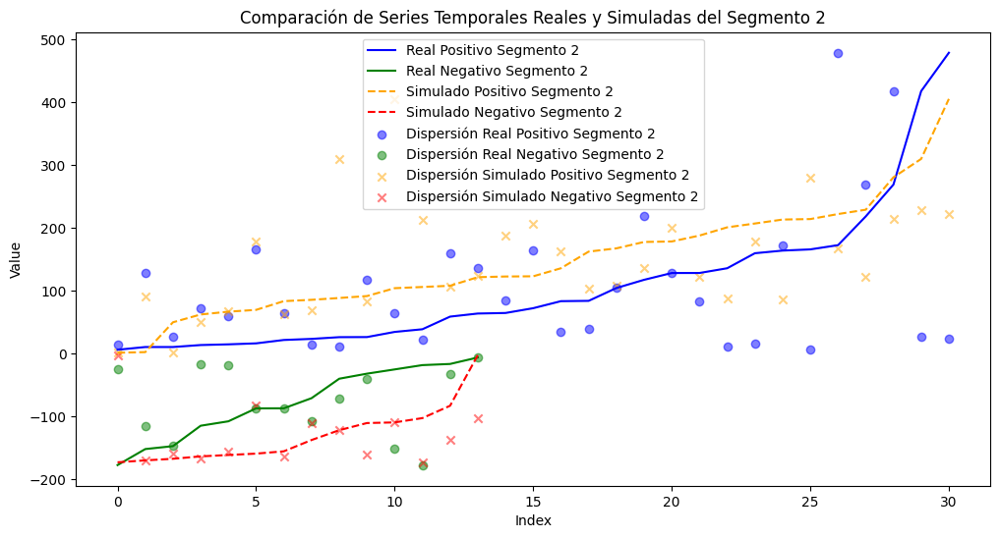

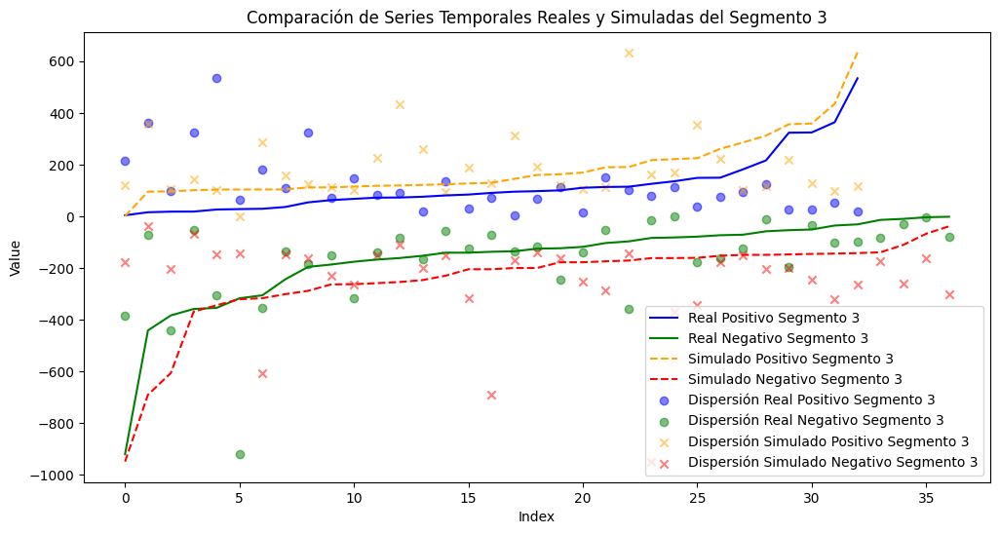

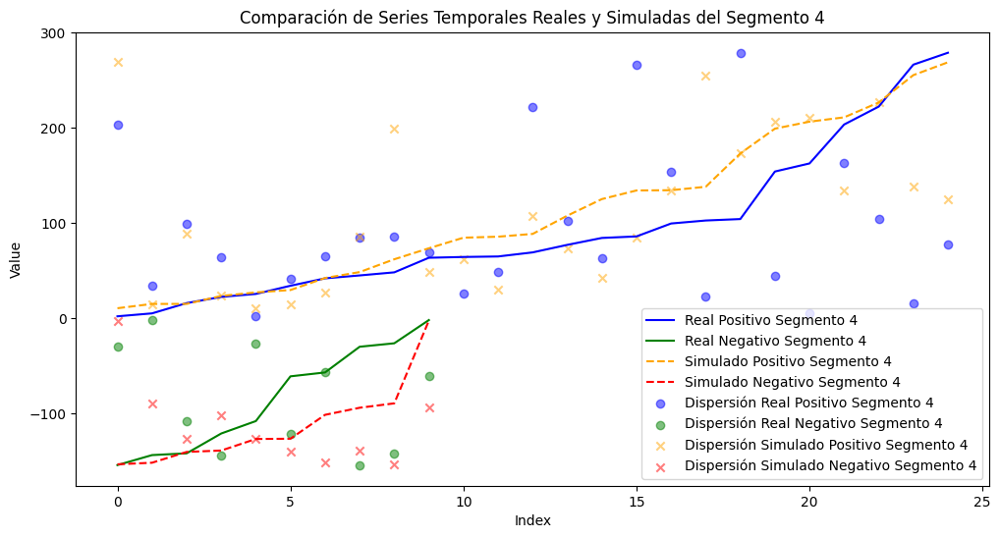

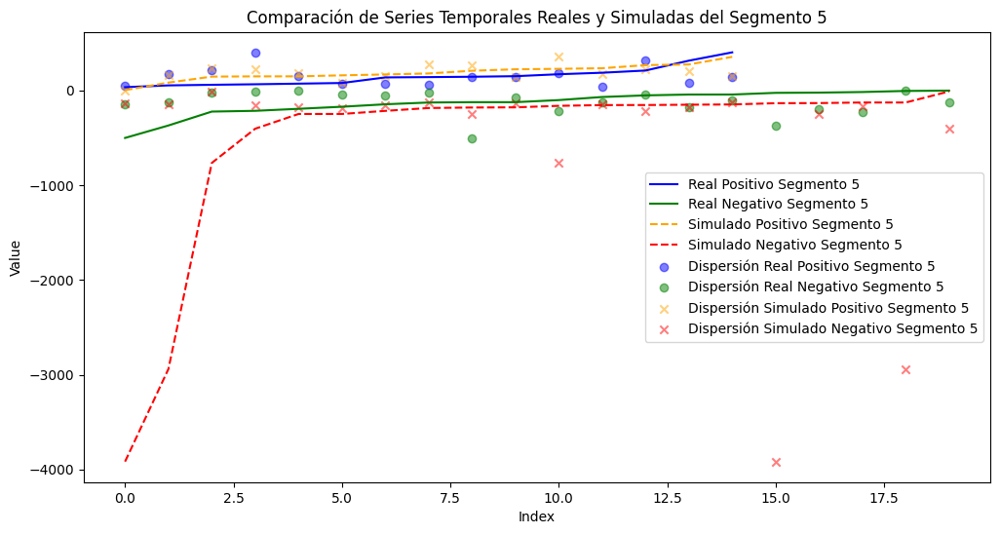

...

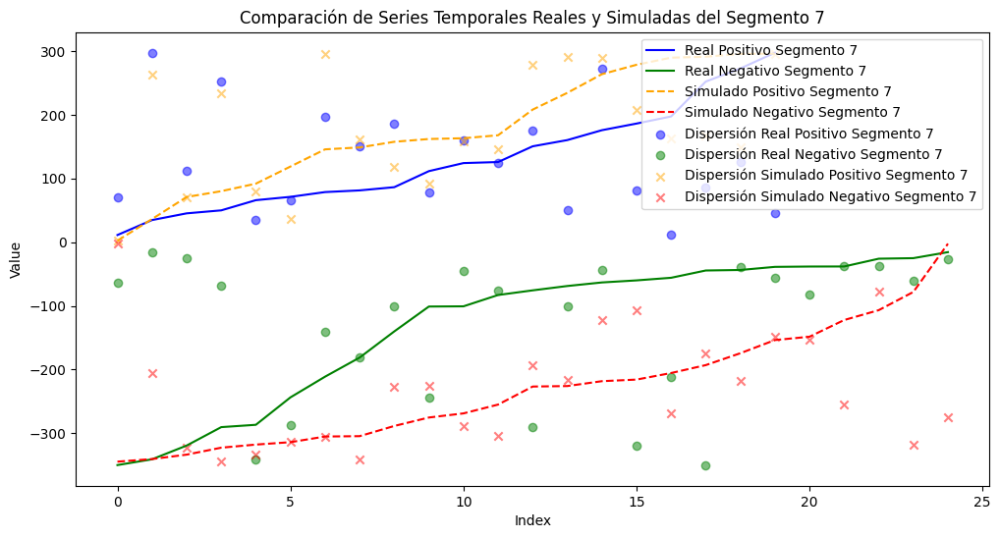

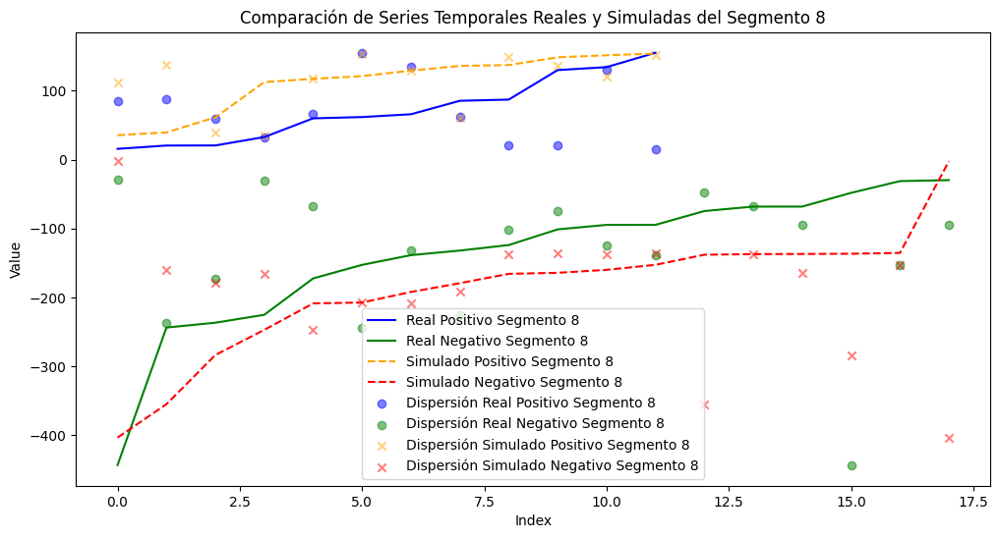

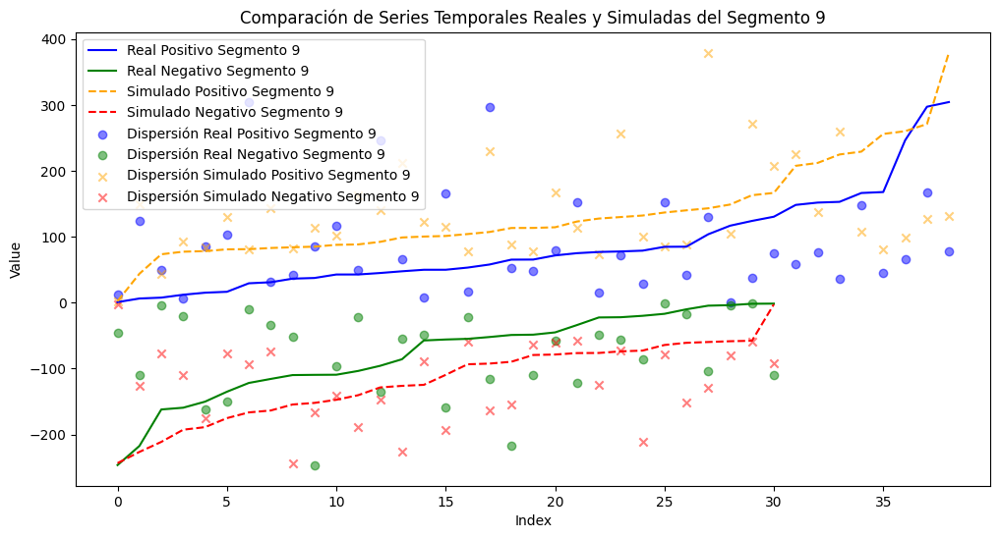

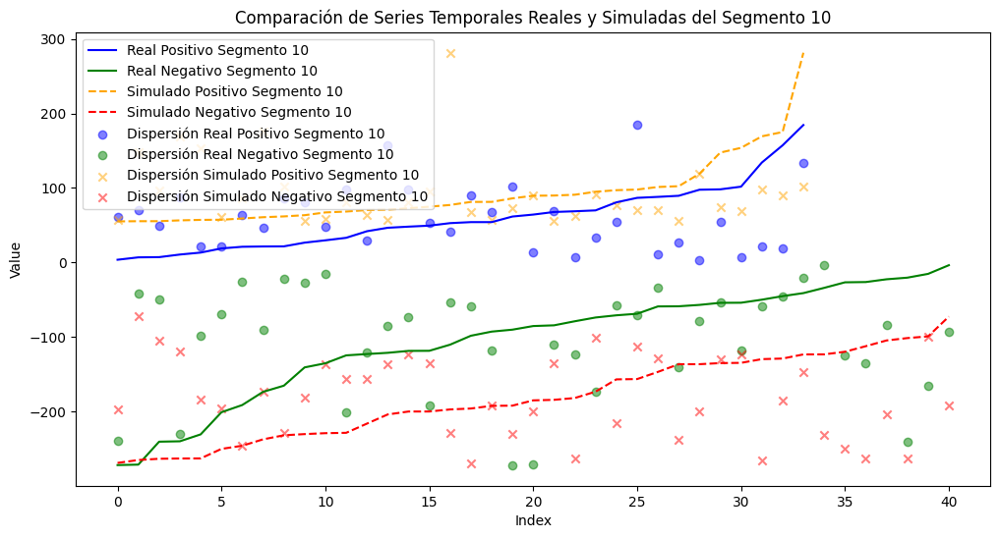

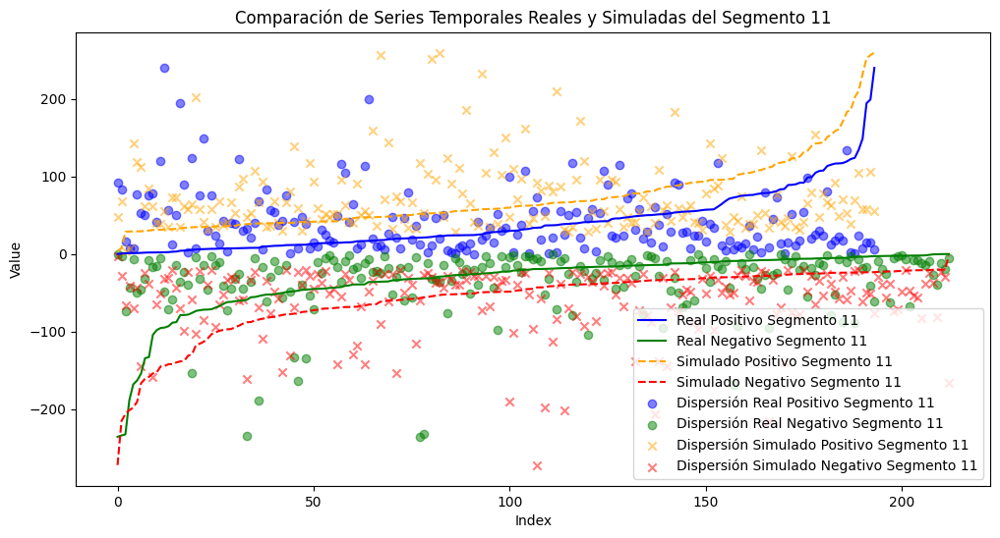

In [27]:
for i, segment in enumerate(segments):
    # Filtrar tasas positivas y negativas
    real_pos = segment[segment >= 0]
    real_neg = segment[segment < 0]
    
    # Ordenar las tasas positivas y negativas
    real_pos_sorted = np.sort(real_pos)
    real_neg_sorted = np.sort(real_neg)
    
    # Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    # Ordenar las simulaciones positivas y negativas
    simulated_pos_sorted = np.sort(simulated_pos)
    simulated_neg_sorted = np.sort(simulated_neg)

    plt.figure(figsize=(12, 6))

    # Graficar los datos reales y simulados
    plt.plot(range(len(real_pos_sorted)), real_pos_sorted, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg_sorted)), real_neg_sorted, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    plt.plot(range(len(simulated_pos_sorted)), simulated_pos_sorted, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg_sorted)), simulated_neg_sorted, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')
    
    # Dispersión de los datos reales
    plt.scatter(range(len(real_pos)), real_pos, color='blue', alpha=0.5, marker='o', label=f'Dispersión Real Positivo Segmento {i+1}')
    plt.scatter(range(len(real_neg)), real_neg, color='green', alpha=0.5, marker='o', label=f'Dispersión Real Negativo Segmento {i+1}')
    
    # Dispersión de los datos simulados
    plt.scatter(range(len(simulated_pos)), simulated_pos, color='orange', alpha=0.5, marker='x', label=f'Dispersión Simulado Positivo Segmento {i+1}')
    plt.scatter(range(len(simulated_neg)), simulated_neg, color='red', alpha=0.5, marker='x', label=f'Dispersión Simulado Negativo Segmento {i+1}')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas del Segmento {i+1}')
    plt.legend()
    plt.show()

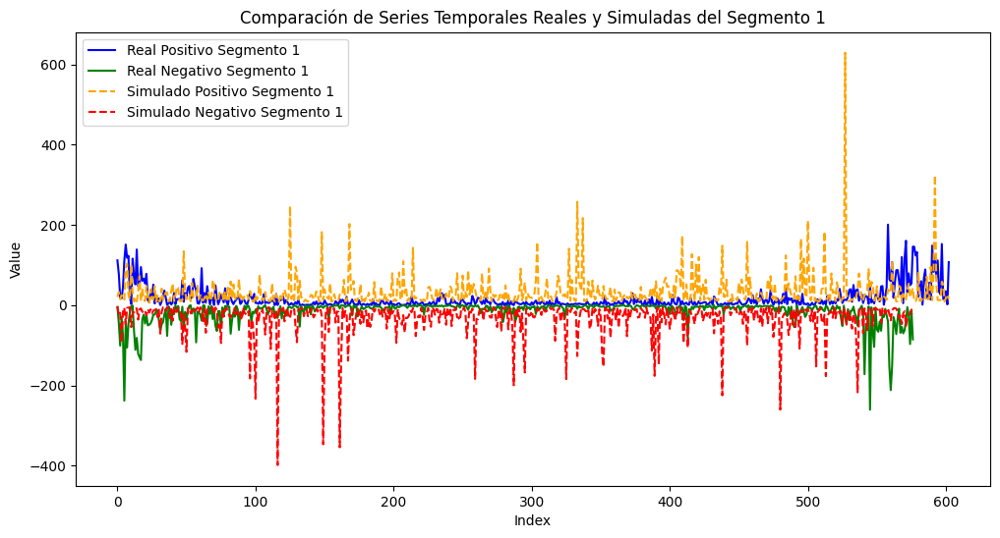

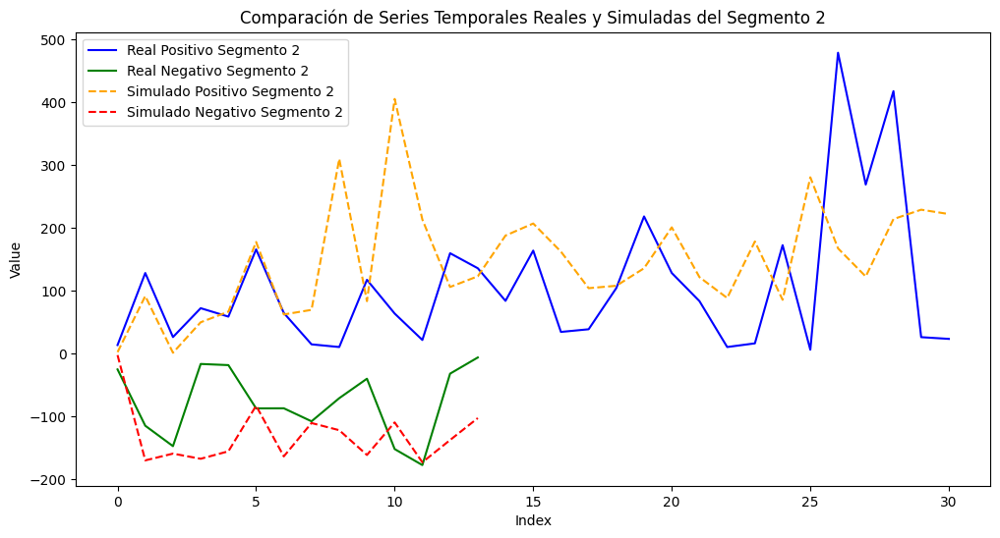

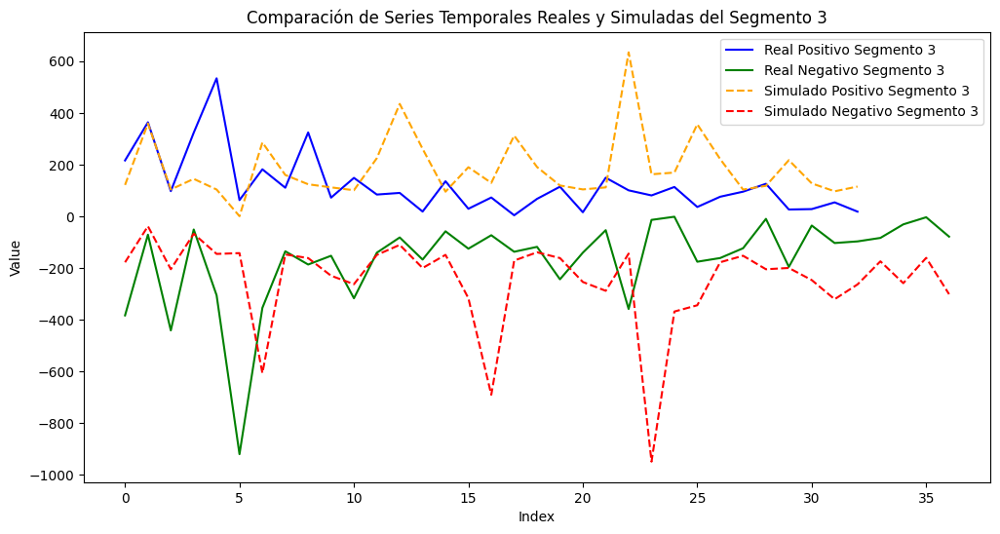

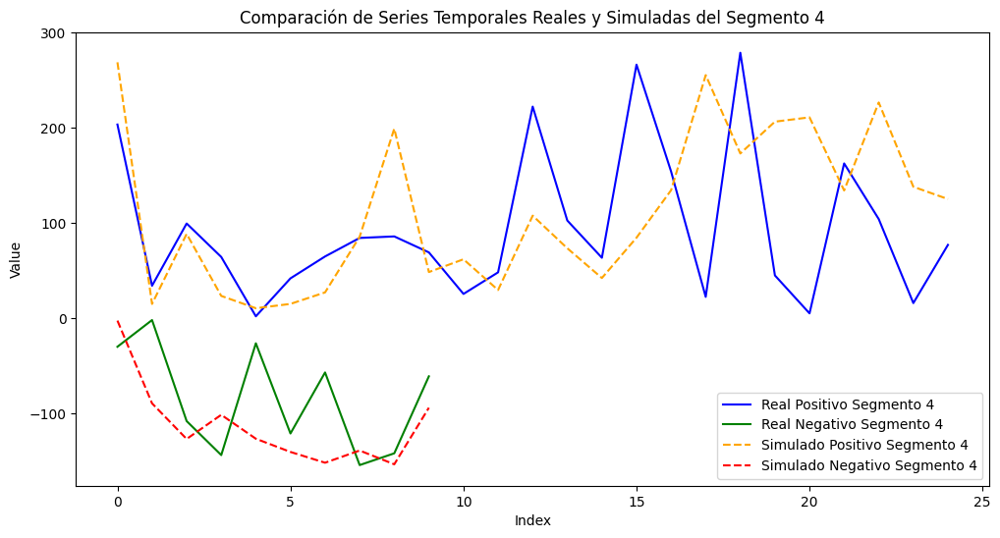

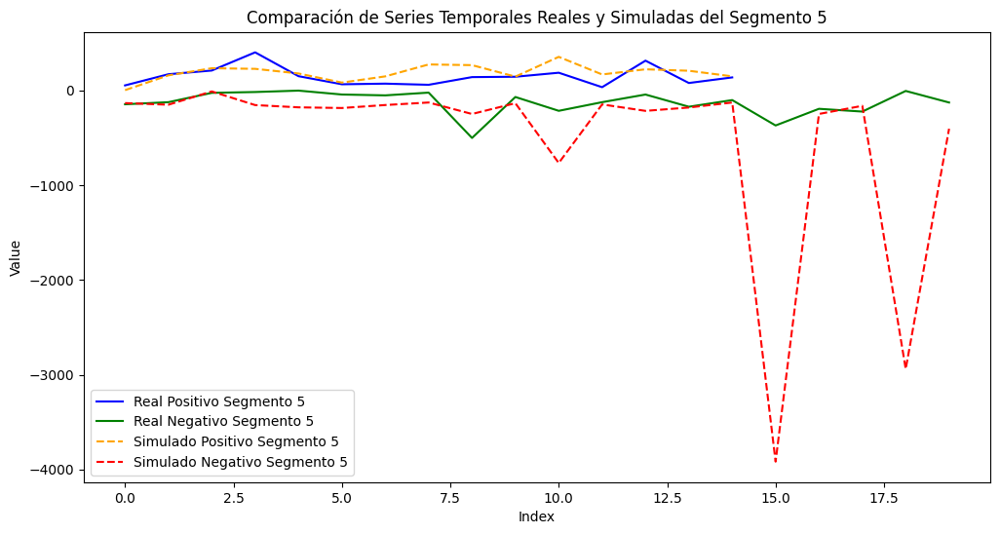

...

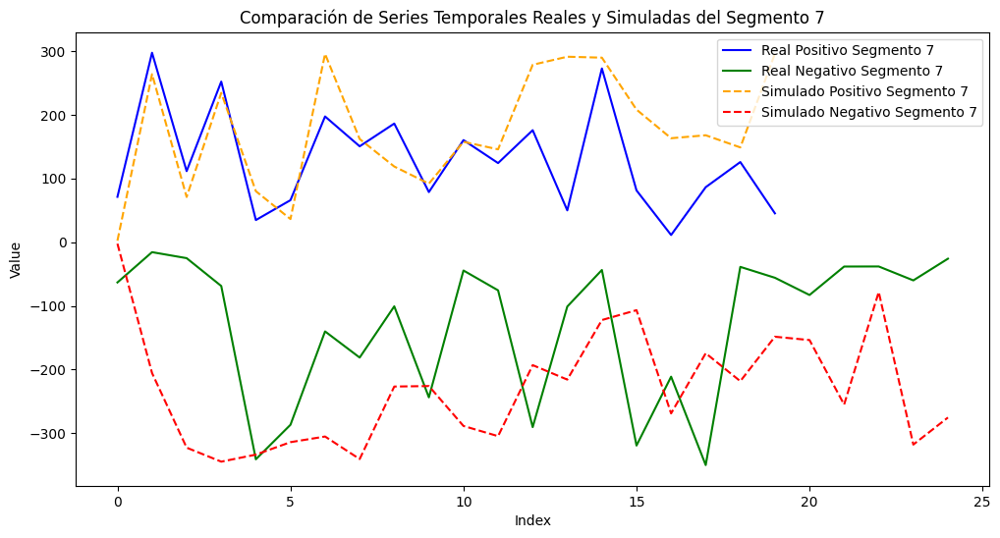

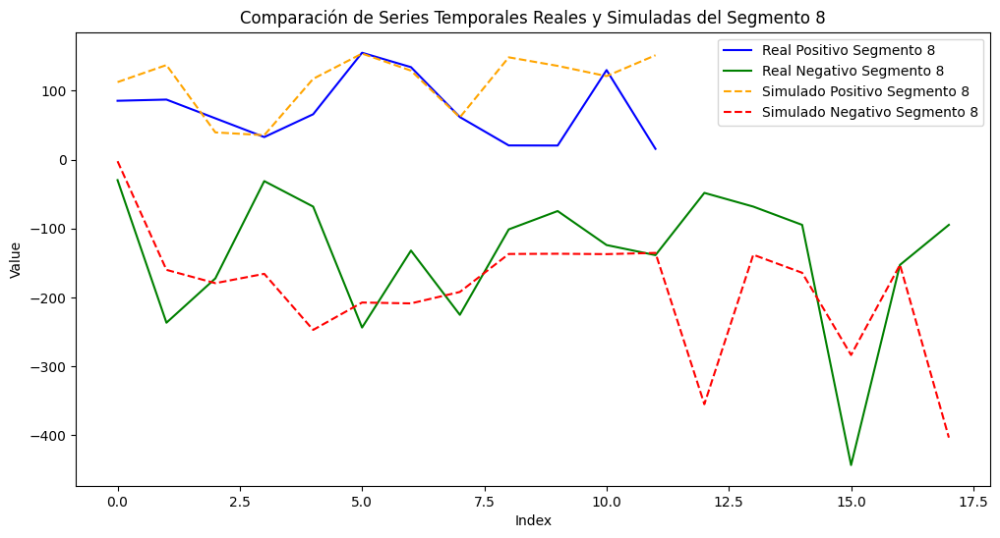

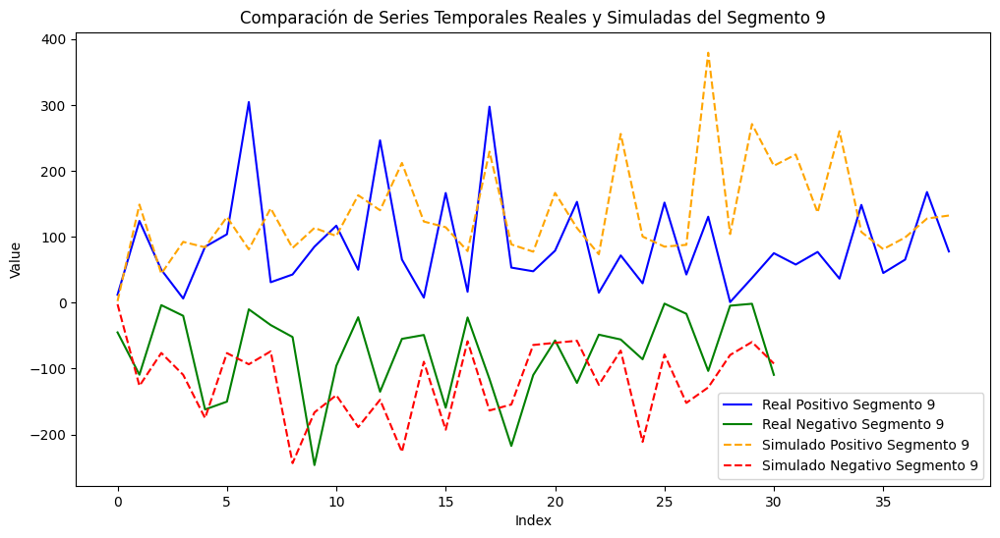

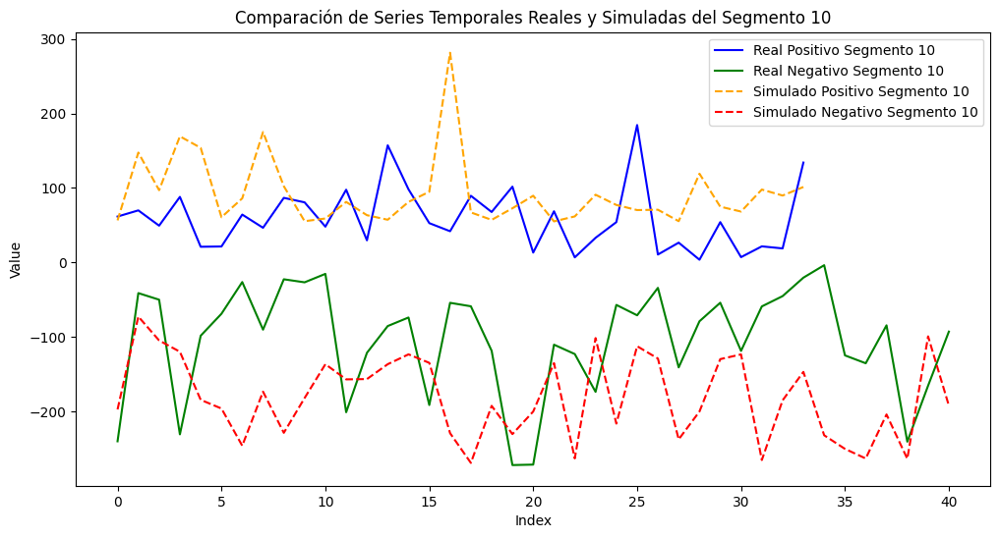

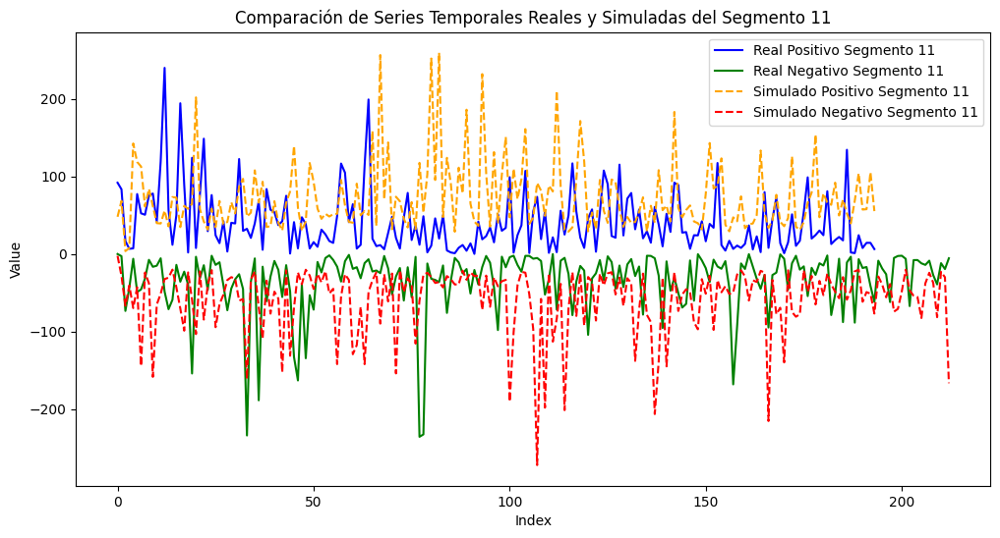

In [28]:
for i, segment in enumerate(segments):
    # Filtrar tasas positivas y negativas
    real_pos = segment[segment >= 0]
    real_neg = segment[segment < 0]
    
    # Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    # Interpolación para hacer coincidir las longitudes
    if len(simulated_pos) < len(real_pos):
        simulated_pos = np.interp(np.linspace(0, len(simulated_pos), len(real_pos)), np.arange(len(simulated_pos)), simulated_pos)
    if len(simulated_neg) < len(real_neg):
        simulated_neg = np.interp(np.linspace(0, len(simulated_neg), len(real_neg)), np.arange(len(simulated_neg)), simulated_neg)

    plt.figure(figsize=(12, 6))

    # Graficar las series de tiempo reales
    plt.plot(range(len(real_pos)), real_pos, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg)), real_neg, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    
    # Graficar las series de tiempo simuladas
    plt.plot(range(len(simulated_pos)), simulated_pos, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg)), simulated_neg, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales y Simuladas del Segmento {i+1}')
    plt.legend()
    plt.show()

In [29]:
historico = aux.flatten()

NameError: name 'aux' is not defined

In [ ]:
diff_historico = np.diff(historico)

In [ ]:
for i, segment in enumerate(segments):
    # Reconstruir el segmento histórico original
    if start_idx == 0:
        initial_value = historico[start_idx]
    else:
        initial_value = historico[result[i-1]]
    reconstructed_segment = np.concatenate(([initial_value], segment)).cumsum()
    
    # Filtrar tasas positivas y negativas
    real_pos = segment[segment >= 0]
    real_neg = segment[segment < 0]
    
    # Simulaciones positivas y negativas
    simulated_pos = simulated_data_pos[i] if i < len(simulated_data_pos) else np.array([])
    simulated_neg = simulated_data_neg[i] if i < len(simulated_data_neg) else np.array([])
    
    # Interpolación para hacer coincidir las longitudes
    if len(simulated_pos) < len(real_pos):
        simulated_pos = np.interp(np.linspace(0, len(simulated_pos), len(real_pos)), np.arange(len(simulated_pos)), simulated_pos)
    if len(simulated_neg) < len(real_neg):
        simulated_neg = np.interp(np.linspace(0, len(simulated_neg), len(real_neg)), np.arange(len(simulated_neg)), simulated_neg)
    
    # Reconstruir el segmento simulado
    reconstructed_simulated_segment = np.concatenate(([initial_value], np.concatenate((simulated_pos, simulated_neg)))).cumsum()

    plt.figure(figsize=(12, 6))

    # Graficar las series de tiempo reales
    plt.plot(range(len(real_pos)), real_pos, label=f'Real Positivo Segmento {i+1}', color='blue', linestyle='-')
    plt.plot(range(len(real_neg)), real_neg, label=f'Real Negativo Segmento {i+1}', color='green', linestyle='-')
    
    # Graficar las series de tiempo simuladas
    plt.plot(range(len(simulated_pos)), simulated_pos, label=f'Simulado Positivo Segmento {i+1}', color='orange', linestyle='--')
    plt.plot(range(len(simulated_neg)), simulated_neg, label=f'Simulado Negativo Segmento {i+1}', color='red', linestyle='--')

    # Graficar los datos históricos originales reconstruidos
    plt.plot(range(len(reconstructed_segment)), reconstructed_segment, label='Histórico Reconstruido', color='purple', linestyle='-.')

    # Graficar los datos históricos reconstruidos a partir de las simulaciones
    plt.plot(range(len(reconstructed_simulated_segment)), reconstructed_simulated_segment, label='Histórico Simulado Reconstruido', color='brown', linestyle='-.')
    
    plt.xlabel('Index')
    plt.ylabel('Value')
    plt.title(f'Comparación de Series Temporales Reales, Simuladas y Reconstruidas del Segmento {i+1}')
    plt.legend()
    plt.show()